/pscratch/sd/k/kevinval/envs/pixnerd/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Files already downloaded and verified

Experiment: perceiver_encoder | encoder_type=perceiver
ckpt: /pscratch/sd/k/kevinval/PNBase/PixNerd/workdirs/exp_cifar10_perceiver/checkpoints/last-v1.ckpt


current sampler is ODE sampler, but w_scheduler is enabled
/tmp/ipykernel_846684/521795881.py:146: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(ckpt_path,

Metrics: {'mse32_full': 0.03705799579620361, 'mse32_noncond': 0.046333808451890945, 'mse128_full': 0.03286422789096832, 'mse128_noncond': 0.03316926956176758}


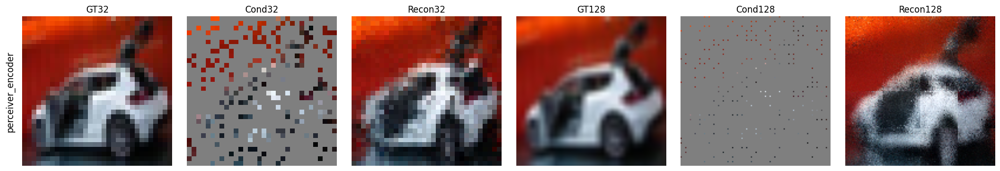

In [1]:
# === Sparse recon + super-res eval for PixNerDiT (grid vs perceiver encoders) ===
import os, sys
from pathlib import Path
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchvision.datasets import CIFAR10
from torchvision import transforms

# -----------------------
# 0) Make sure we're in the PixNerd repo root (so `import src...` works)
# -----------------------
if not (Path.cwd() / "src").exists():
    # common: notebook is in parent dir
    for cand in [Path.cwd() / "PixNerd", Path.cwd().parent / "PixNerd"]:
        if (cand / "src").exists():
            os.chdir(cand)
            sys.path.insert(0, str(cand))
            break

# Disable torch.compile/dynamo issues (matches your training script style)
torch._dynamo.config.disable = True

# -----------------------
# 1) Imports from your codebase
# -----------------------
from src.models.autoencoder.pixel import PixelAE
from src.models.conditioner.class_label import LabelConditioner
from src.models.transformer.pixnerd_c2i_heavydecoder import PixNerDiT
from src.diffusion.flow_matching.scheduling import LinearScheduler
from src.diffusion.flow_matching.sampling import EulerSampler, ode_step_fn
from src.diffusion.base.guidance import simple_guidance_fn
from src.diffusion.flow_matching.training import FlowMatchingTrainer
from src.callbacks.simple_ema import SimpleEMA
from src.lightning_model import LightningModel

# -----------------------
# 2) Configure what to compare
#    - Use separate ckpts if you actually trained separate models.
#    - If you try to load a "grid" ckpt into a "perceiver" model, strict=False will skip mismatched weights.
# -----------------------
EXPERIMENTS = [
    # dict(
    #     name="grid_encoder",
    #     ckpt_path="/pscratch/sd/k/kevinval/PNBase/PixNerd/workdirs/exp_cifar10_c2i_superres_grid/checkpoints/last.ckpt",
    #     encoder_type="grid",          # "grid" or "perceiver"
    #     # match training hyperparams:
    #     hidden_size=512,
    #     decoder_hidden_size=64,
    #     num_encoder_blocks=8,
    #     num_decoder_blocks=2,
    #     patch_size=8,
    #     num_groups=8,
    #     num_classes=10,
    #     # sparsity behavior:
    #     sparsity=0.4,
    #     cond_fraction=0.5,
    # ),
    dict(
        name="perceiver_encoder",
        ckpt_path="/pscratch/sd/k/kevinval/PNBase/PixNerd/workdirs/exp_cifar10_perceiver/checkpoints/last-v1.ckpt",
        encoder_type="perceiver",
        hidden_size=512,
        decoder_hidden_size=64,
        num_encoder_blocks=8,
        num_decoder_blocks=2,
        patch_size=8,
        num_groups=8,
        num_classes=10,
        sparsity=0.4,
        cond_fraction=0.5,
        # perceiver-specific knobs (only used if your PixNerDiT exposes them in __init__)
        # max_points=4096,
        # perceiver_num_latents=256,
        # perceiver_cross_heads=1,
    ),
]

# -----------------------
# 3) Helpers
# -----------------------
def build_lightning_model(cfg):
    main_scheduler = LinearScheduler()

    vae = PixelAE(scale=1.0)
    conditioner = LabelConditioner(num_classes=cfg["num_classes"])

    # Build denoiser
    denoiser_kwargs = dict(
        in_channels=3,
        patch_size=cfg["patch_size"],
        num_groups=cfg["num_groups"],
        hidden_size=cfg["hidden_size"],
        decoder_hidden_size=cfg["decoder_hidden_size"],
        num_encoder_blocks=cfg["num_encoder_blocks"],
        num_decoder_blocks=cfg["num_decoder_blocks"],
        num_classes=cfg["num_classes"],
    )
    # If your PixNerDiT has encoder_type in its signature, pass it:
    if "encoder_type" in cfg:
        denoiser_kwargs["encoder_type"] = cfg["encoder_type"]

    # Optional perceiver knobs if present in your model signature
    for k in ["max_points", "perceiver_num_latents", "perceiver_cross_heads"]:
        if k in cfg:
            denoiser_kwargs[k] = cfg[k]

    denoiser = PixNerDiT(**denoiser_kwargs)

    sampler = EulerSampler(
        num_steps=600,                 # you can change
        guidance=2,                 # you can change
        guidance_interval_min=0.0,
        guidance_interval_max=1.0,
        scheduler=main_scheduler,
        w_scheduler=LinearScheduler(),
        guidance_fn=simple_guidance_fn,
        step_fn=ode_step_fn,
    )

    trainer = FlowMatchingTrainer(
        scheduler=main_scheduler,
        lognorm_t=True,
        timeshift=1.0,
    )

    ema_tracker = SimpleEMA(decay=0.9999)

    model = LightningModel(
        vae=vae,
        conditioner=conditioner,
        denoiser=denoiser,
        diffusion_trainer=trainer,
        diffusion_sampler=sampler,
        ema_tracker=ema_tracker,
        optimizer=None,
        lr_scheduler=None,
        eval_original_model=False,
        sparsity=cfg["sparsity"],
        cond_fraction=cfg["cond_fraction"],
    )
    return model


def load_ckpt_into_model(model, ckpt_path, device):
    ckpt = torch.load(ckpt_path, map_location="cpu")
    sd = ckpt.get("state_dict", ckpt)
    missing, unexpected = model.load_state_dict(sd, strict=False)
    model = model.to(device)
    model.eval()
    # keep inference stable
    model.ema_denoiser.to(torch.float32)
    model.denoiser.to(torch.float32)
    return missing, unexpected

@torch.no_grad()
def run_sparse_recon(model, images, labels, superres_scale=1):
    """
    images: (B,3,32,32) in [-1,1]
    returns recon32, recon128 and metrics
    """
    device = images.device
    B = images.shape[0]

    # --- 32x32 recon ---
    x_latent_32 = model.vae.encode(images)  # (B,3,32,32) for PixelAE
    cond_mask_32, target_mask_32 = model._make_sparsity_masks(x_latent_32)

    condition, uncondition = model.conditioner(labels)

    noise_32 = torch.randn_like(x_latent_32)
    samples_latent_32 = model.diffusion_sampler(
        model.ema_denoiser,
        noise_32,
        condition,
        uncondition,
        cond_mask=cond_mask_32,
        x_cond=x_latent_32,
    )
    recon_32 = model.vae.decode(samples_latent_32)

    # MSE full + MSE on non-conditioning pixels
    mse32_full = F.mse_loss(recon_32, images).item()
    inv_mask32 = (1.0 - cond_mask_32).expand_as(images)
    mse32_noncond = ((recon_32 - images) ** 2 * inv_mask32).sum() / (inv_mask32.sum() + 1e-8)
    mse32_noncond = mse32_noncond.item()

    # conditioning viz (shows the true hints used)
    cond_vis_32 = cond_mask_32.expand_as(images) * images

    # ------------------------------------------------------------
    # --- 128x128 super-res: REUSE the 32x32 conditioning (one-pixel lift)
    # ------------------------------------------------------------
    scale = superres_scale
    H_hr = images.shape[-2] * scale
    W_hr = images.shape[-1] * scale

    # "GT128" for CIFAR is just an upsample for visualization/metric
    images_hr = F.interpolate(images, size=(H_hr, W_hr), mode="bilinear", align_corners=False)

    # Build a 128x128 cond_mask that has THE SAME NUMBER OF HINTS as 32x32:
    # one pixel in each (scale x scale) block.
    cond_mask_128 = torch.zeros(B, 1, H_hr, W_hr, device=device, dtype=cond_mask_32.dtype)
    cond_mask_128[:, :, ::scale, ::scale] = cond_mask_32  # (B,1,128,128)

    # Build x_cond_128 from the LOW-RES hints (not from upsampled GT128)
    x_cond_128 = torch.zeros(B, x_latent_32.shape[1], H_hr, W_hr, device=device, dtype=x_latent_32.dtype)
    x_cond_128[:, :, ::scale, ::scale] = x_latent_32  # same hint values, just lifted

    # Make sure there is no accidental info outside the mask (paranoia-safe)
    x_cond_128 = x_cond_128 * cond_mask_128.expand_as(x_cond_128)

    # Temporarily enable 4x decoding
    old = (getattr(model.denoiser, "decoder_patch_scaling_h", 1.0),
           getattr(model.denoiser, "decoder_patch_scaling_w", 1.0),
           getattr(model.ema_denoiser, "decoder_patch_scaling_h", 1.0),
           getattr(model.ema_denoiser, "decoder_patch_scaling_w", 1.0))
    if hasattr(model.denoiser, "decoder_patch_scaling_h"):
        model.denoiser.decoder_patch_scaling_h = scale
        model.denoiser.decoder_patch_scaling_w = scale
    if hasattr(model.ema_denoiser, "decoder_patch_scaling_h"):
        model.ema_denoiser.decoder_patch_scaling_h = scale
        model.ema_denoiser.decoder_patch_scaling_w = scale

    # Sample in 128 space, clamping only the lifted sparse hints
    noise_128 = torch.randn_like(x_cond_128)
    samples_latent_128 = model.diffusion_sampler(
        model.ema_denoiser,
        noise_128,
        condition,
        uncondition,
        cond_mask=cond_mask_128,
        x_cond=x_cond_128,
    )
    recon_128 = model.vae.decode(samples_latent_128)

    # restore scaling
    if hasattr(model.denoiser, "decoder_patch_scaling_h"):
        model.denoiser.decoder_patch_scaling_h, model.denoiser.decoder_patch_scaling_w = old[0], old[1]
    if hasattr(model.ema_denoiser, "decoder_patch_scaling_h"):
        model.ema_denoiser.decoder_patch_scaling_h, model.ema_denoiser.decoder_patch_scaling_w = old[2], old[3]

    # metrics vs upsampled GT (only a debugging proxy for CIFAR)
    mse128_full = F.mse_loss(recon_128, images_hr).item()
    inv_mask128 = (1.0 - cond_mask_128).expand_as(images_hr)
    mse128_noncond = ((recon_128 - images_hr) ** 2 * inv_mask128).sum() / (inv_mask128.sum() + 1e-8)
    mse128_noncond = mse128_noncond.item()

    # visualize what was actually clamped as conditioning
    cond_vis_128 = model.vae.decode(x_cond_128)

    metrics = dict(
        mse32_full=mse32_full,
        mse32_noncond=mse32_noncond,
        mse128_full=mse128_full,
        mse128_noncond=mse128_noncond,
    )
    return recon_32, cond_vis_32, recon_128, cond_vis_128, images_hr, metrics



def to_img01(x):
    # x: [-1,1] -> [0,1]
    return ((x.clamp(-1, 1) + 1) / 2).detach().cpu()

# -----------------------
# 4) Load a fixed CIFAR-10 batch
# -----------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(0)

tfm = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)),  # -> [-1,1]
])

ds = CIFAR10(root="./data", train=False, download=True, transform=tfm)
BATCH = 8
images = torch.stack([ds[i][0] for i in range(BATCH)], dim=0).to(device)
labels = torch.tensor([ds[i][1] for i in range(BATCH)], dtype=torch.long).to(device)

# -----------------------
# 5) Run each experiment and plot
# -----------------------
all_results = []

for cfg in EXPERIMENTS:
    print("\n" + "="*80)
    print(f"Experiment: {cfg['name']} | encoder_type={cfg.get('encoder_type','(default)')}")
    print(f"ckpt: {cfg['ckpt_path']}")

    model = build_lightning_model(cfg)
    missing, unexpected = load_ckpt_into_model(model, cfg["ckpt_path"], device=device)

    if len(missing) or len(unexpected):
        print(f"[load_state_dict strict=False] missing={len(missing)} unexpected={len(unexpected)}")
        # uncomment if you want details:
        # print("missing:", missing[:20])
        # print("unexpected:", unexpected[:20])

    recon32, cond32, recon128, cond128, gt128, metrics = run_sparse_recon(
        model, images, labels, superres_scale=4
    )

    print("Metrics:", metrics)

    all_results.append((cfg["name"], metrics, recon32, cond32, recon128, cond128, gt128))

# Plot: rows = experiments, cols = GT32 | Cond32 | Recon32 | GT128 | Cond128 | Recon128
cols = ["GT32", "Cond32", "Recon32", "GT128", "Cond128", "Recon128"]
rows = len(all_results)
plt.figure(figsize=(3.2*len(cols), 3.2*rows))

for r, (name, metrics, recon32, cond32, recon128, cond128, gt128) in enumerate(all_results):
    gt32 = images
    for c, (title, tensor) in enumerate([
        ("GT32", gt32),
        ("Cond32", cond32),
        ("Recon32", recon32),
        ("GT128", gt128),
        ("Cond128", cond128),
        ("Recon128", recon128),
    ]):
        ax = plt.subplot(rows, len(cols), r*len(cols) + c + 1)
        # show first image of the batch
        ax.imshow(to_img01(tensor[6]).permute(1,2,0))
        ax.axis("off")
        if r == 0:
            ax.set_title(title)
        if c == 0:
            ax.text(-0.05, 0.5, name, transform=ax.transAxes, rotation=90,
                    va="center", ha="right", fontsize=12)

plt.tight_layout()
plt.show()


In [3]:
# === Sparse recon + super-res eval for PixNerDiT (grid vs perceiver encoders) ===
import os, sys
from pathlib import Path
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchvision.datasets import CIFAR10
from torchvision import transforms

# -----------------------
# 0) Make sure we're in the PixNerd repo root (so `import src...` works)
# -----------------------
if not (Path.cwd() / "src").exists():
    # common: notebook is in parent dir
    for cand in [Path.cwd() / "PixNerd", Path.cwd().parent / "PixNerd"]:
        if (cand / "src").exists():
            os.chdir(cand)
            sys.path.insert(0, str(cand))
            break

# Disable torch.compile/dynamo issues (matches your training script style)
torch._dynamo.config.disable = True

# -----------------------
# 1) Imports from your codebase
# -----------------------
from src.models.autoencoder.pixel import PixelAE
from src.models.conditioner.class_label import LabelConditioner
from src.models.transformer.pixnerd_c2i_heavydecoder import PixNerDiT
from src.diffusion.flow_matching.scheduling import LinearScheduler
from src.diffusion.flow_matching.sampling import EulerSampler, ode_step_fn
from src.diffusion.base.guidance import simple_guidance_fn
from src.diffusion.flow_matching.training import FlowMatchingTrainer
from src.callbacks.simple_ema import SimpleEMA
from src.lightning_model import LightningModel

# -----------------------
# 2) Configure what to compare
#    - Use separate ckpts if you actually trained separate models.
#    - If you try to load a "grid" ckpt into a "perceiver" model, strict=False will skip mismatched weights.
# -----------------------
EXPERIMENTS = [
    # dict(
    #     name="grid_encoder",
    #     ckpt_path="/pscratch/sd/k/kevinval/PNBase/PixNerd/workdirs/exp_cifar10_c2i_superres_grid/checkpoints/last.ckpt",
    #     encoder_type="grid",          # "grid" or "perceiver"
    #     # match training hyperparams:
    #     hidden_size=512,
    #     decoder_hidden_size=64,
    #     num_encoder_blocks=8,
    #     num_decoder_blocks=2,
    #     patch_size=8,
    #     num_groups=8,
    #     num_classes=10,
    #     # sparsity behavior:
    #     sparsity=0.4,
    #     cond_fraction=0.5,
    # ),
    # dict(
    #     name="perceiver_encoder",
    #     ckpt_path="/pscratch/sd/k/kevinval/PNBase/PixNerd/workdirs/exp_cifar10_perceiverv2/checkpoints/last.ckpt",
    #     encoder_type="perceiver",
    #     hidden_size=512,
    #     decoder_hidden_size=64,
    #     num_encoder_blocks=8,
    #     num_decoder_blocks=2,
    #     patch_size=8,
    #     num_groups=8,
    #     num_classes=10,
    #     sparsity=0.4,
    #     cond_fraction=0.5,
    #     # perceiver-specific knobs (only used if your PixNerDiT exposes them in __init__)
    #     # max_points=4096,
    #     # perceiver_num_latents=256,
    #     # perceiver_cross_heads=1,
    # ),
]

# -----------------------
# 3) Helpers
# -----------------------
def build_lightning_model(cfg):
    main_scheduler = LinearScheduler()

    vae = PixelAE(scale=1.0)
    conditioner = LabelConditioner(num_classes=cfg["num_classes"])

    # Build denoiser
    denoiser_kwargs = dict(
        in_channels=3,
        patch_size=cfg["patch_size"],
        num_groups=cfg["num_groups"],
        hidden_size=cfg["hidden_size"],
        decoder_hidden_size=cfg["decoder_hidden_size"],
        num_encoder_blocks=cfg["num_encoder_blocks"],
        num_decoder_blocks=cfg["num_decoder_blocks"],
        num_classes=cfg["num_classes"],
    )
    # If your PixNerDiT has encoder_type in its signature, pass it:
    if "encoder_type" in cfg:
        denoiser_kwargs["encoder_type"] = cfg["encoder_type"]

    # Optional perceiver knobs if present in your model signature
    for k in ["max_points", "perceiver_num_latents", "perceiver_cross_heads"]:
        if k in cfg:
            denoiser_kwargs[k] = cfg[k]

    denoiser = PixNerDiT(**denoiser_kwargs)

    sampler = EulerSampler(
        num_steps=600,                 # you can change
        guidance=2,                 # you can change
        guidance_interval_min=0.0,
        guidance_interval_max=1.0,
        scheduler=main_scheduler,
        w_scheduler=LinearScheduler(),
        guidance_fn=simple_guidance_fn,
        step_fn=ode_step_fn,
    )

    trainer = FlowMatchingTrainer(
        scheduler=main_scheduler,
        lognorm_t=True,
        timeshift=1.0,
    )

    ema_tracker = SimpleEMA(decay=0.9999)

    model = LightningModel(
        vae=vae,
        conditioner=conditioner,
        denoiser=denoiser,
        diffusion_trainer=trainer,
        diffusion_sampler=sampler,
        ema_tracker=ema_tracker,
        optimizer=None,
        lr_scheduler=None,
        eval_original_model=False,
        sparsity=cfg["sparsity"],
        cond_fraction=cfg["cond_fraction"],
    )
    return model


def load_ckpt_into_model(model, ckpt_path, device):
    ckpt = torch.load(ckpt_path, map_location="cpu")
    sd = ckpt.get("state_dict", ckpt)
    missing, unexpected = model.load_state_dict(sd, strict=False)
    model = model.to(device)
    model.eval()
    # keep inference stable
    model.ema_denoiser.to(torch.float32)
    model.denoiser.to(torch.float32)
    return missing, unexpected

@torch.no_grad()
def run_sparse_recon(model, images, labels, superres_scale=1):
    """
    images: (B,3,32,32) in [-1,1]
    returns recon32, recon128 and metrics
    """
    device = images.device
    B = images.shape[0]

    # --- 32x32 recon ---
    x_latent_32 = model.vae.encode(images)  # (B,3,32,32) for PixelAE
    cond_mask_32, target_mask_32 = model._make_sparsity_masks(x_latent_32)

    condition, uncondition = model.conditioner(labels)

    noise_32 = torch.randn_like(x_latent_32)
    samples_latent_32 = model.diffusion_sampler(
        model.ema_denoiser,
        noise_32,
        condition,
        uncondition,
        cond_mask=cond_mask_32,
        x_cond=x_latent_32,
    )
    recon_32 = model.vae.decode(samples_latent_32)

    # MSE full + MSE on non-conditioning pixels
    mse32_full = F.mse_loss(recon_32, images).item()
    inv_mask32 = (1.0 - cond_mask_32).expand_as(images)
    mse32_noncond = ((recon_32 - images) ** 2 * inv_mask32).sum() / (inv_mask32.sum() + 1e-8)
    mse32_noncond = mse32_noncond.item()

    # conditioning viz (shows the true hints used)
    cond_vis_32 = cond_mask_32.expand_as(images) * images

    # ------------------------------------------------------------
    # --- 128x128 super-res: REUSE the 32x32 conditioning (one-pixel lift)
    # ------------------------------------------------------------
    scale = superres_scale
    H_hr = images.shape[-2] * scale
    W_hr = images.shape[-1] * scale

    # "GT128" for CIFAR is just an upsample for visualization/metric
    images_hr = F.interpolate(images, size=(H_hr, W_hr), mode="bilinear", align_corners=False)

    # Build a 128x128 cond_mask that has THE SAME NUMBER OF HINTS as 32x32:
    # one pixel in each (scale x scale) block.
    cond_mask_128 = torch.zeros(B, 1, H_hr, W_hr, device=device, dtype=cond_mask_32.dtype)
    cond_mask_128[:, :, ::scale, ::scale] = cond_mask_32  # (B,1,128,128)

    # Build x_cond_128 from the LOW-RES hints (not from upsampled GT128)
    x_cond_128 = torch.zeros(B, x_latent_32.shape[1], H_hr, W_hr, device=device, dtype=x_latent_32.dtype)
    x_cond_128[:, :, ::scale, ::scale] = x_latent_32  # same hint values, just lifted

    # Make sure there is no accidental info outside the mask (paranoia-safe)
    x_cond_128 = x_cond_128 * cond_mask_128.expand_as(x_cond_128)

    # Temporarily enable 4x decoding
    old = (getattr(model.denoiser, "decoder_patch_scaling_h", 1.0),
           getattr(model.denoiser, "decoder_patch_scaling_w", 1.0),
           getattr(model.ema_denoiser, "decoder_patch_scaling_h", 1.0),
           getattr(model.ema_denoiser, "decoder_patch_scaling_w", 1.0))
    if hasattr(model.denoiser, "decoder_patch_scaling_h"):
        model.denoiser.decoder_patch_scaling_h = scale
        model.denoiser.decoder_patch_scaling_w = scale
    if hasattr(model.ema_denoiser, "decoder_patch_scaling_h"):
        model.ema_denoiser.decoder_patch_scaling_h = scale
        model.ema_denoiser.decoder_patch_scaling_w = scale

    # Sample in 128 space, clamping only the lifted sparse hints
    noise_128 = torch.randn_like(x_cond_128)
    samples_latent_128 = model.diffusion_sampler(
        model.ema_denoiser,
        noise_128,
        condition,
        uncondition,
        cond_mask=cond_mask_128,
        x_cond=x_cond_128,
    )
    recon_128 = model.vae.decode(samples_latent_128)

    # restore scaling
    if hasattr(model.denoiser, "decoder_patch_scaling_h"):
        model.denoiser.decoder_patch_scaling_h, model.denoiser.decoder_patch_scaling_w = old[0], old[1]
    if hasattr(model.ema_denoiser, "decoder_patch_scaling_h"):
        model.ema_denoiser.decoder_patch_scaling_h, model.ema_denoiser.decoder_patch_scaling_w = old[2], old[3]

    # metrics vs upsampled GT (only a debugging proxy for CIFAR)
    mse128_full = F.mse_loss(recon_128, images_hr).item()
    inv_mask128 = (1.0 - cond_mask_128).expand_as(images_hr)
    mse128_noncond = ((recon_128 - images_hr) ** 2 * inv_mask128).sum() / (inv_mask128.sum() + 1e-8)
    mse128_noncond = mse128_noncond.item()

    # visualize what was actually clamped as conditioning
    cond_vis_128 = model.vae.decode(x_cond_128)

    metrics = dict(
        mse32_full=mse32_full,
        mse32_noncond=mse32_noncond,
        mse128_full=mse128_full,
        mse128_noncond=mse128_noncond,
    )
    return recon_32, cond_vis_32, recon_128, cond_vis_128, images_hr, metrics



def to_img01(x):
    # x: [-1,1] -> [0,1]
    return ((x.clamp(-1, 1) + 1) / 2).detach().cpu()

# -----------------------
# 4) Load a fixed CIFAR-10 batch
# -----------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(0)

tfm = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)),  # -> [-1,1]
])

ds = CIFAR10(root="./data", train=False, download=True, transform=tfm)
BATCH = 8
images = torch.stack([ds[i][0] for i in range(BATCH)], dim=0).to(device)
labels = torch.tensor([ds[i][1] for i in range(BATCH)], dtype=torch.long).to(device)

# -----------------------
# 5) Run each experiment and plot
# -----------------------
all_results = []

for cfg in EXPERIMENTS:
    print("\n" + "="*80)
    print(f"Experiment: {cfg['name']} | encoder_type={cfg.get('encoder_type','(default)')}")
    print(f"ckpt: {cfg['ckpt_path']}")

    model = build_lightning_model(cfg)
    missing, unexpected = load_ckpt_into_model(model, cfg["ckpt_path"], device=device)

    if len(missing) or len(unexpected):
        print(f"[load_state_dict strict=False] missing={len(missing)} unexpected={len(unexpected)}")
        # uncomment if you want details:
        # print("missing:", missing[:20])
        # print("unexpected:", unexpected[:20])

    recon32, cond32, recon128, cond128, gt128, metrics = run_sparse_recon(
        model, images, labels, superres_scale=4
    )

    print("Metrics:", metrics)

    all_results.append((cfg["name"], metrics, recon32, cond32, recon128, cond128, gt128))

# Plot: rows = experiments, cols = GT32 | Cond32 | Recon32 | GT128 | Cond128 | Recon128
cols = ["GT32", "Cond32", "Recon32", "GT128", "Cond128", "Recon128"]
rows = len(all_results)
plt.figure(figsize=(3.2*len(cols), 3.2*rows))

for r, (name, metrics, recon32, cond32, recon128, cond128, gt128) in enumerate(all_results):
    gt32 = images
    for c, (title, tensor) in enumerate([
        ("GT32", gt32),
        ("Cond32", cond32),
        ("Recon32", recon32),
        ("GT128", gt128),
        ("Cond128", cond128),
        ("Recon128", recon128),
    ]):
        ax = plt.subplot(rows, len(cols), r*len(cols) + c + 1)
        # show first image of the batch
        ax.imshow(to_img01(tensor[6]).permute(1,2,0))
        ax.axis("off")
        if r == 0:
            ax.set_title(title)
        if c == 0:
            ax.text(-0.05, 0.5, name, transform=ax.transAxes, rotation=90,
                    va="center", ha="right", fontsize=12)

plt.tight_layout()
plt.show()


Files already downloaded and verified


<Figure size 1920x0 with 0 Axes>

In [4]:
# === PixNerd: load ImageNet-256 checkpoint + run 1 batch through the LightningModel ===
import os, sys, inspect
from pathlib import Path

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import ImageFolder
from torchvision import transforms

# -----------------------
# 0) Make sure we're in the PixNerd repo root (so `import src...` works)
# -----------------------
if not (Path.cwd() / "src").exists():
    for cand in [Path.cwd() / "PixNerd", Path.cwd().parent / "PixNerd"]:
        if (cand / "src").exists():
            os.chdir(cand)
            sys.path.insert(0, str(cand))
            break

torch._dynamo.config.disable = True
device = "cuda" if torch.cuda.is_available() else "cpu"
print("device:", device)

# -----------------------
# 1) Settings
# -----------------------
CKPT_PATH   = "/pscratch/sd/k/kevinval/PNBase/PixNerd/workdirs/exp_imagenet_perceiver/checkpoints/last.ckpt"
IMG_SIZE    = 256
NUM_CLASSES = 1000

# Point this at your ImageNet split folder that looks like:
#   root/
#     class0/xxx.jpg
#     class1/yyy.jpg
#     ...
IMAGENET_ROOT = "/pscratch/sd/k/kevinval/datasets/imagenet256"  # e.g., export IMAGENET256_ROOT=/path/to/imagenet256/val
if not IMAGENET_ROOT or not os.path.isdir(IMAGENET_ROOT):
    raise RuntimeError(
        "Set IMAGENET256_ROOT to your ImageNet folder (class-subfolders). "
        "Example: export IMAGENET256_ROOT=/path/to/imagenet256/val"
    )

assert os.path.exists(CKPT_PATH), f"Checkpoint not found: {CKPT_PATH}"

# -----------------------
# 2) Your ImageNet dataloader (exactly as you provided)
# -----------------------
class PixImageNet(Dataset):
    """
    ImageNet-style dataset:
    - root/
        class_0/ xxx.jpg
        class_1/ yyy.jpg
        ...
    - Returns (image, label, metadata) with metadata["index"] for stable sparsity masks.
    """
    def __init__(self, root: str, img_size: int = 256, random_flip: bool = True):
        tfms = []
        tfms.append(transforms.Resize(img_size))
        tfms.append(transforms.CenterCrop(img_size))
        if random_flip:
            tfms.append(transforms.RandomHorizontalFlip())
        tfms.extend([
            transforms.ToTensor(),
            transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
        ])
        self.base = ImageFolder(root=root, transform=transforms.Compose(tfms))

    def __len__(self):
        return len(self.base)

    def __getitem__(self, index):
        img, label = self.base[index]
        metadata = {"index": index}
        return img, label, metadata

ds = PixImageNet(IMAGENET_ROOT, img_size=IMG_SIZE, random_flip=False)
loader = DataLoader(
    ds,
    batch_size=4,
    shuffle=False,
    num_workers=4,
    pin_memory=torch.cuda.is_available(),
    persistent_workers=True,
)
print(f"dataset size: {len(ds)}  classes(found): {len(ds.base.classes)}")

# -----------------------
# 3) Import LightningModel (try a few common locations in repo)
# -----------------------
def import_from_path(dotted: str):
    mod, name = dotted.rsplit(".", 1)
    m = __import__(mod, fromlist=[name])
    return getattr(m, name)

LIGHTNING_CANDIDATES = [
    "src.lightning_model.LightningModel",
    "src.models.lightning_model.LightningModel",
    "src.trainer.lightning_model.LightningModel",
    "src.training.lightning_model.LightningModel",
    "src.pl_modules.lightning_model.LightningModel",
    "src.lightning.LightningModel",
]

LightningModel = None
last_err = None
for cand in LIGHTNING_CANDIDATES:
    try:
        LightningModel = import_from_path(cand)
        print(f"Imported LightningModel from: {cand}")
        break
    except Exception as e:
        last_err = e

if LightningModel is None:
    raise RuntimeError(
        "Couldn't import LightningModel from common locations.\n"
        "Quick fix: tell me the exact import line you use for LightningModel in your training script, "
        "or run `grep -R \"class LightningModel\" -n src` and paste the match.\n"
        f"Last import error: {repr(last_err)}"
    )

# -----------------------
# 4) Load from checkpoint (try with overrides; fall back to plain)
# -----------------------
load_attempts = [
    dict(img_size=IMG_SIZE, num_classes=NUM_CLASSES),
    dict(image_size=IMG_SIZE, num_classes=NUM_CLASSES),
    dict(img_size=IMG_SIZE, n_classes=NUM_CLASSES),
    dict(image_size=IMG_SIZE, n_classes=NUM_CLASSES),
    dict(),  # if ckpt already has correct hparams
]

lm = None
last_err = None
for kw in load_attempts:
    try:
        lm = LightningModel.load_from_checkpoint(CKPT_PATH, strict=False, **kw)
        print(f"Loaded checkpoint with overrides: {kw}")
        break
    except TypeError as e:
        # bad kwarg names for __init__
        last_err = e
    except Exception as e:
        last_err = e

if lm is None:
    raise RuntimeError(f"Failed to load checkpoint via LightningModel.load_from_checkpoint: {repr(last_err)}")

lm = lm.to(device).eval()

# Print what it thinks image_size/num_classes are (if present)
if hasattr(lm, "hparams"):
    hp = lm.hparams
    for k in ["img_size", "image_size", "resolution", "num_classes", "n_classes"]:
        if k in hp:
            print(f"hparams[{k}] =", hp[k])

# -----------------------
# 5) Run ONE batch through (best-effort: validation_step -> forward signature -> model attr)
# -----------------------
batch = next(iter(loader))
x, y, meta = batch
x = x.to(device, non_blocking=True)
y = y.to(device, non_blocking=True)
# meta is a dict; default collate usually makes meta["index"] a tensor of shape [B]
if isinstance(meta, dict):
    for kk, vv in meta.items():
        if torch.is_tensor(vv):
            meta[kk] = vv.to(device, non_blocking=True)

with torch.no_grad():
    # (A) Try validation_step if it exists (most reliable for your (img, label, metadata) batch format)
    out = None
    if hasattr(lm, "validation_step"):
        try:
            out = lm.validation_step((x, y, meta), 0)
            print("Ran lm.validation_step(...) successfully.")
        except Exception as e:
            print("validation_step failed, falling back:", repr(e))

    # (B) Try calling forward with args matched by name
    if out is None:
        try:
            sig = inspect.signature(lm.forward)
            params = [p for p in sig.parameters.values() if p.name != "self"]
            args = []
            kwargs = {}

            if len(params) >= 1:
                args.append(x)

            # Fill common optional args by parameter name
            for p in params[1:]:
                name = p.name.lower()
                if name in {"y", "label", "labels", "target", "targets", "class_labels", "classes"}:
                    kwargs[p.name] = y
                elif name in {"meta", "metadata", "batch_metadata"}:
                    kwargs[p.name] = meta
                elif name in {"t", "time", "timesteps", "sigma"}:
                    # generic diffusion-ish timestep
                    kwargs[p.name] = torch.randint(0, 1000, (x.shape[0],), device=device)

            out = lm.forward(*args, **kwargs)
            print(f"Ran lm.forward(*args, **kwargs) with kwargs keys: {list(kwargs.keys())}")
        except Exception as e:
            print("forward-call failed, falling back:", repr(e))

    # (C) Try underlying .model if present
    if out is None and hasattr(lm, "model") and isinstance(lm.model, torch.nn.Module):
        out = lm.model(x)
        print("Ran lm.model(x) successfully.")

# Print output shape/type
if out is None:
    print("Nothing ran successfully — paste your LightningModel.forward signature and I’ll wire it exactly.")
else:
    if torch.is_tensor(out):
        print("output tensor shape:", tuple(out.shape))
    elif isinstance(out, (list, tuple)):
        print("output list/tuple:", [tuple(t.shape) if torch.is_tensor(t) else type(t) for t in out])
    else:
        print("output type:", type(out))

print("✅ done: ckpt loaded + one-batch run attempted")


RuntimeError: Set IMAGENET256_ROOT to your ImageNet folder (class-subfolders).
Example:
  export IMAGENET256_ROOT=/path/to/imagenet256/val

batch: torch.Size([2, 3, 256, 256]) torch.Size([2]) meta keys: ['index']

Experiment: perceiver_encoder_imagenet256 | encoder_type=perceiver
ckpt: /pscratch/sd/k/kevinval/PNBase/PixNerd/workdirs/exp_imagenet_perceiver/checkpoints/last.ckpt


current sampler is ODE sampler, but w_scheduler is enabled
/tmp/ipykernel_1648177/2760633898.py:167: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(ckpt_pat

Metrics: {'mse_lr_full': 0.2087307870388031, 'mse_lr_noncond': 0.2609124779701233, 'mse_hr_full': 0.22646957635879517, 'mse_hr_noncond': 0.23793832957744598}


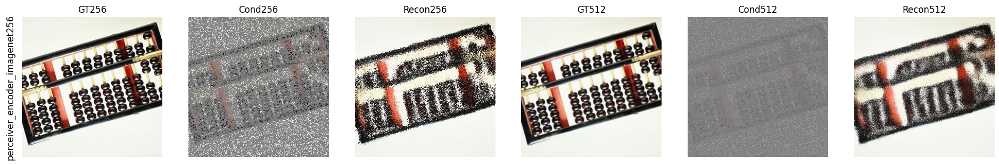

In [5]:
# === Sparse recon + super-res eval for PixNerDiT on ImageNet-256 (perceiver encoder) ===
import os, sys, inspect
from pathlib import Path
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import ImageFolder
from torchvision import transforms

# -----------------------
# 0) Make sure we're in the PixNerd repo root (so `import src...` works)
# -----------------------
if not (Path.cwd() / "src").exists():
    for cand in [Path.cwd() / "PixNerd", Path.cwd().parent / "PixNerd"]:
        if (cand / "src").exists():
            os.chdir(cand)
            sys.path.insert(0, str(cand))
            break

torch._dynamo.config.disable = True

# -----------------------
# 1) Imports from your codebase (same as CIFAR cell)
# -----------------------
from src.models.autoencoder.pixel import PixelAE
from src.models.conditioner.class_label import LabelConditioner
from src.models.transformer.pixnerd_c2i_heavydecoder import PixNerDiT
from src.diffusion.flow_matching.scheduling import LinearScheduler
from src.diffusion.flow_matching.sampling import EulerSampler, ode_step_fn
from src.diffusion.base.guidance import simple_guidance_fn
from src.diffusion.flow_matching.training import FlowMatchingTrainer
from src.callbacks.simple_ema import SimpleEMA
from src.lightning_model import LightningModel

# -----------------------
# 2) ImageNet dataset (your dataloader, unchanged)
# -----------------------
class PixImageNet(Dataset):
    """
    ImageNet-style dataset:
    - root/
        class_0/ xxx.jpg
        class_1/ yyy.jpg
        ...
    - Returns (image, label, metadata) with metadata["index"] for stable sparsity masks.
    """
    def __init__(self, root: str, img_size: int = 256, random_flip: bool = True):
        tfms = []
        tfms.append(transforms.Resize(img_size))
        tfms.append(transforms.CenterCrop(img_size))
        if random_flip:
            tfms.append(transforms.RandomHorizontalFlip())
        tfms.extend([
            transforms.ToTensor(),
            transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
        ])
        self.base = ImageFolder(root=root, transform=transforms.Compose(tfms))

    def __len__(self):
        return len(self.base)

    def __getitem__(self, index):
        img, label = self.base[index]
        metadata = {"index": index}
        return img, label, metadata

# -----------------------
# 3) Configure experiment (ImageNet-256 + 1000 classes)
# -----------------------
IMAGENET_ROOT = "/pscratch/sd/k/kevinval/datasets/imagenet256"  # <-- set this to your ImageNet folder
CKPT_PATH = "/pscratch/sd/k/kevinval/PNBase/PixNerd/workdirs/exp_imagenet_perceiver/checkpoints/last.ckpt"

IMG_SIZE = 256
NUM_CLASSES = 1000

# IMPORTANT: super-res scale=4 would mean 256->1024 which is huge; use 2 by default.
SUPERRES_SCALE = 2          # 1 = no super-res, 2 = 256->512, 4 = 256->1024 (very heavy)
BATCH = 2                   # ImageNet-256 diffusion sampling is heavy; bump if you want
SAMPLER_STEPS = 600         # keep same as your CIFAR cell
GUIDANCE = 2                # keep same as your CIFAR cell

EXPERIMENTS = [
    dict(
        name="perceiver_encoder_imagenet256",
        ckpt_path=CKPT_PATH,
        encoder_type="perceiver",
        hidden_size=512,
        decoder_hidden_size=64,
        num_encoder_blocks=8,
        num_decoder_blocks=2,
        patch_size=8,
        num_groups=8,
        num_classes=NUM_CLASSES,
        sparsity=0.4,
        cond_fraction=0.5,
        # perceiver knobs if you used them in training:
        # max_points=4096,
        # perceiver_num_latents=256,
        # perceiver_cross_heads=1,
    ),
]

# -----------------------
# 4) Helpers (same as CIFAR, but supports metadata if your _make_sparsity_masks needs it)
# -----------------------
def build_lightning_model(cfg):
    main_scheduler = LinearScheduler()

    vae = PixelAE(scale=1.0)
    conditioner = LabelConditioner(num_classes=cfg["num_classes"])

    denoiser_kwargs = dict(
        in_channels=3,
        patch_size=cfg["patch_size"],
        num_groups=cfg["num_groups"],
        hidden_size=cfg["hidden_size"],
        decoder_hidden_size=cfg["decoder_hidden_size"],
        num_encoder_blocks=cfg["num_encoder_blocks"],
        num_decoder_blocks=cfg["num_decoder_blocks"],
        num_classes=cfg["num_classes"],
    )
    if "encoder_type" in cfg:
        denoiser_kwargs["encoder_type"] = cfg["encoder_type"]
    for k in ["max_points", "perceiver_num_latents", "perceiver_cross_heads"]:
        if k in cfg:
            denoiser_kwargs[k] = cfg[k]

    denoiser = PixNerDiT(**denoiser_kwargs)

    sampler = EulerSampler(
        num_steps=SAMPLER_STEPS,
        guidance=GUIDANCE,
        guidance_interval_min=0.0,
        guidance_interval_max=1.0,
        scheduler=main_scheduler,
        w_scheduler=LinearScheduler(),
        guidance_fn=simple_guidance_fn,
        step_fn=ode_step_fn,
    )

    trainer = FlowMatchingTrainer(
        scheduler=main_scheduler,
        lognorm_t=True,
        timeshift=1.0,
    )

    ema_tracker = SimpleEMA(decay=0.9999)

    model = LightningModel(
        vae=vae,
        conditioner=conditioner,
        denoiser=denoiser,
        diffusion_trainer=trainer,
        diffusion_sampler=sampler,
        ema_tracker=ema_tracker,
        optimizer=None,
        lr_scheduler=None,
        eval_original_model=False,
        sparsity=cfg["sparsity"],
        cond_fraction=cfg["cond_fraction"],
    )
    return model


def load_ckpt_into_model(model, ckpt_path, device):
    ckpt = torch.load(ckpt_path, map_location="cpu")
    sd = ckpt.get("state_dict", ckpt)
    missing, unexpected = model.load_state_dict(sd, strict=False)
    model = model.to(device)
    model.eval()
    model.ema_denoiser.to(torch.float32)
    model.denoiser.to(torch.float32)
    return missing, unexpected


def _make_masks(model, x_latent, metadata):
    """
    Your CIFAR cell called model._make_sparsity_masks(x_latent).
    Some versions also accept metadata or indices; this wrapper tries both.
    """
    fn = model._make_sparsity_masks
    try:
        return fn(x_latent)
    except TypeError:
        pass

    # try metadata dict
    try:
        return fn(x_latent, metadata)
    except TypeError:
        pass

    # try metadata["index"]
    idx = metadata.get("index", None) if isinstance(metadata, dict) else None
    if idx is not None:
        return fn(x_latent, idx)

    # give up with a clearer error
    raise RuntimeError("model._make_sparsity_masks signature mismatch: couldn't call with x_latent / metadata / index.")


@torch.no_grad()
def run_sparse_recon(model, images, labels, metadata, superres_scale=1):
    """
    images: (B,3,H,W) in [-1,1], H=W=256 for ImageNet-256
    returns recon_lr, cond_vis_lr, recon_hr, cond_vis_hr, gt_hr, metrics
    """
    device = images.device
    B, C, H, W = images.shape

    # --- LR recon (H x W) ---
    x_latent = model.vae.encode(images)  # PixelAE keeps same shape
    cond_mask, target_mask = _make_masks(model, x_latent, metadata)

    condition, uncondition = model.conditioner(labels)

    noise = torch.randn_like(x_latent)
    samples_latent = model.diffusion_sampler(
        model.ema_denoiser,
        noise,
        condition,
        uncondition,
        cond_mask=cond_mask,
        x_cond=x_latent,
    )
    recon_lr = model.vae.decode(samples_latent)

    mse_lr_full = F.mse_loss(recon_lr, images).item()
    inv_mask = (1.0 - cond_mask).expand_as(images)
    mse_lr_noncond = ((recon_lr - images) ** 2 * inv_mask).sum() / (inv_mask.sum() + 1e-8)
    mse_lr_noncond = mse_lr_noncond.item()

    cond_vis_lr = cond_mask.expand_as(images) * images

    # --- HR super-res (optional) ---
    if superres_scale == 1:
        metrics = dict(mse_lr_full=mse_lr_full, mse_lr_noncond=mse_lr_noncond)
        return recon_lr, cond_vis_lr, None, None, None, metrics

    scale = int(superres_scale)
    H_hr, W_hr = H * scale, W * scale

    # NOTE: ImageNet-256 doesn't have true HR GT here; this is just a debug proxy
    images_hr = F.interpolate(images, size=(H_hr, W_hr), mode="bilinear", align_corners=False)

    cond_mask_hr = torch.zeros(B, 1, H_hr, W_hr, device=device, dtype=cond_mask.dtype)
    cond_mask_hr[:, :, ::scale, ::scale] = cond_mask  # lift hints

    x_cond_hr = torch.zeros(B, x_latent.shape[1], H_hr, W_hr, device=device, dtype=x_latent.dtype)
    x_cond_hr[:, :, ::scale, ::scale] = x_latent
    x_cond_hr = x_cond_hr * cond_mask_hr.expand_as(x_cond_hr)

    # set decoder scaling (same pattern as CIFAR cell)
    old = (getattr(model.denoiser, "decoder_patch_scaling_h", 1.0),
           getattr(model.denoiser, "decoder_patch_scaling_w", 1.0),
           getattr(model.ema_denoiser, "decoder_patch_scaling_h", 1.0),
           getattr(model.ema_denoiser, "decoder_patch_scaling_w", 1.0))
    if hasattr(model.denoiser, "decoder_patch_scaling_h"):
        model.denoiser.decoder_patch_scaling_h = scale
        model.denoiser.decoder_patch_scaling_w = scale
    if hasattr(model.ema_denoiser, "decoder_patch_scaling_h"):
        model.ema_denoiser.decoder_patch_scaling_h = scale
        model.ema_denoiser.decoder_patch_scaling_w = scale

    noise_hr = torch.randn_like(x_cond_hr)
    samples_latent_hr = model.diffusion_sampler(
        model.ema_denoiser,
        noise_hr,
        condition,
        uncondition,
        cond_mask=cond_mask_hr,
        x_cond=x_cond_hr,
    )
    recon_hr = model.vae.decode(samples_latent_hr)

    # restore scaling
    if hasattr(model.denoiser, "decoder_patch_scaling_h"):
        model.denoiser.decoder_patch_scaling_h, model.denoiser.decoder_patch_scaling_w = old[0], old[1]
    if hasattr(model.ema_denoiser, "decoder_patch_scaling_h"):
        model.ema_denoiser.decoder_patch_scaling_h, model.ema_denoiser.decoder_patch_scaling_w = old[2], old[3]

    mse_hr_full = F.mse_loss(recon_hr, images_hr).item()
    inv_mask_hr = (1.0 - cond_mask_hr).expand_as(images_hr)
    mse_hr_noncond = ((recon_hr - images_hr) ** 2 * inv_mask_hr).sum() / (inv_mask_hr.sum() + 1e-8)
    mse_hr_noncond = mse_hr_noncond.item()

    cond_vis_hr = model.vae.decode(x_cond_hr)

    metrics = dict(
        mse_lr_full=mse_lr_full,
        mse_lr_noncond=mse_lr_noncond,
        mse_hr_full=mse_hr_full,
        mse_hr_noncond=mse_hr_noncond,
    )
    return recon_lr, cond_vis_lr, recon_hr, cond_vis_hr, images_hr, metrics


def to_img01(x):
    return ((x.clamp(-1, 1) + 1) / 2).detach().cpu()

# -----------------------
# 5) Load a fixed ImageNet batch
# -----------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(0)

if not IMAGENET_ROOT or not os.path.isdir(IMAGENET_ROOT):
    raise RuntimeError(
        "Set IMAGENET256_ROOT to your ImageNet folder (class-subfolders).\n"
        "Example:\n"
        "  export IMAGENET256_ROOT=/path/to/imagenet256/val"
    )

ds = PixImageNet(IMAGENET_ROOT, img_size=IMG_SIZE, random_flip=False)
loader = DataLoader(ds, batch_size=BATCH, shuffle=False, num_workers=4, pin_memory=True)

images, labels, metadata = next(iter(loader))
images = images.to(device)
labels = labels.to(device)
# metadata is a dict of tensors after default collate
if isinstance(metadata, dict):
    for k, v in metadata.items():
        if torch.is_tensor(v):
            metadata[k] = v.to(device)

print("batch:", images.shape, labels.shape, "meta keys:", list(metadata.keys()) if isinstance(metadata, dict) else type(metadata))

# -----------------------
# 6) Run each experiment and plot
# -----------------------
all_results = []

for cfg in EXPERIMENTS:
    print("\n" + "="*80)
    print(f"Experiment: {cfg['name']} | encoder_type={cfg.get('encoder_type','(default)')}")
    print(f"ckpt: {cfg['ckpt_path']}")

    model = build_lightning_model(cfg)
    missing, unexpected = load_ckpt_into_model(model, cfg["ckpt_path"], device=device)

    if len(missing) or len(unexpected):
        print(f"[load_state_dict strict=False] missing={len(missing)} unexpected={len(unexpected)}")
        # print("missing sample:", missing[:20])
        # print("unexpected sample:", unexpected[:20])

    recon_lr, cond_lr, recon_hr, cond_hr, gt_hr, metrics = run_sparse_recon(
        model, images, labels, metadata, superres_scale=SUPERRES_SCALE
    )

    print("Metrics:", metrics)
    all_results.append((cfg["name"], metrics, recon_lr, cond_lr, recon_hr, cond_hr, gt_hr))

# Plot: rows = experiments, cols = GT | Cond | Recon (+ HR triplet if enabled)
cols = ["GT256", "Cond256", "Recon256"]
if SUPERRES_SCALE != 1:
    cols += [f"GT{IMG_SIZE*SUPERRES_SCALE}", f"Cond{IMG_SIZE*SUPERRES_SCALE}", f"Recon{IMG_SIZE*SUPERRES_SCALE}"]

rows = len(all_results)
plt.figure(figsize=(3.2*len(cols), 3.2*rows))

show_i = 0  # which image in the batch to visualize

for r, (name, metrics, recon_lr, cond_lr, recon_hr, cond_hr, gt_hr) in enumerate(all_results):
    triplets = [
        ("GT256", images),
        ("Cond256", cond_lr),
        ("Recon256", recon_lr),
    ]
    if SUPERRES_SCALE != 1:
        triplets += [
            (f"GT{IMG_SIZE*SUPERRES_SCALE}", gt_hr),
            (f"Cond{IMG_SIZE*SUPERRES_SCALE}", cond_hr),
            (f"Recon{IMG_SIZE*SUPERRES_SCALE}", recon_hr),
        ]

    for c, (title, tensor) in enumerate(triplets):
        ax = plt.subplot(rows, len(cols), r*len(cols) + c + 1)
        ax.imshow(to_img01(tensor[show_i]).permute(1,2,0))
        ax.axis("off")
        if r == 0:
            ax.set_title(title)
        if c == 0:
            ax.text(-0.05, 0.5, name, transform=ax.transAxes, rotation=90,
                    va="center", ha="right", fontsize=12)

plt.tight_layout()
plt.show()


/pscratch/sd/k/kevinval/envs/pixnerd/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


batch: torch.Size([2, 3, 256, 256]) torch.Size([2]) meta keys: ['index']

Experiment: perceiver_encoder_imagenet256 | encoder_type=perceiver
ckpt: /pscratch/sd/k/kevinval/PNBase/PixNerd/workdirs/exp_imagenet_perceiver/checkpoints/last.ckpt


current sampler is ODE sampler, but w_scheduler is enabled
/tmp/ipykernel_435056/2760633898.py:167: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(ckpt_path

Metrics: {'mse_lr_full': 0.19905152916908264, 'mse_lr_noncond': 0.2488134503364563, 'mse_hr_full': 0.2160896509885788, 'mse_hr_noncond': 0.22701209783554077}


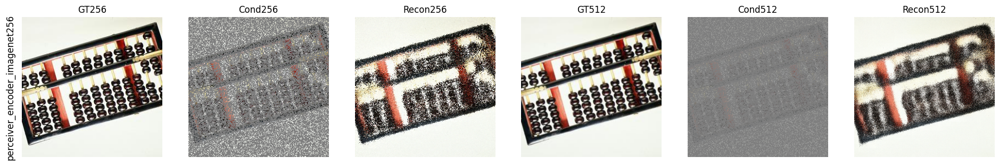

In [1]:
# === Sparse recon + super-res eval for PixNerDiT on ImageNet-256 (perceiver encoder) ===
import os, sys, inspect
from pathlib import Path
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import ImageFolder
from torchvision import transforms

# -----------------------
# 0) Make sure we're in the PixNerd repo root (so `import src...` works)
# -----------------------
if not (Path.cwd() / "src").exists():
    for cand in [Path.cwd() / "PixNerd", Path.cwd().parent / "PixNerd"]:
        if (cand / "src").exists():
            os.chdir(cand)
            sys.path.insert(0, str(cand))
            break

torch._dynamo.config.disable = True

# -----------------------
# 1) Imports from your codebase (same as CIFAR cell)
# -----------------------
from src.models.autoencoder.pixel import PixelAE
from src.models.conditioner.class_label import LabelConditioner
from src.models.transformer.pixnerd_c2i_heavydecoder import PixNerDiT
from src.diffusion.flow_matching.scheduling import LinearScheduler
from src.diffusion.flow_matching.sampling import EulerSampler, ode_step_fn
from src.diffusion.base.guidance import simple_guidance_fn
from src.diffusion.flow_matching.training import FlowMatchingTrainer
from src.callbacks.simple_ema import SimpleEMA
from src.lightning_model import LightningModel

# -----------------------
# 2) ImageNet dataset (your dataloader, unchanged)
# -----------------------
class PixImageNet(Dataset):
    """
    ImageNet-style dataset:
    - root/
        class_0/ xxx.jpg
        class_1/ yyy.jpg
        ...
    - Returns (image, label, metadata) with metadata["index"] for stable sparsity masks.
    """
    def __init__(self, root: str, img_size: int = 256, random_flip: bool = True):
        tfms = []
        tfms.append(transforms.Resize(img_size))
        tfms.append(transforms.CenterCrop(img_size))
        if random_flip:
            tfms.append(transforms.RandomHorizontalFlip())
        tfms.extend([
            transforms.ToTensor(),
            transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
        ])
        self.base = ImageFolder(root=root, transform=transforms.Compose(tfms))

    def __len__(self):
        return len(self.base)

    def __getitem__(self, index):
        img, label = self.base[index]
        metadata = {"index": index}
        return img, label, metadata

# -----------------------
# 3) Configure experiment (ImageNet-256 + 1000 classes)
# -----------------------
IMAGENET_ROOT = "/pscratch/sd/k/kevinval/datasets/imagenet256"  # <-- set this to your ImageNet folder
CKPT_PATH = "/pscratch/sd/k/kevinval/PNBase/PixNerd/workdirs/exp_imagenet_perceiver/checkpoints/last.ckpt"

IMG_SIZE = 256
NUM_CLASSES = 1000

# IMPORTANT: super-res scale=4 would mean 256->1024 which is huge; use 2 by default.
SUPERRES_SCALE = 2          # 1 = no super-res, 2 = 256->512, 4 = 256->1024 (very heavy)
BATCH = 2                   # ImageNet-256 diffusion sampling is heavy; bump if you want
SAMPLER_STEPS = 600         # keep same as your CIFAR cell
GUIDANCE = 2                # keep same as your CIFAR cell

EXPERIMENTS = [
    dict(
        name="perceiver_encoder_imagenet256",
        ckpt_path=CKPT_PATH,
        encoder_type="perceiver",
        hidden_size=512,
        decoder_hidden_size=64,
        num_encoder_blocks=8,
        num_decoder_blocks=2,
        patch_size=8,
        num_groups=8,
        num_classes=NUM_CLASSES,
        sparsity=0.4,
        cond_fraction=0.5,
        # perceiver knobs if you used them in training:
        # max_points=4096,
        # perceiver_num_latents=256,
        # perceiver_cross_heads=1,
    ),
]

# -----------------------
# 4) Helpers (same as CIFAR, but supports metadata if your _make_sparsity_masks needs it)
# -----------------------
def build_lightning_model(cfg):
    main_scheduler = LinearScheduler()

    vae = PixelAE(scale=1.0)
    conditioner = LabelConditioner(num_classes=cfg["num_classes"])

    denoiser_kwargs = dict(
        in_channels=3,
        patch_size=cfg["patch_size"],
        num_groups=cfg["num_groups"],
        hidden_size=cfg["hidden_size"],
        decoder_hidden_size=cfg["decoder_hidden_size"],
        num_encoder_blocks=cfg["num_encoder_blocks"],
        num_decoder_blocks=cfg["num_decoder_blocks"],
        num_classes=cfg["num_classes"],
    )
    if "encoder_type" in cfg:
        denoiser_kwargs["encoder_type"] = cfg["encoder_type"]
    for k in ["max_points", "perceiver_num_latents", "perceiver_cross_heads"]:
        if k in cfg:
            denoiser_kwargs[k] = cfg[k]

    denoiser = PixNerDiT(**denoiser_kwargs)

    sampler = EulerSampler(
        num_steps=SAMPLER_STEPS,
        guidance=GUIDANCE,
        guidance_interval_min=0.0,
        guidance_interval_max=1.0,
        scheduler=main_scheduler,
        w_scheduler=LinearScheduler(),
        guidance_fn=simple_guidance_fn,
        step_fn=ode_step_fn,
    )

    trainer = FlowMatchingTrainer(
        scheduler=main_scheduler,
        lognorm_t=True,
        timeshift=1.0,
    )

    ema_tracker = SimpleEMA(decay=0.9999)

    model = LightningModel(
        vae=vae,
        conditioner=conditioner,
        denoiser=denoiser,
        diffusion_trainer=trainer,
        diffusion_sampler=sampler,
        ema_tracker=ema_tracker,
        optimizer=None,
        lr_scheduler=None,
        eval_original_model=False,
        sparsity=cfg["sparsity"],
        cond_fraction=cfg["cond_fraction"],
    )
    return model


def load_ckpt_into_model(model, ckpt_path, device):
    ckpt = torch.load(ckpt_path, map_location="cpu")
    sd = ckpt.get("state_dict", ckpt)
    missing, unexpected = model.load_state_dict(sd, strict=False)
    model = model.to(device)
    model.eval()
    model.ema_denoiser.to(torch.float32)
    model.denoiser.to(torch.float32)
    return missing, unexpected


def _make_masks(model, x_latent, metadata):
    """
    Your CIFAR cell called model._make_sparsity_masks(x_latent).
    Some versions also accept metadata or indices; this wrapper tries both.
    """
    fn = model._make_sparsity_masks
    try:
        return fn(x_latent)
    except TypeError:
        pass

    # try metadata dict
    try:
        return fn(x_latent, metadata)
    except TypeError:
        pass

    # try metadata["index"]
    idx = metadata.get("index", None) if isinstance(metadata, dict) else None
    if idx is not None:
        return fn(x_latent, idx)

    # give up with a clearer error
    raise RuntimeError("model._make_sparsity_masks signature mismatch: couldn't call with x_latent / metadata / index.")


@torch.no_grad()
def run_sparse_recon(model, images, labels, metadata, superres_scale=1):
    """
    images: (B,3,H,W) in [-1,1], H=W=256 for ImageNet-256
    returns recon_lr, cond_vis_lr, recon_hr, cond_vis_hr, gt_hr, metrics
    """
    device = images.device
    B, C, H, W = images.shape

    # --- LR recon (H x W) ---
    x_latent = model.vae.encode(images)  # PixelAE keeps same shape
    cond_mask, target_mask = _make_masks(model, x_latent, metadata)

    condition, uncondition = model.conditioner(labels)

    noise = torch.randn_like(x_latent)
    samples_latent = model.diffusion_sampler(
        model.ema_denoiser,
        noise,
        condition,
        uncondition,
        cond_mask=cond_mask,
        x_cond=x_latent,
    )
    recon_lr = model.vae.decode(samples_latent)

    mse_lr_full = F.mse_loss(recon_lr, images).item()
    inv_mask = (1.0 - cond_mask).expand_as(images)
    mse_lr_noncond = ((recon_lr - images) ** 2 * inv_mask).sum() / (inv_mask.sum() + 1e-8)
    mse_lr_noncond = mse_lr_noncond.item()

    cond_vis_lr = cond_mask.expand_as(images) * images

    # --- HR super-res (optional) ---
    if superres_scale == 1:
        metrics = dict(mse_lr_full=mse_lr_full, mse_lr_noncond=mse_lr_noncond)
        return recon_lr, cond_vis_lr, None, None, None, metrics

    scale = int(superres_scale)
    H_hr, W_hr = H * scale, W * scale

    # NOTE: ImageNet-256 doesn't have true HR GT here; this is just a debug proxy
    images_hr = F.interpolate(images, size=(H_hr, W_hr), mode="bilinear", align_corners=False)

    cond_mask_hr = torch.zeros(B, 1, H_hr, W_hr, device=device, dtype=cond_mask.dtype)
    cond_mask_hr[:, :, ::scale, ::scale] = cond_mask  # lift hints

    x_cond_hr = torch.zeros(B, x_latent.shape[1], H_hr, W_hr, device=device, dtype=x_latent.dtype)
    x_cond_hr[:, :, ::scale, ::scale] = x_latent
    x_cond_hr = x_cond_hr * cond_mask_hr.expand_as(x_cond_hr)

    # set decoder scaling (same pattern as CIFAR cell)
    old = (getattr(model.denoiser, "decoder_patch_scaling_h", 1.0),
           getattr(model.denoiser, "decoder_patch_scaling_w", 1.0),
           getattr(model.ema_denoiser, "decoder_patch_scaling_h", 1.0),
           getattr(model.ema_denoiser, "decoder_patch_scaling_w", 1.0))
    if hasattr(model.denoiser, "decoder_patch_scaling_h"):
        model.denoiser.decoder_patch_scaling_h = scale
        model.denoiser.decoder_patch_scaling_w = scale
    if hasattr(model.ema_denoiser, "decoder_patch_scaling_h"):
        model.ema_denoiser.decoder_patch_scaling_h = scale
        model.ema_denoiser.decoder_patch_scaling_w = scale

    noise_hr = torch.randn_like(x_cond_hr)
    samples_latent_hr = model.diffusion_sampler(
        model.ema_denoiser,
        noise_hr,
        condition,
        uncondition,
        cond_mask=cond_mask_hr,
        x_cond=x_cond_hr,
    )
    recon_hr = model.vae.decode(samples_latent_hr)

    # restore scaling
    if hasattr(model.denoiser, "decoder_patch_scaling_h"):
        model.denoiser.decoder_patch_scaling_h, model.denoiser.decoder_patch_scaling_w = old[0], old[1]
    if hasattr(model.ema_denoiser, "decoder_patch_scaling_h"):
        model.ema_denoiser.decoder_patch_scaling_h, model.ema_denoiser.decoder_patch_scaling_w = old[2], old[3]

    mse_hr_full = F.mse_loss(recon_hr, images_hr).item()
    inv_mask_hr = (1.0 - cond_mask_hr).expand_as(images_hr)
    mse_hr_noncond = ((recon_hr - images_hr) ** 2 * inv_mask_hr).sum() / (inv_mask_hr.sum() + 1e-8)
    mse_hr_noncond = mse_hr_noncond.item()

    cond_vis_hr = model.vae.decode(x_cond_hr)

    metrics = dict(
        mse_lr_full=mse_lr_full,
        mse_lr_noncond=mse_lr_noncond,
        mse_hr_full=mse_hr_full,
        mse_hr_noncond=mse_hr_noncond,
    )
    return recon_lr, cond_vis_lr, recon_hr, cond_vis_hr, images_hr, metrics


def to_img01(x):
    return ((x.clamp(-1, 1) + 1) / 2).detach().cpu()

# -----------------------
# 5) Load a fixed ImageNet batch
# -----------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(0)

if not IMAGENET_ROOT or not os.path.isdir(IMAGENET_ROOT):
    raise RuntimeError(
        "Set IMAGENET256_ROOT to your ImageNet folder (class-subfolders).\n"
        "Example:\n"
        "  export IMAGENET256_ROOT=/path/to/imagenet256/val"
    )

ds = PixImageNet(IMAGENET_ROOT, img_size=IMG_SIZE, random_flip=False)
loader = DataLoader(ds, batch_size=BATCH, shuffle=False, num_workers=4, pin_memory=True)

images, labels, metadata = next(iter(loader))
images = images.to(device)
labels = labels.to(device)
# metadata is a dict of tensors after default collate
if isinstance(metadata, dict):
    for k, v in metadata.items():
        if torch.is_tensor(v):
            metadata[k] = v.to(device)

print("batch:", images.shape, labels.shape, "meta keys:", list(metadata.keys()) if isinstance(metadata, dict) else type(metadata))

# -----------------------
# 6) Run each experiment and plot
# -----------------------
all_results = []

for cfg in EXPERIMENTS:
    print("\n" + "="*80)
    print(f"Experiment: {cfg['name']} | encoder_type={cfg.get('encoder_type','(default)')}")
    print(f"ckpt: {cfg['ckpt_path']}")

    model = build_lightning_model(cfg)
    missing, unexpected = load_ckpt_into_model(model, cfg["ckpt_path"], device=device)

    if len(missing) or len(unexpected):
        print(f"[load_state_dict strict=False] missing={len(missing)} unexpected={len(unexpected)}")
        # print("missing sample:", missing[:20])
        # print("unexpected sample:", unexpected[:20])

    recon_lr, cond_lr, recon_hr, cond_hr, gt_hr, metrics = run_sparse_recon(
        model, images, labels, metadata, superres_scale=SUPERRES_SCALE
    )

    print("Metrics:", metrics)
    all_results.append((cfg["name"], metrics, recon_lr, cond_lr, recon_hr, cond_hr, gt_hr))

# Plot: rows = experiments, cols = GT | Cond | Recon (+ HR triplet if enabled)
cols = ["GT256", "Cond256", "Recon256"]
if SUPERRES_SCALE != 1:
    cols += [f"GT{IMG_SIZE*SUPERRES_SCALE}", f"Cond{IMG_SIZE*SUPERRES_SCALE}", f"Recon{IMG_SIZE*SUPERRES_SCALE}"]

rows = len(all_results)
plt.figure(figsize=(3.2*len(cols), 3.2*rows))

show_i = 0  # which image in the batch to visualize

for r, (name, metrics, recon_lr, cond_lr, recon_hr, cond_hr, gt_hr) in enumerate(all_results):
    triplets = [
        ("GT256", images),
        ("Cond256", cond_lr),
        ("Recon256", recon_lr),
    ]
    if SUPERRES_SCALE != 1:
        triplets += [
            (f"GT{IMG_SIZE*SUPERRES_SCALE}", gt_hr),
            (f"Cond{IMG_SIZE*SUPERRES_SCALE}", cond_hr),
            (f"Recon{IMG_SIZE*SUPERRES_SCALE}", recon_hr),
        ]

    for c, (title, tensor) in enumerate(triplets):
        ax = plt.subplot(rows, len(cols), r*len(cols) + c + 1)
        ax.imshow(to_img01(tensor[show_i]).permute(1,2,0))
        ax.axis("off")
        if r == 0:
            ax.set_title(title)
        if c == 0:
            ax.text(-0.05, 0.5, name, transform=ax.transAxes, rotation=90,
                    va="center", ha="right", fontsize=12)

plt.tight_layout()
plt.show()


/pscratch/sd/k/kevinval/envs/pixnerd/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


batch: torch.Size([2, 3, 256, 256]) torch.Size([2]) meta keys: ['index']

Experiment: grid_encoder_imagenet256 | encoder_type=grid
ckpt: /pscratch/sd/k/kevinval/PNBase/PixNerd/workdirs/exp_imagenet_grid/checkpoints/last.ckpt


current sampler is ODE sampler, but w_scheduler is enabled
/tmp/ipykernel_1721044/1350825896.py:167: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(ckpt_pat

Metrics: {'mse_lr_full': 0.0615663155913353, 'mse_lr_noncond': 0.0769575983285904, 'mse_hr_full': 0.379028856754303, 'mse_hr_noncond': 0.3985268771648407}


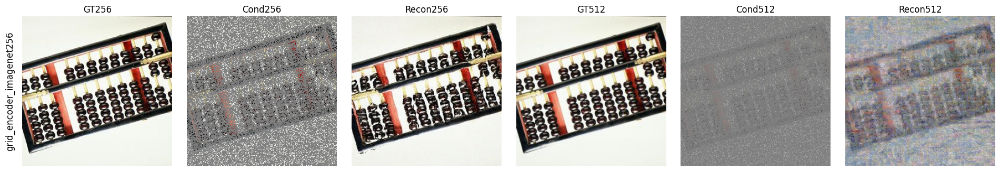

In [1]:
# === Sparse recon + super-res eval for PixNerDiT on ImageNet-256 (perceiver encoder) ===
import os, sys, inspect
from pathlib import Path
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import ImageFolder
from torchvision import transforms

# -----------------------
# 0) Make sure we're in the PixNerd repo root (so `import src...` works)
# -----------------------
if not (Path.cwd() / "src").exists():
    for cand in [Path.cwd() / "PixNerd", Path.cwd().parent / "PixNerd"]:
        if (cand / "src").exists():
            os.chdir(cand)
            sys.path.insert(0, str(cand))
            break

torch._dynamo.config.disable = True

# -----------------------
# 1) Imports from your codebase (same as CIFAR cell)
# -----------------------
from src.models.autoencoder.pixel import PixelAE
from src.models.conditioner.class_label import LabelConditioner
from src.models.transformer.pixnerd_c2i_heavydecoder import PixNerDiT
from src.diffusion.flow_matching.scheduling import LinearScheduler
from src.diffusion.flow_matching.sampling import EulerSampler, ode_step_fn
from src.diffusion.base.guidance import simple_guidance_fn
from src.diffusion.flow_matching.training import FlowMatchingTrainer
from src.callbacks.simple_ema import SimpleEMA
from src.lightning_model import LightningModel

# -----------------------
# 2) ImageNet dataset (your dataloader, unchanged)
# -----------------------
class PixImageNet(Dataset):
    """
    ImageNet-style dataset:
    - root/
        class_0/ xxx.jpg
        class_1/ yyy.jpg
        ...
    - Returns (image, label, metadata) with metadata["index"] for stable sparsity masks.
    """
    def __init__(self, root: str, img_size: int = 256, random_flip: bool = True):
        tfms = []
        tfms.append(transforms.Resize(img_size))
        tfms.append(transforms.CenterCrop(img_size))
        if random_flip:
            tfms.append(transforms.RandomHorizontalFlip())
        tfms.extend([
            transforms.ToTensor(),
            transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
        ])
        self.base = ImageFolder(root=root, transform=transforms.Compose(tfms))

    def __len__(self):
        return len(self.base)

    def __getitem__(self, index):
        img, label = self.base[index]
        metadata = {"index": index}
        return img, label, metadata

# -----------------------
# 3) Configure experiment (ImageNet-256 + 1000 classes)
# -----------------------
IMAGENET_ROOT = "/pscratch/sd/k/kevinval/datasets/imagenet256"  # <-- set this to your ImageNet folder
CKPT_PATH = "/pscratch/sd/k/kevinval/PNBase/PixNerd/workdirs/exp_imagenet_grid/checkpoints/last.ckpt"

IMG_SIZE = 256
NUM_CLASSES = 1000

# IMPORTANT: super-res scale=4 would mean 256->1024 which is huge; use 2 by default.
SUPERRES_SCALE = 2          # 1 = no super-res, 2 = 256->512, 4 = 256->1024 (very heavy)
BATCH = 2                   # ImageNet-256 diffusion sampling is heavy; bump if you want
SAMPLER_STEPS = 600         # keep same as your CIFAR cell
GUIDANCE = 2                # keep same as your CIFAR cell

EXPERIMENTS = [
    dict(
        name="grid_encoder_imagenet256",
        ckpt_path=CKPT_PATH,
        encoder_type="grid",
        hidden_size=512,
        decoder_hidden_size=64,
        num_encoder_blocks=8,
        num_decoder_blocks=2,
        patch_size=8,
        num_groups=8,
        num_classes=NUM_CLASSES,
        sparsity=0.4,
        cond_fraction=0.5,
        # perceiver knobs if you used them in training:
        # max_points=4096,
        # perceiver_num_latents=256,
        # perceiver_cross_heads=1,
    ),
]

# -----------------------
# 4) Helpers (same as CIFAR, but supports metadata if your _make_sparsity_masks needs it)
# -----------------------
def build_lightning_model(cfg):
    main_scheduler = LinearScheduler()

    vae = PixelAE(scale=1.0)
    conditioner = LabelConditioner(num_classes=cfg["num_classes"])

    denoiser_kwargs = dict(
        in_channels=3,
        patch_size=cfg["patch_size"],
        num_groups=cfg["num_groups"],
        hidden_size=cfg["hidden_size"],
        decoder_hidden_size=cfg["decoder_hidden_size"],
        num_encoder_blocks=cfg["num_encoder_blocks"],
        num_decoder_blocks=cfg["num_decoder_blocks"],
        num_classes=cfg["num_classes"],
    )
    if "encoder_type" in cfg:
        denoiser_kwargs["encoder_type"] = cfg["encoder_type"]
    for k in ["max_points", "perceiver_num_latents", "perceiver_cross_heads"]:
        if k in cfg:
            denoiser_kwargs[k] = cfg[k]

    denoiser = PixNerDiT(**denoiser_kwargs)

    sampler = EulerSampler(
        num_steps=SAMPLER_STEPS,
        guidance=GUIDANCE,
        guidance_interval_min=0.0,
        guidance_interval_max=1.0,
        scheduler=main_scheduler,
        w_scheduler=LinearScheduler(),
        guidance_fn=simple_guidance_fn,
        step_fn=ode_step_fn,
    )

    trainer = FlowMatchingTrainer(
        scheduler=main_scheduler,
        lognorm_t=True,
        timeshift=1.0,
    )

    ema_tracker = SimpleEMA(decay=0.9999)

    model = LightningModel(
        vae=vae,
        conditioner=conditioner,
        denoiser=denoiser,
        diffusion_trainer=trainer,
        diffusion_sampler=sampler,
        ema_tracker=ema_tracker,
        optimizer=None,
        lr_scheduler=None,
        eval_original_model=False,
        sparsity=cfg["sparsity"],
        cond_fraction=cfg["cond_fraction"],
    )
    return model


def load_ckpt_into_model(model, ckpt_path, device):
    ckpt = torch.load(ckpt_path, map_location="cpu")
    sd = ckpt.get("state_dict", ckpt)
    missing, unexpected = model.load_state_dict(sd, strict=False)
    model = model.to(device)
    model.eval()
    model.ema_denoiser.to(torch.float32)
    model.denoiser.to(torch.float32)
    return missing, unexpected


def _make_masks(model, x_latent, metadata):
    """
    Your CIFAR cell called model._make_sparsity_masks(x_latent).
    Some versions also accept metadata or indices; this wrapper tries both.
    """
    fn = model._make_sparsity_masks
    try:
        return fn(x_latent)
    except TypeError:
        pass

    # try metadata dict
    try:
        return fn(x_latent, metadata)
    except TypeError:
        pass

    # try metadata["index"]
    idx = metadata.get("index", None) if isinstance(metadata, dict) else None
    if idx is not None:
        return fn(x_latent, idx)

    # give up with a clearer error
    raise RuntimeError("model._make_sparsity_masks signature mismatch: couldn't call with x_latent / metadata / index.")


@torch.no_grad()
def run_sparse_recon(model, images, labels, metadata, superres_scale=1):
    """
    images: (B,3,H,W) in [-1,1], H=W=256 for ImageNet-256
    returns recon_lr, cond_vis_lr, recon_hr, cond_vis_hr, gt_hr, metrics
    """
    device = images.device
    B, C, H, W = images.shape

    # --- LR recon (H x W) ---
    x_latent = model.vae.encode(images)  # PixelAE keeps same shape
    cond_mask, target_mask = _make_masks(model, x_latent, metadata)

    condition, uncondition = model.conditioner(labels)

    noise = torch.randn_like(x_latent)
    samples_latent = model.diffusion_sampler(
        model.ema_denoiser,
        noise,
        condition,
        uncondition,
        cond_mask=cond_mask,
        x_cond=x_latent,
    )
    recon_lr = model.vae.decode(samples_latent)

    mse_lr_full = F.mse_loss(recon_lr, images).item()
    inv_mask = (1.0 - cond_mask).expand_as(images)
    mse_lr_noncond = ((recon_lr - images) ** 2 * inv_mask).sum() / (inv_mask.sum() + 1e-8)
    mse_lr_noncond = mse_lr_noncond.item()

    cond_vis_lr = cond_mask.expand_as(images) * images

    # --- HR super-res (optional) ---
    if superres_scale == 1:
        metrics = dict(mse_lr_full=mse_lr_full, mse_lr_noncond=mse_lr_noncond)
        return recon_lr, cond_vis_lr, None, None, None, metrics

    scale = int(superres_scale)
    H_hr, W_hr = H * scale, W * scale

    # NOTE: ImageNet-256 doesn't have true HR GT here; this is just a debug proxy
    images_hr = F.interpolate(images, size=(H_hr, W_hr), mode="bilinear", align_corners=False)

    cond_mask_hr = torch.zeros(B, 1, H_hr, W_hr, device=device, dtype=cond_mask.dtype)
    cond_mask_hr[:, :, ::scale, ::scale] = cond_mask  # lift hints

    x_cond_hr = torch.zeros(B, x_latent.shape[1], H_hr, W_hr, device=device, dtype=x_latent.dtype)
    x_cond_hr[:, :, ::scale, ::scale] = x_latent
    x_cond_hr = x_cond_hr * cond_mask_hr.expand_as(x_cond_hr)

    # set decoder scaling (same pattern as CIFAR cell)
    old = (getattr(model.denoiser, "decoder_patch_scaling_h", 1.0),
           getattr(model.denoiser, "decoder_patch_scaling_w", 1.0),
           getattr(model.ema_denoiser, "decoder_patch_scaling_h", 1.0),
           getattr(model.ema_denoiser, "decoder_patch_scaling_w", 1.0))
    if hasattr(model.denoiser, "decoder_patch_scaling_h"):
        model.denoiser.decoder_patch_scaling_h = scale
        model.denoiser.decoder_patch_scaling_w = scale
    if hasattr(model.ema_denoiser, "decoder_patch_scaling_h"):
        model.ema_denoiser.decoder_patch_scaling_h = scale
        model.ema_denoiser.decoder_patch_scaling_w = scale

    noise_hr = torch.randn_like(x_cond_hr)
    samples_latent_hr = model.diffusion_sampler(
        model.ema_denoiser,
        noise_hr,
        condition,
        uncondition,
        cond_mask=cond_mask_hr,
        x_cond=x_cond_hr,
    )
    recon_hr = model.vae.decode(samples_latent_hr)

    # restore scaling
    if hasattr(model.denoiser, "decoder_patch_scaling_h"):
        model.denoiser.decoder_patch_scaling_h, model.denoiser.decoder_patch_scaling_w = old[0], old[1]
    if hasattr(model.ema_denoiser, "decoder_patch_scaling_h"):
        model.ema_denoiser.decoder_patch_scaling_h, model.ema_denoiser.decoder_patch_scaling_w = old[2], old[3]

    mse_hr_full = F.mse_loss(recon_hr, images_hr).item()
    inv_mask_hr = (1.0 - cond_mask_hr).expand_as(images_hr)
    mse_hr_noncond = ((recon_hr - images_hr) ** 2 * inv_mask_hr).sum() / (inv_mask_hr.sum() + 1e-8)
    mse_hr_noncond = mse_hr_noncond.item()

    cond_vis_hr = model.vae.decode(x_cond_hr)

    metrics = dict(
        mse_lr_full=mse_lr_full,
        mse_lr_noncond=mse_lr_noncond,
        mse_hr_full=mse_hr_full,
        mse_hr_noncond=mse_hr_noncond,
    )
    return recon_lr, cond_vis_lr, recon_hr, cond_vis_hr, images_hr, metrics


def to_img01(x):
    return ((x.clamp(-1, 1) + 1) / 2).detach().cpu()

# -----------------------
# 5) Load a fixed ImageNet batch
# -----------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(0)

if not IMAGENET_ROOT or not os.path.isdir(IMAGENET_ROOT):
    raise RuntimeError(
        "Set IMAGENET256_ROOT to your ImageNet folder (class-subfolders).\n"
        "Example:\n"
        "  export IMAGENET256_ROOT=/path/to/imagenet256/val"
    )

ds = PixImageNet(IMAGENET_ROOT, img_size=IMG_SIZE, random_flip=False)
loader = DataLoader(ds, batch_size=BATCH, shuffle=False, num_workers=4, pin_memory=True)

images, labels, metadata = next(iter(loader))
images = images.to(device)
labels = labels.to(device)
# metadata is a dict of tensors after default collate
if isinstance(metadata, dict):
    for k, v in metadata.items():
        if torch.is_tensor(v):
            metadata[k] = v.to(device)

print("batch:", images.shape, labels.shape, "meta keys:", list(metadata.keys()) if isinstance(metadata, dict) else type(metadata))

# -----------------------
# 6) Run each experiment and plot
# -----------------------
all_results = []

for cfg in EXPERIMENTS:
    print("\n" + "="*80)
    print(f"Experiment: {cfg['name']} | encoder_type={cfg.get('encoder_type','(default)')}")
    print(f"ckpt: {cfg['ckpt_path']}")

    model = build_lightning_model(cfg)
    missing, unexpected = load_ckpt_into_model(model, cfg["ckpt_path"], device=device)

    if len(missing) or len(unexpected):
        print(f"[load_state_dict strict=False] missing={len(missing)} unexpected={len(unexpected)}")
        # print("missing sample:", missing[:20])
        # print("unexpected sample:", unexpected[:20])

    recon_lr, cond_lr, recon_hr, cond_hr, gt_hr, metrics = run_sparse_recon(
        model, images, labels, metadata, superres_scale=SUPERRES_SCALE
    )

    print("Metrics:", metrics)
    all_results.append((cfg["name"], metrics, recon_lr, cond_lr, recon_hr, cond_hr, gt_hr))

# Plot: rows = experiments, cols = GT | Cond | Recon (+ HR triplet if enabled)
cols = ["GT256", "Cond256", "Recon256"]
if SUPERRES_SCALE != 1:
    cols += [f"GT{IMG_SIZE*SUPERRES_SCALE}", f"Cond{IMG_SIZE*SUPERRES_SCALE}", f"Recon{IMG_SIZE*SUPERRES_SCALE}"]

rows = len(all_results)
plt.figure(figsize=(3.2*len(cols), 3.2*rows))

show_i = 0  # which image in the batch to visualize

for r, (name, metrics, recon_lr, cond_lr, recon_hr, cond_hr, gt_hr) in enumerate(all_results):
    triplets = [
        ("GT256", images),
        ("Cond256", cond_lr),
        ("Recon256", recon_lr),
    ]
    if SUPERRES_SCALE != 1:
        triplets += [
            (f"GT{IMG_SIZE*SUPERRES_SCALE}", gt_hr),
            (f"Cond{IMG_SIZE*SUPERRES_SCALE}", cond_hr),
            (f"Recon{IMG_SIZE*SUPERRES_SCALE}", recon_hr),
        ]

    for c, (title, tensor) in enumerate(triplets):
        ax = plt.subplot(rows, len(cols), r*len(cols) + c + 1)
        ax.imshow(to_img01(tensor[show_i]).permute(1,2,0))
        ax.axis("off")
        if r == 0:
            ax.set_title(title)
        if c == 0:
            ax.text(-0.05, 0.5, name, transform=ax.transAxes, rotation=90,
                    va="center", ha="right", fontsize=12)

plt.tight_layout()
plt.show()


Files already downloaded and verified

Experiment: sfc_encoder | encoder_type=sfc
ckpt: /pscratch/sd/k/kevinval/PNBase/PixNerd/workdirs/exp_cifar10_sfc/checkpoints/epoch=191-step=75000.ckpt


current sampler is ODE sampler, but w_scheduler is enabled
/tmp/ipykernel_1670539/268235412.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(ckpt_path

Metrics: {'mse32_full': 0.04413938149809837, 'mse32_noncond': 0.05518769845366478, 'mse128_full': 0.04296405613422394, 'mse128_noncond': 0.043397072702646255}


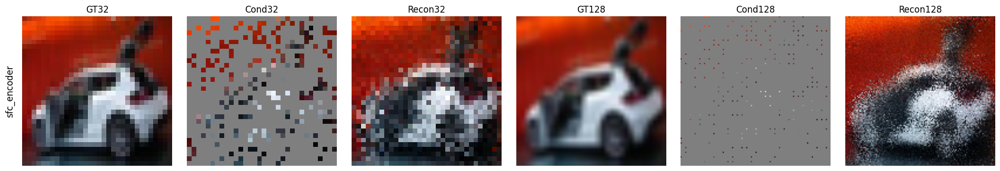

In [3]:
# === Sparse recon + super-res eval for PixNerDiT (SFC encoder) ===
import os, sys
from pathlib import Path
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchvision.datasets import CIFAR10
from torchvision import transforms

# -----------------------
# 0) Make sure we're in the PixNerd repo root (so `import src...` works)
# -----------------------
if not (Path.cwd() / "src").exists():
    for cand in [Path.cwd() / "PixNerd", Path.cwd().parent / "PixNerd"]:
        if (cand / "src").exists():
            os.chdir(cand)
            sys.path.insert(0, str(cand))
            break

torch._dynamo.config.disable = True

# -----------------------
# 1) Imports from your codebase
# -----------------------
from src.models.autoencoder.pixel import PixelAE
from src.models.conditioner.class_label import LabelConditioner
from src.models.transformer.pixnerd_c2i_heavydecoder import PixNerDiT
from src.diffusion.flow_matching.scheduling import LinearScheduler
from src.diffusion.flow_matching.sampling import EulerSampler, ode_step_fn
from src.diffusion.base.guidance import simple_guidance_fn
from src.diffusion.flow_matching.training import FlowMatchingTrainer
from src.callbacks.simple_ema import SimpleEMA
from src.lightning_model import LightningModel

# -----------------------
# 2) SFC experiment (edit ckpt_path)
# -----------------------
EXPERIMENTS = [
    dict(
        name="sfc_encoder",
        ckpt_path="/pscratch/sd/k/kevinval/PNBase/PixNerd/workdirs/exp_cifar10_sfc/checkpoints/epoch=191-step=75000.ckpt",  # <-- CHANGE THIS
        encoder_type="sfc",

        # match training hyperparams:
        hidden_size=512,
        decoder_hidden_size=64,
        num_encoder_blocks=8,
        num_decoder_blocks=2,
        patch_size=8,
        num_groups=8,
        num_classes=10,

        # sparsity behavior:
        sparsity=0.4,
        cond_fraction=0.5,

        # SFC knobs (must match training if you changed them):
        sfc_curve="hilbert",      # "hilbert" or "zorder"
        sfc_group_size=8,         # g
        sfc_cross_depth=2,        # cross-attn depth
    ),
]

# -----------------------
# 3) Helpers
# -----------------------
def build_lightning_model(cfg):
    main_scheduler = LinearScheduler()

    vae = PixelAE(scale=1.0)
    conditioner = LabelConditioner(num_classes=cfg["num_classes"])

    denoiser_kwargs = dict(
        in_channels=3,
        patch_size=cfg["patch_size"],
        num_groups=cfg["num_groups"],
        hidden_size=cfg["hidden_size"],
        decoder_hidden_size=cfg["decoder_hidden_size"],
        num_encoder_blocks=cfg["num_encoder_blocks"],
        num_decoder_blocks=cfg["num_decoder_blocks"],
        num_classes=cfg["num_classes"],
        encoder_type=cfg.get("encoder_type", "grid"),
    )

    # Optional encoder-specific knobs (only passed if present)
    for k in [
        # perceiver knobs (ignored unless encoder_type="perceiver")
        "perceiver_num_latents", "perceiver_cross_heads", "perceiver_depth", "include_patch_tokens_in_perceiver",
        # sfc knobs (used if encoder_type="sfc")
        "sfc_curve", "sfc_group_size", "sfc_cross_depth",
    ]:
        if k in cfg:
            denoiser_kwargs[k] = cfg[k]

    denoiser = PixNerDiT(**denoiser_kwargs)

    sampler = EulerSampler(
        num_steps=600,     # change if you want
        guidance=2,        # change if you want
        guidance_interval_min=0.0,
        guidance_interval_max=1.0,
        scheduler=main_scheduler,
        w_scheduler=LinearScheduler(),
        guidance_fn=simple_guidance_fn,
        step_fn=ode_step_fn,
    )

    trainer = FlowMatchingTrainer(
        scheduler=main_scheduler,
        lognorm_t=True,
        timeshift=1.0,
    )

    ema_tracker = SimpleEMA(decay=0.9999)

    model = LightningModel(
        vae=vae,
        conditioner=conditioner,
        denoiser=denoiser,
        diffusion_trainer=trainer,
        diffusion_sampler=sampler,
        ema_tracker=ema_tracker,
        optimizer=None,
        lr_scheduler=None,
        eval_original_model=False,
        sparsity=cfg["sparsity"],
        cond_fraction=cfg["cond_fraction"],
    )
    return model


def load_ckpt_into_model(model, ckpt_path, device):
    ckpt = torch.load(ckpt_path, map_location="cpu")
    sd = ckpt.get("state_dict", ckpt)
    missing, unexpected = model.load_state_dict(sd, strict=False)
    model = model.to(device)
    model.eval()
    # keep inference stable
    model.ema_denoiser.to(torch.float32)
    model.denoiser.to(torch.float32)
    return missing, unexpected


@torch.no_grad()
def run_sparse_recon(model, images, labels, superres_scale=4):
    """
    images: (B,3,32,32) in [-1,1]
    returns recon32, cond32, recon128, cond128, gt128, metrics
    """
    device = images.device
    B = images.shape[0]

    # --- 32x32 recon ---
    x_latent_32 = model.vae.encode(images)  # (B,3,32,32) for PixelAE
    cond_mask_32, _ = model._make_sparsity_masks(x_latent_32)

    condition, uncondition = model.conditioner(labels)

    noise_32 = torch.randn_like(x_latent_32)
    samples_latent_32 = model.diffusion_sampler(
        model.ema_denoiser,
        noise_32,
        condition,
        uncondition,
        cond_mask=cond_mask_32,
        x_cond=x_latent_32,
    )
    recon_32 = model.vae.decode(samples_latent_32)

    mse32_full = F.mse_loss(recon_32, images).item()
    inv_mask32 = (1.0 - cond_mask_32).expand_as(images)
    mse32_noncond = ((recon_32 - images) ** 2 * inv_mask32).sum() / (inv_mask32.sum() + 1e-8)
    mse32_noncond = mse32_noncond.item()

    cond_vis_32 = cond_mask_32.expand_as(images) * images

    # --- 128x128 super-res: one-pixel lift of SAME 32x32 cond mask ---
    scale = int(superres_scale)
    H_hr = images.shape[-2] * scale
    W_hr = images.shape[-1] * scale

    images_hr = F.interpolate(images, size=(H_hr, W_hr), mode="bilinear", align_corners=False)

    cond_mask_128 = torch.zeros(B, 1, H_hr, W_hr, device=device, dtype=cond_mask_32.dtype)
    cond_mask_128[:, :, ::scale, ::scale] = cond_mask_32

    x_cond_128 = torch.zeros(B, x_latent_32.shape[1], H_hr, W_hr, device=device, dtype=x_latent_32.dtype)
    x_cond_128[:, :, ::scale, ::scale] = x_latent_32
    x_cond_128 = x_cond_128 * cond_mask_128.expand_as(x_cond_128)

    # Temporarily enable HR decoding
    old = (getattr(model.denoiser, "decoder_patch_scaling_h", 1.0),
           getattr(model.denoiser, "decoder_patch_scaling_w", 1.0),
           getattr(model.ema_denoiser, "decoder_patch_scaling_h", 1.0),
           getattr(model.ema_denoiser, "decoder_patch_scaling_w", 1.0))
    if hasattr(model.denoiser, "decoder_patch_scaling_h"):
        model.denoiser.decoder_patch_scaling_h = scale
        model.denoiser.decoder_patch_scaling_w = scale
    if hasattr(model.ema_denoiser, "decoder_patch_scaling_h"):
        model.ema_denoiser.decoder_patch_scaling_h = scale
        model.ema_denoiser.decoder_patch_scaling_w = scale

    noise_128 = torch.randn_like(x_cond_128)
    samples_latent_128 = model.diffusion_sampler(
        model.ema_denoiser,
        noise_128,
        condition,
        uncondition,
        cond_mask=cond_mask_128,
        x_cond=x_cond_128,
    )
    recon_128 = model.vae.decode(samples_latent_128)

    # restore scaling
    if hasattr(model.denoiser, "decoder_patch_scaling_h"):
        model.denoiser.decoder_patch_scaling_h, model.denoiser.decoder_patch_scaling_w = old[0], old[1]
    if hasattr(model.ema_denoiser, "decoder_patch_scaling_h"):
        model.ema_denoiser.decoder_patch_scaling_h, model.ema_denoiser.decoder_patch_scaling_w = old[2], old[3]

    mse128_full = F.mse_loss(recon_128, images_hr).item()
    inv_mask128 = (1.0 - cond_mask_128).expand_as(images_hr)
    mse128_noncond = ((recon_128 - images_hr) ** 2 * inv_mask128).sum() / (inv_mask128.sum() + 1e-8)
    mse128_noncond = mse128_noncond.item()

    # visualize what was actually clamped as conditioning (sparse)
    cond_vis_128 = model.vae.decode(x_cond_128)

    metrics = dict(
        mse32_full=mse32_full,
        mse32_noncond=mse32_noncond,
        mse128_full=mse128_full,
        mse128_noncond=mse128_noncond,
    )
    return recon_32, cond_vis_32, recon_128, cond_vis_128, images_hr, metrics


def to_img01(x):
    return ((x.clamp(-1, 1) + 1) / 2).detach().cpu()

# -----------------------
# 4) Load a fixed CIFAR-10 batch
# -----------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(0)

tfm = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)),
])

ds = CIFAR10(root="./data", train=False, download=True, transform=tfm)
BATCH = 8
images = torch.stack([ds[i][0] for i in range(BATCH)], dim=0).to(device)
labels = torch.tensor([ds[i][1] for i in range(BATCH)], dtype=torch.long).to(device)

# -----------------------
# 5) Run and plot
# -----------------------
all_results = []

for cfg in EXPERIMENTS:
    print("\n" + "="*80)
    print(f"Experiment: {cfg['name']} | encoder_type={cfg.get('encoder_type','(default)')}")
    print(f"ckpt: {cfg['ckpt_path']}")

    model = build_lightning_model(cfg)
    missing, unexpected = load_ckpt_into_model(model, cfg["ckpt_path"], device=device)

    if len(missing) or len(unexpected):
        print(f"[load_state_dict strict=False] missing={len(missing)} unexpected={len(unexpected)}")
        # print("missing:", missing[:50])
        # print("unexpected:", unexpected[:50])

    recon32, cond32, recon128, cond128, gt128, metrics = run_sparse_recon(
        model, images, labels, superres_scale=4
    )

    print("Metrics:", metrics)
    all_results.append((cfg["name"], metrics, recon32, cond32, recon128, cond128, gt128))

cols = ["GT32", "Cond32", "Recon32", "GT128", "Cond128", "Recon128"]
rows = len(all_results)
plt.figure(figsize=(3.2*len(cols), 3.2*rows))

for r, (name, metrics, recon32, cond32, recon128, cond128, gt128) in enumerate(all_results):
    gt32 = images
    for c, (title, tensor) in enumerate([
        ("GT32", gt32),
        ("Cond32", cond32),
        ("Recon32", recon32),
        ("GT128", gt128),
        ("Cond128", cond128),
        ("Recon128", recon128),
    ]):
        ax = plt.subplot(rows, len(cols), r*len(cols) + c + 1)
        ax.imshow(to_img01(tensor[6]).permute(1,2,0))
        ax.axis("off")
        if r == 0:
            ax.set_title(title)
        if c == 0:
            ax.text(-0.05, 0.5, name, transform=ax.transAxes, rotation=90,
                    va="center", ha="right", fontsize=12)

plt.tight_layout()
plt.show()


In [6]:
# have several diff encoders (not just 1 direciton, rn its just 1 hilbert direction) can also have a backward encoder or like z order, several different serailziation of the same input
# change the encoder to be perceiver style to move away from the patch based input assumption
# NF per group, average of the group 



# try omnifield on cifar10


/pscratch/sd/k/kevinval/envs/pixnerd/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Files already downloaded and verified

Experiment: sfc_encoder | encoder_type=sfc
ckpt: /pscratch/sd/k/kevinval/PNBase/PixNerd/workdirs/exp_cifar10_sfc/checkpoints/last-v2.ckpt


current sampler is ODE sampler, but w_scheduler is enabled
/tmp/ipykernel_2355635/621853963.py:208: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(ckpt_path

[rebuild SFC tokenizer from ckpt] in_feat = 544 | per_point = 68 | add_coords = True | coord_bands = 16 | add_sfc_position = True


/pscratch/sd/k/kevinval/PNBase/PixNerd/src/models/conditioner/class_label.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(y).long().cuda()
/pscratch/sd/k/kevinval/PNBase/PixNerd/src/models/transformer/pixnerd_c2i_heavydecoder.py:126: UserWarning: Casting complex values to real discards the imaginary part (Triggered internally at ../aten/src/ATen/native/Copy.cpp:308.)
  pos = pos[None, :, :].to(device=device, dtype=dtype)


Metrics: {'mse32_full': 0.04180649667978287, 'mse32_noncond': 0.05227087810635567, 'mse128_full': 0.03943977132439613, 'mse128_noncond': 0.03982812911272049}


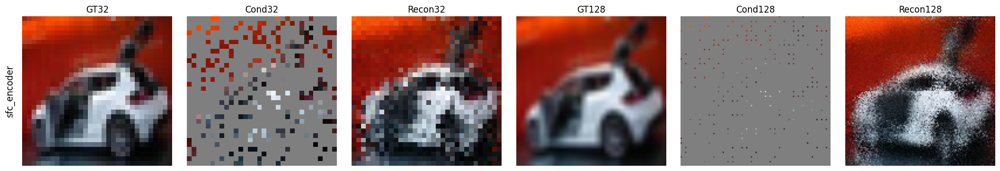

In [1]:
# === Sparse recon + super-res eval for PixNerDiT (SFC encoder) ===
import os, sys
from pathlib import Path
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchvision.datasets import CIFAR10
from torchvision import transforms

# -----------------------
# 0) Make sure we're in the PixNerd repo root (so `import src...` works)
# -----------------------
if not (Path.cwd() / "src").exists():
    for cand in [Path.cwd() / "PixNerd", Path.cwd().parent / "PixNerd"]:
        if (cand / "src").exists():
            os.chdir(cand)
            sys.path.insert(0, str(cand))
            break

torch._dynamo.config.disable = True

# -----------------------
# 1) Imports from your codebase
# -----------------------
from src.models.autoencoder.pixel import PixelAE
from src.models.conditioner.class_label import LabelConditioner
from src.models.transformer.pixnerd_c2i_heavydecoder import PixNerDiT
from src.models.layers.sfc_encoder import SFCTokenizer  # <-- IMPORTANT
from src.diffusion.flow_matching.scheduling import LinearScheduler
from src.diffusion.flow_matching.sampling import EulerSampler, ode_step_fn
from src.diffusion.base.guidance import simple_guidance_fn
from src.diffusion.flow_matching.training import FlowMatchingTrainer
from src.callbacks.simple_ema import SimpleEMA
from src.lightning_model import LightningModel

# -----------------------
# 2) SFC experiment (edit ckpt_path)
# -----------------------
EXPERIMENTS = [
    dict(
        name="sfc_encoder",
        ckpt_path="/pscratch/sd/k/kevinval/PNBase/PixNerd/workdirs/exp_cifar10_sfc/checkpoints/last-v2.ckpt",
        encoder_type="sfc",

        # must match training
        hidden_size=512,
        decoder_hidden_size=64,
        num_encoder_blocks=8,
        num_decoder_blocks=2,
        patch_size=8,
        num_groups=8,
        num_classes=10,

        # sparsity behavior:
        sparsity=0.4,
        cond_fraction=0.5,

        # SFC core knobs (must match training)
        sfc_curve="hilbert",
        sfc_group_size=8,
        sfc_cross_depth=2,

        # OPTIONAL: you can leave these here for reference/logging,
        # but we will NOT pass them into PixNerDiT since it doesn't accept them.
        sfc_coord_mode="neg1to1",
        sfc_token_mlp=False,
    ),
]

# -----------------------
# 3) Helpers
# -----------------------
def build_lightning_model(cfg):
    main_scheduler = LinearScheduler()

    vae = PixelAE(scale=1.0)
    conditioner = LabelConditioner(num_classes=cfg["num_classes"])

    # IMPORTANT: only pass args PixNerDiT actually accepts
    denoiser_kwargs = dict(
        in_channels=3,
        patch_size=cfg["patch_size"],
        num_groups=cfg["num_groups"],
        hidden_size=cfg["hidden_size"],
        decoder_hidden_size=cfg["decoder_hidden_size"],
        num_encoder_blocks=cfg["num_encoder_blocks"],
        num_decoder_blocks=cfg["num_decoder_blocks"],
        num_classes=cfg["num_classes"],
        encoder_type=cfg.get("encoder_type", "grid"),
        # sfc knobs that ARE in PixNerDiT.__init__
        sfc_curve=cfg.get("sfc_curve", "hilbert"),
        sfc_group_size=cfg.get("sfc_group_size", 8),
        sfc_cross_depth=cfg.get("sfc_cross_depth", 2),
        sfc_self_depth=cfg.get("sfc_self_depth", 2),
    )

    denoiser = PixNerDiT(**denoiser_kwargs)

    sampler = EulerSampler(
        num_steps=600,
        guidance=2,
        guidance_interval_min=0.0,
        guidance_interval_max=1.0,
        scheduler=main_scheduler,
        w_scheduler=LinearScheduler(),
        guidance_fn=simple_guidance_fn,
        step_fn=ode_step_fn,
    )

    trainer = FlowMatchingTrainer(
        scheduler=main_scheduler,
        lognorm_t=True,
        timeshift=1.0,
    )

    ema_tracker = SimpleEMA(decay=0.9999)

    model = LightningModel(
        vae=vae,
        conditioner=conditioner,
        denoiser=denoiser,
        diffusion_trainer=trainer,
        diffusion_sampler=sampler,
        ema_tracker=ema_tracker,
        optimizer=None,
        lr_scheduler=None,
        eval_original_model=False,
        sparsity=cfg["sparsity"],
        cond_fraction=cfg["cond_fraction"],
    )
    return model


def infer_and_rebuild_sfc_tokenizers(model, cfg, sd):
    """
    Make model.denoiser.sfc_tokenizer (and ema_denoiser) match the checkpoint shapes
    BEFORE load_state_dict, by inferring add_coords / coord_bands / add_sfc_position
    from token_proj.weight.shape[1].
    """
    key = "denoiser.sfc_tokenizer.token_proj.weight"
    if key not in sd:
        return  # not an SFC ckpt / different naming

    in_feat = sd[key].shape[1]  # token_proj.in_features in ckpt
    g = int(cfg.get("sfc_group_size", 8))
    C = 3  # in_channels

    if in_feat % g != 0:
        raise RuntimeError(f"ckpt token_proj.in_features={in_feat} not divisible by group_size={g}")

    per_point = in_feat // g
    extras = per_point - C
    if extras < 0:
        raise RuntimeError(f"ckpt per-point dim {per_point} < in_channels {C}")

    # Infer:
    # - add_sfc_position contributes +1 per point
    # - Fourier 2D coords with coord_bands=B contributes 4*B per point (sin/cos for x,y)
    add_sfc_position = False
    add_coords = False
    coord_bands = 0

    if extras == 0:
        pass
    elif extras == 1:
        add_sfc_position = False
    else:
        # try split extras into (coords + optional sfc_pos)
        if (extras - 1) % 4 == 0:
            add_sfc_position = True
            add_coords = True
            coord_bands = (extras - 1) // 4
        elif extras % 4 == 0:
            add_coords = True
            coord_bands = extras // 4
        else:
            raise RuntimeError(
                f"Can't infer coords/sfc_pos from extras={extras} (per_point={per_point}, in_feat={in_feat}). "
                f"Expected extras to be 0,1,4k, or 4k+1."
            )

    tok_kwargs = dict(
        in_channels=C,
        hidden_size=int(cfg["hidden_size"]),
        curve=cfg.get("sfc_curve", "hilbert"),
        group_size=g,
        coord_mode=cfg.get("sfc_coord_mode", "neg1to1"),
        add_coords=add_coords,
        coord_bands=int(coord_bands) if add_coords else 16,   # coord_bands ignored if add_coords=False
        add_sfc_position=add_sfc_position,
        token_mlp=bool(cfg.get("sfc_token_mlp", False)),
    )

    # rebuild both denoisers so state_dict shapes match
    if hasattr(model, "denoiser") and hasattr(model.denoiser, "sfc_tokenizer"):
        model.denoiser.sfc_tokenizer = SFCTokenizer(**tok_kwargs)
    if hasattr(model, "ema_denoiser") and hasattr(model.ema_denoiser, "sfc_tokenizer"):
        model.ema_denoiser.sfc_tokenizer = SFCTokenizer(**tok_kwargs)

    print("[rebuild SFC tokenizer from ckpt] in_feat =", in_feat,
          "| per_point =", per_point,
          "| add_coords =", add_coords,
          "| coord_bands =", coord_bands if add_coords else None,
          "| add_sfc_position =", add_sfc_position)


def load_ckpt_into_model(model, ckpt_path, cfg, device):
    ckpt = torch.load(ckpt_path, map_location="cpu")
    sd = ckpt.get("state_dict", ckpt)

    # IMPORTANT: fix tokenizer shapes BEFORE load_state_dict
    infer_and_rebuild_sfc_tokenizers(model, cfg, sd)

    missing, unexpected = model.load_state_dict(sd, strict=False)  # will still error on size mismatch if anything else differs
    model = model.to(device)
    model.eval()
    model.ema_denoiser.to(torch.float32)
    model.denoiser.to(torch.float32)
    return missing, unexpected


@torch.no_grad()
def run_sparse_recon(model, images, labels, superres_scale=4):
    device = images.device
    B = images.shape[0]

    x_latent_32 = model.vae.encode(images)
    cond_mask_32, _ = model._make_sparsity_masks(x_latent_32)

    condition, uncondition = model.conditioner(labels)

    noise_32 = torch.randn_like(x_latent_32)
    samples_latent_32 = model.diffusion_sampler(
        model.ema_denoiser,
        noise_32,
        condition,
        uncondition,
        cond_mask=cond_mask_32,
        x_cond=x_latent_32,
    )
    recon_32 = model.vae.decode(samples_latent_32)

    mse32_full = F.mse_loss(recon_32, images).item()
    inv_mask32 = (1.0 - cond_mask_32).expand_as(images)
    mse32_noncond = ((recon_32 - images) ** 2 * inv_mask32).sum() / (inv_mask32.sum() + 1e-8)
    mse32_noncond = mse32_noncond.item()
    cond_vis_32 = cond_mask_32.expand_as(images) * images

    scale = int(superres_scale)
    H_hr = images.shape[-2] * scale
    W_hr = images.shape[-1] * scale
    images_hr = F.interpolate(images, size=(H_hr, W_hr), mode="bilinear", align_corners=False)

    cond_mask_128 = torch.zeros(B, 1, H_hr, W_hr, device=device, dtype=cond_mask_32.dtype)
    cond_mask_128[:, :, ::scale, ::scale] = cond_mask_32

    x_cond_128 = torch.zeros(B, x_latent_32.shape[1], H_hr, W_hr, device=device, dtype=x_latent_32.dtype)
    x_cond_128[:, :, ::scale, ::scale] = x_latent_32
    x_cond_128 = x_cond_128 * cond_mask_128.expand_as(x_cond_128)

    old = (getattr(model.denoiser, "decoder_patch_scaling_h", 1.0),
           getattr(model.denoiser, "decoder_patch_scaling_w", 1.0),
           getattr(model.ema_denoiser, "decoder_patch_scaling_h", 1.0),
           getattr(model.ema_denoiser, "decoder_patch_scaling_w", 1.0))
    if hasattr(model.denoiser, "decoder_patch_scaling_h"):
        model.denoiser.decoder_patch_scaling_h = scale
        model.denoiser.decoder_patch_scaling_w = scale
    if hasattr(model.ema_denoiser, "decoder_patch_scaling_h"):
        model.ema_denoiser.decoder_patch_scaling_h = scale
        model.ema_denoiser.decoder_patch_scaling_w = scale

    noise_128 = torch.randn_like(x_cond_128)
    samples_latent_128 = model.diffusion_sampler(
        model.ema_denoiser,
        noise_128,
        condition,
        uncondition,
        cond_mask=cond_mask_128,
        x_cond=x_cond_128,
    )
    recon_128 = model.vae.decode(samples_latent_128)

    if hasattr(model.denoiser, "decoder_patch_scaling_h"):
        model.denoiser.decoder_patch_scaling_h, model.denoiser.decoder_patch_scaling_w = old[0], old[1]
    if hasattr(model.ema_denoiser, "decoder_patch_scaling_h"):
        model.ema_denoiser.decoder_patch_scaling_h, model.ema_denoiser.decoder_patch_scaling_w = old[2], old[3]

    mse128_full = F.mse_loss(recon_128, images_hr).item()
    inv_mask128 = (1.0 - cond_mask_128).expand_as(images_hr)
    mse128_noncond = ((recon_128 - images_hr) ** 2 * inv_mask128).sum() / (inv_mask128.sum() + 1e-8)
    mse128_noncond = mse128_noncond.item()

    cond_vis_128 = model.vae.decode(x_cond_128)

    metrics = dict(
        mse32_full=mse32_full,
        mse32_noncond=mse32_noncond,
        mse128_full=mse128_full,
        mse128_noncond=mse128_noncond,
    )
    return recon_32, cond_vis_32, recon_128, cond_vis_128, images_hr, metrics


def to_img01(x):
    return ((x.clamp(-1, 1) + 1) / 2).detach().cpu()

# -----------------------
# 4) Load a fixed CIFAR-10 batch
# -----------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(0)

tfm = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)),
])
ds = CIFAR10(root="./data", train=False, download=True, transform=tfm)

BATCH = 8
images = torch.stack([ds[i][0] for i in range(BATCH)], dim=0).to(device)
labels = torch.tensor([ds[i][1] for i in range(BATCH)], dtype=torch.long).to(device)

# -----------------------
# 5) Run and plot
# -----------------------
all_results = []

for cfg in EXPERIMENTS:
    print("\n" + "="*80)
    print(f"Experiment: {cfg['name']} | encoder_type={cfg.get('encoder_type','(default)')}")
    print(f"ckpt: {cfg['ckpt_path']}")

    model = build_lightning_model(cfg)
    missing, unexpected = load_ckpt_into_model(model, cfg["ckpt_path"], cfg, device=device)

    if len(missing) or len(unexpected):
        print(f"[load_state_dict strict=False] missing={len(missing)} unexpected={len(unexpected)}")

    recon32, cond32, recon128, cond128, gt128, metrics = run_sparse_recon(
        model, images, labels, superres_scale=4
    )
    print("Metrics:", metrics)
    all_results.append((cfg["name"], metrics, recon32, cond32, recon128, cond128, gt128))

cols = ["GT32", "Cond32", "Recon32", "GT128", "Cond128", "Recon128"]
rows = len(all_results)
plt.figure(figsize=(3.2*len(cols), 3.2*rows))

for r, (name, metrics, recon32, cond32, recon128, cond128, gt128) in enumerate(all_results):
    gt32 = images
    for c, (title, tensor) in enumerate([
        ("GT32", gt32),
        ("Cond32", cond32),
        ("Recon32", recon32),
        ("GT128", gt128),
        ("Cond128", cond128),
        ("Recon128", recon128),
    ]):
        ax = plt.subplot(rows, len(cols), r*len(cols) + c + 1)
        ax.imshow(to_img01(tensor[6]).permute(1,2,0))
        ax.axis("off")
        if r == 0:
            ax.set_title(title)
        if c == 0:
            ax.text(-0.05, 0.5, name, transform=ax.transAxes, rotation=90,
                    va="center", ha="right", fontsize=12)

plt.tight_layout()
plt.show()


/pscratch/sd/k/kevinval/envs/pixnerd/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Files already downloaded and verified

Experiment: sfc_encoder | encoder_type=sfc
ckpt: /pscratch/sd/k/kevinval/PNBase/PixNerd/workdirs/exp_cifar10_sfcv2/checkpoints/last-v1.ckpt


current sampler is ODE sampler, but w_scheduler is enabled
/tmp/ipykernel_551269/1708779548.py:216: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(ckpt_path

[rebuild SFC tokenizer from ckpt] token_proj.in_feat = 4128 | add_coords = True | coord_bands = 16 | add_sfc_position = True
[load_state_dict strict=False] missing=0 unexpected=4


/pscratch/sd/k/kevinval/PNBase/PixNerd/src/models/conditioner/class_label.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(y).long().cuda()
/pscratch/sd/k/kevinval/PNBase/PixNerd/src/models/transformer/pixnerd_c2i_heavydecoder.py:126: UserWarning: Casting complex values to real discards the imaginary part (Triggered internally at ../aten/src/ATen/native/Copy.cpp:308.)
  pos = pos[None, :, :].to(device=device, dtype=dtype)


Metrics: {'mse32_full': 0.0682932659983635, 'mse32_noncond': 0.08538742363452911, 'mse128_full': 0.06793524324893951, 'mse128_noncond': 0.0686846673488617}


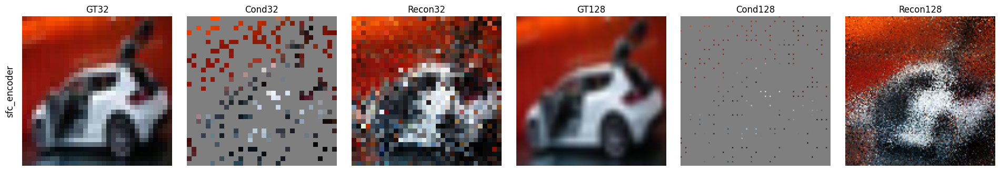

In [1]:
# === Sparse recon + super-res eval for PixNerDiT (SFC encoder) ===
import os, sys
from pathlib import Path
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchvision.datasets import CIFAR10
from torchvision import transforms

# -----------------------
# 0) Make sure we're in the PixNerd repo root (so `import src...` works)
# -----------------------
if not (Path.cwd() / "src").exists():
    for cand in [Path.cwd() / "PixNerd", Path.cwd().parent / "PixNerd"]:
        if (cand / "src").exists():
            os.chdir(cand)
            sys.path.insert(0, str(cand))
            break

torch._dynamo.config.disable = True

# -----------------------
# 1) Imports from your codebase
# -----------------------
from src.models.autoencoder.pixel import PixelAE
from src.models.conditioner.class_label import LabelConditioner
from src.models.transformer.pixnerd_c2i_heavydecoder import PixNerDiT
from src.models.layers.sfc_encoder import SFCTokenizer  # <-- IMPORTANT
from src.diffusion.flow_matching.scheduling import LinearScheduler
from src.diffusion.flow_matching.sampling import EulerSampler, ode_step_fn
from src.diffusion.base.guidance import simple_guidance_fn
from src.diffusion.flow_matching.training import FlowMatchingTrainer
from src.callbacks.simple_ema import SimpleEMA
from src.lightning_model import LightningModel

# -----------------------
# 2) SFC experiment (edit ckpt_path)
# -----------------------
EXPERIMENTS = [
    dict(
        name="sfc_encoder",
        ckpt_path="/pscratch/sd/k/kevinval/PNBase/PixNerd/workdirs/exp_cifar10_sfcv2/checkpoints/last-v1.ckpt",
        encoder_type="sfc",

        # must match training
        hidden_size=512,
        decoder_hidden_size=64,
        num_encoder_blocks=8,
        num_decoder_blocks=2,
        patch_size=8,
        num_groups=8,
        num_classes=10,

        # sparsity behavior:
        sparsity=0.4,
        cond_fraction=0.5,

        # SFC core knobs (must match training)
        sfc_curve="hilbert",
        sfc_group_size=8,
        sfc_cross_depth=2,

        # OPTIONAL: you can leave these here for reference/logging,
        # but we will NOT pass them into PixNerDiT since it doesn't accept them.
        sfc_coord_mode="neg1to1",
        sfc_token_mlp=False,
    ),
]

# -----------------------
# 3) Helpers
# -----------------------
def build_lightning_model(cfg):
    main_scheduler = LinearScheduler()

    vae = PixelAE(scale=1.0)
    conditioner = LabelConditioner(num_classes=cfg["num_classes"])

    # IMPORTANT: only pass args PixNerDiT actually accepts
    denoiser_kwargs = dict(
        in_channels=3,
        patch_size=cfg["patch_size"],
        num_groups=cfg["num_groups"],
        hidden_size=cfg["hidden_size"],
        decoder_hidden_size=cfg["decoder_hidden_size"],
        num_encoder_blocks=cfg["num_encoder_blocks"],
        num_decoder_blocks=cfg["num_decoder_blocks"],
        num_classes=cfg["num_classes"],
        encoder_type=cfg.get("encoder_type", "grid"),
        # sfc knobs that ARE in PixNerDiT.__init__
        sfc_curve=cfg.get("sfc_curve", "hilbert"),
        sfc_group_size=cfg.get("sfc_group_size", 8),
        sfc_cross_depth=cfg.get("sfc_cross_depth", 2),
        sfc_self_depth=cfg.get("sfc_self_depth", 2),
    )

    denoiser = PixNerDiT(**denoiser_kwargs)

    sampler = EulerSampler(
        num_steps=600,
        guidance=2,
        guidance_interval_min=0.0,
        guidance_interval_max=1.0,
        scheduler=main_scheduler,
        w_scheduler=LinearScheduler(),
        guidance_fn=simple_guidance_fn,
        step_fn=ode_step_fn,
    )

    trainer = FlowMatchingTrainer(
        scheduler=main_scheduler,
        lognorm_t=True,
        timeshift=1.0,
    )

    ema_tracker = SimpleEMA(decay=0.9999)

    model = LightningModel(
        vae=vae,
        conditioner=conditioner,
        denoiser=denoiser,
        diffusion_trainer=trainer,
        diffusion_sampler=sampler,
        ema_tracker=ema_tracker,
        optimizer=None,
        lr_scheduler=None,
        eval_original_model=False,
        sparsity=cfg["sparsity"],
        cond_fraction=cfg["cond_fraction"],
    )
    return model


def infer_and_rebuild_sfc_tokenizers(model, cfg, sd):
    """
    Rebuild SFC tokenizer modules to match checkpoint shapes BEFORE load_state_dict.

    Key idea:
    - coord_bands must be inferred from coord_embed input dim (NOT token_proj).
    - token_proj.in_features tells us whether add_sfc_position was used.
    """
    tok_key = "denoiser.sfc_tokenizer.token_proj.weight"
    coord_key = "denoiser.sfc_tokenizer.coord_embed.mlp.0.weight"

    if tok_key not in sd:
        return  # not an SFC ckpt / different naming

    in_feat = sd[tok_key].shape[1]  # token_proj.in_features in ckpt
    g = int(cfg.get("sfc_group_size", 8))
    C = 3  # in_channels (matches your PixNerDiT(in_channels=3))
    H = int(cfg["hidden_size"])

    # -------------------------
    # 1) Infer coord_bands from coord_embed input dim
    # -------------------------
    add_coords = coord_key in sd
    coord_bands = 0

    if add_coords:
        coord_in = sd[coord_key].shape[1]  # should be 4 * coord_bands
        if coord_in % 4 != 0:
            raise RuntimeError(
                f"coord_embed input dim={coord_in} not divisible by 4; "
                f"can't map to coord_bands cleanly."
            )
        coord_bands = coord_in // 4

    # -------------------------
    # 2) Infer add_sfc_position from token_proj.in_features
    #    token_proj sees: [vals(C) + coord_emb(H if add_coords else 0) + sfc_pos(1?)] * g
    # -------------------------
    per_point_expected_no_pos = C + (H if add_coords else 0)
    expected_no_pos = g * per_point_expected_no_pos
    diff = in_feat - expected_no_pos

    if diff == 0:
        add_sfc_position = False
    elif diff == g:
        add_sfc_position = True
    else:
        raise RuntimeError(
            f"Can't infer add_sfc_position: token_proj.in_features={in_feat}, "
            f"expected {expected_no_pos} (no_pos) or {expected_no_pos + g} (with_pos). "
            f"(g={g}, C={C}, H={H}, add_coords={add_coords})"
        )

    tok_kwargs = dict(
        in_channels=C,
        hidden_size=H,
        curve=cfg.get("sfc_curve", "hilbert"),
        group_size=g,
        coord_mode=cfg.get("sfc_coord_mode", "neg1to1"),
        add_coords=add_coords,
        coord_bands=int(coord_bands) if add_coords else 16,  # ignored if add_coords=False
        add_sfc_position=add_sfc_position,
        token_mlp=bool(cfg.get("sfc_token_mlp", False)),
    )

    # rebuild both denoisers so state_dict shapes match
    if hasattr(model, "denoiser") and hasattr(model.denoiser, "sfc_tokenizer"):
        model.denoiser.sfc_tokenizer = SFCTokenizer(**tok_kwargs)
    if hasattr(model, "ema_denoiser") and hasattr(model.ema_denoiser, "sfc_tokenizer"):
        model.ema_denoiser.sfc_tokenizer = SFCTokenizer(**tok_kwargs)

    print(
        "[rebuild SFC tokenizer from ckpt]",
        "token_proj.in_feat =", in_feat,
        "| add_coords =", add_coords,
        "| coord_bands =", coord_bands if add_coords else None,
        "| add_sfc_position =", add_sfc_position
    )



def load_ckpt_into_model(model, ckpt_path, cfg, device):
    ckpt = torch.load(ckpt_path, map_location="cpu")
    sd = ckpt.get("state_dict", ckpt)

    # IMPORTANT: fix tokenizer shapes BEFORE load_state_dict
    infer_and_rebuild_sfc_tokenizers(model, cfg, sd)

    missing, unexpected = model.load_state_dict(sd, strict=False)  # will still error on size mismatch if anything else differs
    model = model.to(device)
    model.eval()
    model.ema_denoiser.to(torch.float32)
    model.denoiser.to(torch.float32)
    return missing, unexpected


@torch.no_grad()
def run_sparse_recon(model, images, labels, superres_scale=4):
    device = images.device
    B = images.shape[0]

    x_latent_32 = model.vae.encode(images)
    cond_mask_32, _ = model._make_sparsity_masks(x_latent_32)

    condition, uncondition = model.conditioner(labels)

    noise_32 = torch.randn_like(x_latent_32)
    samples_latent_32 = model.diffusion_sampler(
        model.ema_denoiser,
        noise_32,
        condition,
        uncondition,
        cond_mask=cond_mask_32,
        x_cond=x_latent_32,
    )
    recon_32 = model.vae.decode(samples_latent_32)

    mse32_full = F.mse_loss(recon_32, images).item()
    inv_mask32 = (1.0 - cond_mask_32).expand_as(images)
    mse32_noncond = ((recon_32 - images) ** 2 * inv_mask32).sum() / (inv_mask32.sum() + 1e-8)
    mse32_noncond = mse32_noncond.item()
    cond_vis_32 = cond_mask_32.expand_as(images) * images

    scale = int(superres_scale)
    H_hr = images.shape[-2] * scale
    W_hr = images.shape[-1] * scale
    images_hr = F.interpolate(images, size=(H_hr, W_hr), mode="bilinear", align_corners=False)

    cond_mask_128 = torch.zeros(B, 1, H_hr, W_hr, device=device, dtype=cond_mask_32.dtype)
    cond_mask_128[:, :, ::scale, ::scale] = cond_mask_32

    x_cond_128 = torch.zeros(B, x_latent_32.shape[1], H_hr, W_hr, device=device, dtype=x_latent_32.dtype)
    x_cond_128[:, :, ::scale, ::scale] = x_latent_32
    x_cond_128 = x_cond_128 * cond_mask_128.expand_as(x_cond_128)

    old = (getattr(model.denoiser, "decoder_patch_scaling_h", 1.0),
           getattr(model.denoiser, "decoder_patch_scaling_w", 1.0),
           getattr(model.ema_denoiser, "decoder_patch_scaling_h", 1.0),
           getattr(model.ema_denoiser, "decoder_patch_scaling_w", 1.0))
    if hasattr(model.denoiser, "decoder_patch_scaling_h"):
        model.denoiser.decoder_patch_scaling_h = scale
        model.denoiser.decoder_patch_scaling_w = scale
    if hasattr(model.ema_denoiser, "decoder_patch_scaling_h"):
        model.ema_denoiser.decoder_patch_scaling_h = scale
        model.ema_denoiser.decoder_patch_scaling_w = scale

    noise_128 = torch.randn_like(x_cond_128)
    samples_latent_128 = model.diffusion_sampler(
        model.ema_denoiser,
        noise_128,
        condition,
        uncondition,
        cond_mask=cond_mask_128,
        x_cond=x_cond_128,
    )
    recon_128 = model.vae.decode(samples_latent_128)

    if hasattr(model.denoiser, "decoder_patch_scaling_h"):
        model.denoiser.decoder_patch_scaling_h, model.denoiser.decoder_patch_scaling_w = old[0], old[1]
    if hasattr(model.ema_denoiser, "decoder_patch_scaling_h"):
        model.ema_denoiser.decoder_patch_scaling_h, model.ema_denoiser.decoder_patch_scaling_w = old[2], old[3]

    mse128_full = F.mse_loss(recon_128, images_hr).item()
    inv_mask128 = (1.0 - cond_mask_128).expand_as(images_hr)
    mse128_noncond = ((recon_128 - images_hr) ** 2 * inv_mask128).sum() / (inv_mask128.sum() + 1e-8)
    mse128_noncond = mse128_noncond.item()

    cond_vis_128 = model.vae.decode(x_cond_128)

    metrics = dict(
        mse32_full=mse32_full,
        mse32_noncond=mse32_noncond,
        mse128_full=mse128_full,
        mse128_noncond=mse128_noncond,
    )
    return recon_32, cond_vis_32, recon_128, cond_vis_128, images_hr, metrics


def to_img01(x):
    return ((x.clamp(-1, 1) + 1) / 2).detach().cpu()

# -----------------------
# 4) Load a fixed CIFAR-10 batch
# -----------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(0)

tfm = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)),
])
ds = CIFAR10(root="./data", train=False, download=True, transform=tfm)

BATCH = 8
images = torch.stack([ds[i][0] for i in range(BATCH)], dim=0).to(device)
labels = torch.tensor([ds[i][1] for i in range(BATCH)], dtype=torch.long).to(device)

# -----------------------
# 5) Run and plot
# -----------------------
all_results = []

for cfg in EXPERIMENTS:
    print("\n" + "="*80)
    print(f"Experiment: {cfg['name']} | encoder_type={cfg.get('encoder_type','(default)')}")
    print(f"ckpt: {cfg['ckpt_path']}")

    model = build_lightning_model(cfg)
    missing, unexpected = load_ckpt_into_model(model, cfg["ckpt_path"], cfg, device=device)

    if len(missing) or len(unexpected):
        print(f"[load_state_dict strict=False] missing={len(missing)} unexpected={len(unexpected)}")

    recon32, cond32, recon128, cond128, gt128, metrics = run_sparse_recon(
        model, images, labels, superres_scale=4
    )
    print("Metrics:", metrics)
    all_results.append((cfg["name"], metrics, recon32, cond32, recon128, cond128, gt128))

cols = ["GT32", "Cond32", "Recon32", "GT128", "Cond128", "Recon128"]
rows = len(all_results)
plt.figure(figsize=(3.2*len(cols), 3.2*rows))

for r, (name, metrics, recon32, cond32, recon128, cond128, gt128) in enumerate(all_results):
    gt32 = images
    for c, (title, tensor) in enumerate([
        ("GT32", gt32),
        ("Cond32", cond32),
        ("Recon32", recon32),
        ("GT128", gt128),
        ("Cond128", cond128),
        ("Recon128", recon128),
    ]):
        ax = plt.subplot(rows, len(cols), r*len(cols) + c + 1)
        ax.imshow(to_img01(tensor[6]).permute(1,2,0))
        ax.axis("off")
        if r == 0:
            ax.set_title(title)
        if c == 0:
            ax.text(-0.05, 0.5, name, transform=ax.transAxes, rotation=90,
                    va="center", ha="right", fontsize=12)

plt.tight_layout()
plt.show()


In [ ]:
# ===============================================================
# Sparse PerceiverIO CIFAR-10 (fixed per-instance masks)
# 40% observed = 20% conditioning + 20% target-loss (fixed per image)
# ===============================================================

from torch.optim import AdamW
import torch
from torch.optim.lr_scheduler import CosineAnnealingLR
from einops import rearrange, repeat
import ssl
import torchvision
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
from math import pi, log
from functools import wraps
import torch.nn.functional as F
import torch.nn as nn
from torch.utils.data import DataLoader

# Fix for torchvision dataset download issue
ssl._create_default_https_context = ssl._create_unverified_context

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("DEVICE:", DEVICE)

# ===============================================================
# --- 1) Model Helpers ---
# ===============================================================

def exists(val):
    return val is not None

def default(val, d):
    return val if exists(val) else d

def cache_fn(f):
    cache = None
    @wraps(f)
    def cached_fn(*args, _cache = True, **kwargs):
        if not _cache:
            return f(*args, **kwargs)
        nonlocal cache
        if cache is not None:
            return cache
        cache = f(*args, **kwargs)
        return cache
    return cached_fn

class PreNorm(nn.Module):
    def __init__(self, dim, fn, context_dim = None):
        super().__init__()
        self.fn = fn
        self.norm = nn.LayerNorm(dim)
        self.norm_context = nn.LayerNorm(context_dim) if exists(context_dim) else None

    def forward(self, x, **kwargs):
        x = self.norm(x)
        if exists(self.norm_context):
            context = kwargs['context']
            normed_context = self.norm_context(context)
            kwargs.update(context = normed_context)
        return self.fn(x, **kwargs)

class GEGLU(nn.Module):
    def forward(self, x):
        x, gates = x.chunk(2, dim = -1)
        return x * F.gelu(gates)

class FeedForward(nn.Module):
    def __init__(self, dim, mult = 4):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(dim, dim * mult * 2),
            GEGLU(),
            nn.Linear(dim * mult, dim)
        )
    def forward(self, x):
        return self.net(x)

class Attention(nn.Module):
    def __init__(self, query_dim, context_dim = None, heads = 8, dim_head = 64):
        super().__init__()
        inner_dim = dim_head * heads
        context_dim = default(context_dim, query_dim)
        self.scale = dim_head ** -0.5
        self.heads = heads
        self.to_q = nn.Linear(query_dim, inner_dim, bias = False)
        self.to_kv = nn.Linear(context_dim, inner_dim * 2, bias = False)
        self.to_out = nn.Linear(inner_dim, query_dim)
        self.latest_attn = None

    def forward(self, x, context = None, mask = None):
        h = self.heads
        q = self.to_q(x)
        context = default(context, x)
        k, v = self.to_kv(context).chunk(2, dim = -1)

        q, k, v = map(lambda t: rearrange(t, 'b n (h d) -> (b h) n d', h = h), (q, k, v))
        sim = torch.einsum('b i d, b j d -> b i j', q, k) * self.scale

        if exists(mask):
            mask = rearrange(mask, 'b ... -> b (...)')
            max_neg_value = -torch.finfo(sim.dtype).max
            mask = repeat(mask, 'b j -> (b h) () j', h = h)
            sim.masked_fill_(~mask, max_neg_value)

        attn = sim.softmax(dim = -1)
        self.latest_attn = attn.detach()

        out = torch.einsum('b i j, b j d -> b i d', attn, v)
        out = rearrange(out, '(b h) n d -> b n (h d)', h = h)
        return self.to_out(out)

def get_sinusoidal_embeddings(n, d):
    assert d % 2 == 0, "latent_dim must be even"
    position = torch.arange(n, dtype=torch.float).unsqueeze(1)
    div_term = torch.exp(torch.arange(0, d, 2).float() * -(log(10000.0) / d))
    pe = torch.zeros(n, d)
    pe[:, 0::2] = torch.sin(position * div_term)
    pe[:, 1::2] = torch.cos(position * div_term)
    return pe

# ===============================================================
# --- 2) Cascaded PerceiverIO ---
# ===============================================================

class CascadedBlock(nn.Module):
    def __init__(self, dim, n_latents, input_dim, cross_heads, cross_dim_head, self_heads, self_dim_head, residual_dim=None):
        super().__init__()
        self.latents = nn.Parameter(get_sinusoidal_embeddings(n_latents, dim), requires_grad=False)

        self.cross_attn = PreNorm(
            dim,
            Attention(dim, input_dim, heads=cross_heads, dim_head=cross_dim_head),
            context_dim=input_dim
        )
        self.self_attn = PreNorm(dim, Attention(dim, heads=self_heads, dim_head=self_dim_head))
        self.residual_proj = nn.Linear(residual_dim, dim) if residual_dim and residual_dim != dim else None
        self.ff = PreNorm(dim, FeedForward(dim))

    def forward(self, x, context, mask=None, residual=None):
        b = context.size(0)
        latents = repeat(self.latents, 'n d -> b n d', b=b)

        latents = self.cross_attn(latents, context=context, mask=mask) + latents

        if residual is not None:
            if self.residual_proj:
                residual = self.residual_proj(residual)
            latents = latents + residual

        latents = self.self_attn(latents) + latents
        latents = self.ff(latents) + latents
        return latents

class CascadedPerceiverIO(nn.Module):
    def __init__(
        self,
        *,
        input_dim,
        queries_dim,
        logits_dim = None,
        latent_dims=(256, 384, 512),
        num_latents=(256, 256, 256),
        cross_heads = 4,
        cross_dim_head = 128,
        self_heads = 8,
        self_dim_head = 128,
        decoder_ff = False,
    ):
        super().__init__()

        assert len(latent_dims) == len(num_latents), "latent_dims and num_latents must have same length"

        # (unused in your forward, but left intact)
        self.input_proj = nn.Sequential(
            nn.Linear(4, 128),
            nn.GELU(),
            nn.Linear(128, 128)
        )
        self.projection_matrix = nn.Parameter(torch.randn(4, 128) / np.sqrt(4))

        self.encoder_blocks = nn.ModuleList()
        prev_dim = None
        for dim, n_latents in zip(latent_dims, num_latents):
            block = CascadedBlock(
                dim=dim,
                n_latents=n_latents,
                input_dim=input_dim,
                cross_heads=cross_heads,
                cross_dim_head=cross_dim_head,
                self_heads=self_heads,
                self_dim_head=self_dim_head,
                residual_dim=prev_dim
            )
            self.encoder_blocks.append(block)
            prev_dim = dim

        final_latent_dim = latent_dims[-1]
        self.decoder_cross_attn = PreNorm(
            queries_dim,
            Attention(queries_dim, final_latent_dim, heads=cross_heads, dim_head=cross_dim_head),
            context_dim=final_latent_dim
        )

        self.decoder_ff = PreNorm(queries_dim, FeedForward(queries_dim)) if decoder_ff else None
        self.to_logits = nn.Linear(queries_dim, logits_dim) if exists(logits_dim) else nn.Identity()

        self.self_attn_blocks = nn.Sequential(*[
            nn.Sequential(
                PreNorm(final_latent_dim, Attention(final_latent_dim, heads=self_heads, dim_head=self_dim_head)),
                PreNorm(final_latent_dim, FeedForward(final_latent_dim))
            )
            for _ in range(4)
        ])

    def forward(self, data, mask=None, queries=None):
        b = data.size(0)
        residual = None

        for block in self.encoder_blocks:
            residual = block(x=residual, context=data, mask=mask, residual=residual)

        for sa_block in self.self_attn_blocks:
            residual = sa_block[0](residual) + residual
            residual = sa_block[1](residual) + residual

        # (optional debug)
        if b == 1:
            latent_std = residual.std(dim=1).mean().item()
            print(f"[Latent std]: {latent_std:.4f}")

        # ---- BUGFIX: if queries is None, return residual (not undefined "latents") ----
        if queries is None:
            return residual

        if queries.ndim == 2:
            queries = repeat(queries, 'n d -> b n d', b=b)

        x = self.decoder_cross_attn(queries, context=residual)
        x = x + queries  # skip

        if self.decoder_ff:
            x = x + self.decoder_ff(x)

        return self.to_logits(x)

# ===============================================================
# --- 3) Fourier Features Encoder ---
# ===============================================================

class GaussianFourierFeatures(nn.Module):
    def __init__(self, in_features, mapping_size, scale=15.0):
        super().__init__()
        self.in_features = in_features
        self.mapping_size = mapping_size
        self.register_buffer('B', torch.randn((in_features, mapping_size)) * scale)

    def forward(self, coords):
        # coords: (B, N, in_features)
        projections = coords @ self.B
        fourier_feats = torch.cat([torch.sin(projections), torch.cos(projections)], dim=-1)
        return fourier_feats

# ===============================================================
# --- 4) Config ---
# ===============================================================

BATCH_SIZE = 64
EPOCHS = 50
LEARNING_RATE = 2e-4

IMAGE_SIZE_TRAIN = 32
IMAGE_SIZE_HI_RES = 128
CHANNELS = 3

FOURIER_MAPPING_SIZE = 96
POS_EMBED_DIM = FOURIER_MAPPING_SIZE * 2  # sin+cos
INPUT_DIM = CHANNELS + POS_EMBED_DIM
QUERIES_DIM = POS_EMBED_DIM
LOGITS_DIM = CHANNELS

# Sparse scheme: 40% observed = 20% cond + 20% target (loss)
COND_FRAC = 0.20
TGT_FRAC  = 0.20
MASK_SEED_TRAIN = 12345
MASK_SEED_TEST  = 54321

# ===============================================================
# --- 5) Fixed-per-instance sparse dataset + gather helper ---
# ===============================================================

class CIFAR10WithFixedSparseSplit(torchvision.datasets.CIFAR10):
    """
    Returns: (image, label, cond_idx, tgt_idx)
    cond_idx and tgt_idx are FIXED per dataset index.
    """
    def __init__(self, *args, cond_frac=0.2, tgt_frac=0.2, mask_seed=12345, **kwargs):
        super().__init__(*args, **kwargs)
        self.n_pixels = IMAGE_SIZE_TRAIN * IMAGE_SIZE_TRAIN
        self.n_cond = int(cond_frac * self.n_pixels)
        self.n_tgt  = int(tgt_frac  * self.n_pixels)
        assert self.n_cond + self.n_tgt <= self.n_pixels, "cond+tgt exceeds total pixels"

        self.cond_idx = torch.empty((len(self), self.n_cond), dtype=torch.int64)
        self.tgt_idx  = torch.empty((len(self), self.n_tgt),  dtype=torch.int64)

        g = torch.Generator()
        for i in range(len(self)):
            g.manual_seed(mask_seed + i)
            perm = torch.randperm(self.n_pixels, generator=g)
            self.cond_idx[i] = perm[:self.n_cond]
            self.tgt_idx[i]  = perm[self.n_cond:self.n_cond + self.n_tgt]

    def __getitem__(self, idx):
        img, y = super().__getitem__(idx)
        return img, y, self.cond_idx[idx], self.tgt_idx[idx]

def batched_gather(x, idx):
    """
    x:   (B, N, D)
    idx: (B, K) long
    out: (B, K, D)
    """
    B, N, D = x.shape
    idx = idx.unsqueeze(-1).expand(B, idx.shape[1], D)
    return x.gather(1, idx)

# ===============================================================
# --- 6) Data ---
# ===============================================================

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

train_dataset = CIFAR10WithFixedSparseSplit(
    root='./data', train=True, download=True, transform=transform,
    cond_frac=COND_FRAC, tgt_frac=TGT_FRAC, mask_seed=MASK_SEED_TRAIN
)

test_dataset = CIFAR10WithFixedSparseSplit(
    root='./data', train=False, download=True, transform=transform,
    cond_frac=COND_FRAC, tgt_frac=TGT_FRAC, mask_seed=MASK_SEED_TEST
)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,  num_workers=4, pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)

# ===============================================================
# --- 7) Model + Optim ---
# ===============================================================

fourier_encoder = GaussianFourierFeatures(
    in_features=2,
    mapping_size=FOURIER_MAPPING_SIZE,
    scale=15.0
).to(DEVICE)

model = CascadedPerceiverIO(
    input_dim=INPUT_DIM,
    queries_dim=QUERIES_DIM,
    logits_dim=LOGITS_DIM,
    latent_dims=(256, 384, 512),
    num_latents=(256, 256, 256),
    decoder_ff=True
).to(DEVICE)

optimizer = AdamW(list(model.parameters()) + list(fourier_encoder.parameters()), lr=LEARNING_RATE)
loss_fn = nn.MSELoss()
scheduler = CosineAnnealingLR(optimizer, T_max=EPOCHS * len(train_loader))

total_params = sum(p.numel() for p in model.parameters()) + sum(p.numel() for p in fourier_encoder.parameters())
print(f"Total parameters: {total_params/1e6:.2f}M")

# ===============================================================
# --- 8) Grids + Input prep ---
# ===============================================================

def create_coordinate_grid(h, w, device):
    grid = torch.stack(torch.meshgrid(
        torch.linspace(-1.0, 1.0, h, device=device),
        torch.linspace(-1.0, 1.0, w, device=device),
        indexing='ij'
    ), dim=-1)
    return rearrange(grid, 'h w c -> (h w) c')  # (N, 2)

coords_32x32  = create_coordinate_grid(IMAGE_SIZE_TRAIN,  IMAGE_SIZE_TRAIN,  DEVICE)
coords_128x128 = create_coordinate_grid(IMAGE_SIZE_HI_RES, IMAGE_SIZE_HI_RES, DEVICE)

def prepare_model_input(images, coords, fourier_encoder_fn):
    """
    images: (B, C, H, W)
    coords: (N, 2)
    Returns:
      full_input_with_pos: (B, N, C + pos_dim)
      full_pixels:         (B, N, C)
      full_coords:         (B, N, 2)
    """
    b, c, h, w = images.shape
    pixels = rearrange(images, 'b c h w -> b (h w) c')             # (B, N, C)
    full_coords = repeat(coords, 'n d -> b n d', b=b)              # (B, N, 2)
    pos_embeddings = fourier_encoder_fn(full_coords)               # (B, N, pos)
    full_input_with_pos = torch.cat((pixels, pos_embeddings), dim=-1)
    return full_input_with_pos, pixels, full_coords

def imshow(img, title):
    img = img.detach().cpu() / 2 + 0.5
    npimg = img.numpy()
    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.title(title, fontsize=14)
    plt.axis('off')
    plt.show()

# ===============================================================
# --- 9) FFT validation helpers (unchanged) ---
# ===============================================================

def calculate_and_visualize_fft_power_delta(original_imgs, recon_imgs, epoch_num):
    original_img = original_imgs[0]
    recon_img = recon_imgs[0]

    original_gray = transforms.functional.rgb_to_grayscale(original_img)
    recon_gray = transforms.functional.rgb_to_grayscale(recon_img)

    def get_log_power_spectrum(img_tensor):
        img_tensor = img_tensor.squeeze(0)
        fft = torch.fft.fft2(img_tensor)
        fft_shifted = torch.fft.fftshift(fft)
        power_spectrum = torch.abs(fft_shifted)**2
        log_power_spectrum = torch.log1p(power_spectrum)
        return log_power_spectrum.detach().cpu().numpy()

    original_fft_power = get_log_power_spectrum(original_gray)
    recon_fft_power = get_log_power_spectrum(recon_gray)
    delta_power = np.abs(original_fft_power - recon_fft_power)

    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle(f'Epoch {epoch_num}: FFT Power Spectrum Comparison', fontsize=16)

    im1 = axs[0].imshow(original_fft_power, cmap='viridis')
    axs[0].set_title('Original Image FFT Power')
    axs[0].axis('off')
    fig.colorbar(im1, ax=axs[0])

    im2 = axs[1].imshow(recon_fft_power, cmap='viridis')
    axs[1].set_title('Reconstructed Image FFT Power')
    axs[1].axis('off')
    fig.colorbar(im2, ax=axs[1])

    im3 = axs[2].imshow(delta_power, cmap='magma')
    axs[2].set_title('Power Difference (Delta)')
    axs[2].axis('off')
    fig.colorbar(im3, ax=axs[2])

    plt.tight_layout()
    plt.show()

def compare_fft_upsampled_vs_generated(recon_32_imgs, gen_128_imgs, epoch_num):
    recon_32 = recon_32_imgs[0]
    gen_128  = gen_128_imgs[0]

    recon_32_gray = transforms.functional.rgb_to_grayscale(recon_32)
    gen_128_gray  = transforms.functional.rgb_to_grayscale(gen_128)

    upsampled_recon_gray = F.interpolate(
        recon_32_gray.unsqueeze(0), size=(128, 128), mode='bilinear', align_corners=False
    ).squeeze(0)

    def get_log_power_spectrum(img_tensor):
        img_tensor = img_tensor.squeeze(0)
        fft = torch.fft.fft2(img_tensor)
        fft_shifted = torch.fft.fftshift(fft)
        power = torch.abs(fft_shifted) ** 2
        log_power = torch.log1p(power)
        return log_power.detach().cpu().numpy()

    upsampled_fft = get_log_power_spectrum(upsampled_recon_gray)
    generated_fft = get_log_power_spectrum(gen_128_gray)
    delta_power   = np.abs(generated_fft - upsampled_fft)

    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle(f'Epoch {epoch_num}: FFT (Upsampled 32x32 vs Generated 128x128)', fontsize=16)

    im0 = axs[0].imshow(upsampled_fft, cmap='viridis')
    axs[0].set_title('Upsampled 32x32 FFT Power')
    axs[0].axis('off')
    fig.colorbar(im0, ax=axs[0], fraction=0.046, pad=0.04)

    im1 = axs[1].imshow(generated_fft, cmap='viridis')
    axs[1].set_title('Generated 128x128 FFT Power')
    axs[1].axis('off')
    fig.colorbar(im1, ax=axs[1], fraction=0.046, pad=0.04)

    im2 = axs[2].imshow(delta_power, cmap='magma')
    axs[2].set_title('Delta Power (Gen - Upsampled)')
    axs[2].axis('off')
    fig.colorbar(im2, ax=axs[2], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

# ===============================================================
# --- 10) Train (sparse conditioning + sparse loss) ---
# ===============================================================

print("--- Training starts ---")
for epoch in range(EPOCHS):
    model.train()
    fourier_encoder.train()
    total_train_loss = 0.0

    for i, (images, _, cond_idx, tgt_idx) in enumerate(train_loader):
        images   = images.to(DEVICE, non_blocking=True)
        cond_idx = cond_idx.to(DEVICE, non_blocking=True)  # (B, N_COND)
        tgt_idx  = tgt_idx.to(DEVICE, non_blocking=True)   # (B, N_TGT)

        full_input, full_pixels, full_coords = prepare_model_input(images, coords_32x32, fourier_encoder)

        # 20% conditioning tokens
        cond_context = batched_gather(full_input, cond_idx)      # (B, N_COND, C+pos)

        # other 20% = target for loss
        tgt_pixels = batched_gather(full_pixels, tgt_idx)        # (B, N_TGT, C)
        tgt_coords = batched_gather(full_coords, tgt_idx)        # (B, N_TGT, 2)

        # Query only target coords (compute only what we supervise)
        queries = fourier_encoder(tgt_coords)                    # (B, N_TGT, pos)

        optimizer.zero_grad(set_to_none=True)
        pred_tgt = model(cond_context, queries=queries)          # (B, N_TGT, C)
        loss = loss_fn(pred_tgt, tgt_pixels)

        loss.backward()
        optimizer.step()
        scheduler.step()

        total_train_loss += loss.item()

        if (i + 1) % 200 == 0:
            print(f"Epoch [{epoch+1}/{EPOCHS}], Step [{i+1}/{len(train_loader)}], "
                  f"LR: {scheduler.get_last_lr()[0]:.6f}, Loss: {loss.item():.4f}")

    avg_train_loss = total_train_loss / len(train_loader)

    # --------------------
    # Validation (add full-grid eval)
    # --------------------
    model.eval()
    fourier_encoder.eval()
    
    total_val_loss_tgt  = 0.0   # existing: target-only (20%)
    total_val_loss_full = 0.0   # NEW: full 32x32 grid
    
    with torch.no_grad():
        for images, _, cond_idx, tgt_idx in test_loader:
            images   = images.to(DEVICE, non_blocking=True)
            cond_idx = cond_idx.to(DEVICE, non_blocking=True)
            tgt_idx  = tgt_idx.to(DEVICE, non_blocking=True)
    
            full_input, full_pixels, full_coords = prepare_model_input(images, coords_32x32, fourier_encoder)
    
            cond_context = batched_gather(full_input, cond_idx)
    
            # --- target-only loss (20%) ---
            tgt_pixels = batched_gather(full_pixels, tgt_idx)
            tgt_coords = batched_gather(full_coords, tgt_idx)
            queries_tgt = fourier_encoder(tgt_coords)
            pred_tgt = model(cond_context, queries=queries_tgt)
    
            total_val_loss_tgt += loss_fn(pred_tgt, tgt_pixels).item()
    
            # --- NEW: full-grid loss (32x32 = 1024 points) ---
            all_coords = repeat(coords_32x32, 'n d -> b n d', b=images.size(0))
            all_queries = fourier_encoder(all_coords)
            pred_full = model(cond_context, queries=all_queries)
    
            total_val_loss_full += loss_fn(pred_full, full_pixels).item()
    
    avg_val_loss_tgt  = total_val_loss_tgt  / len(test_loader)
    avg_val_loss_full = total_val_loss_full / len(test_loader)
    
    print(f"--- Epoch [{epoch+1}/{EPOCHS}] Summary ---")
    print(f"  Avg Training Loss (target 20%): {avg_train_loss:.4f}")
    print(f"  Avg Validation Loss (target 20%): {avg_val_loss_tgt:.4f}")
    print(f"  Avg Validation Loss (FULL 32x32): {avg_val_loss_full:.4f}\n")


    # --------------------
    # Visualization: reconstruct full 32x32 from 20% conditioning
    # --------------------
    with torch.no_grad():
        batch = next(iter(test_loader))
        context_images, _, cond_idx_vis, _ = batch
        context_images = context_images.to(DEVICE)[:8]
        cond_idx_vis   = cond_idx_vis.to(DEVICE)[:8]
        b, c, h, w = context_images.shape

        full_input, _, _ = prepare_model_input(context_images, coords_32x32, fourier_encoder)
        cond_context = batched_gather(full_input, cond_idx_vis)  # (b, N_COND, ...)

        # Full 32x32 queries for display
        all_coords = repeat(coords_32x32, 'n d -> b n d', b=b)
        all_queries = fourier_encoder(all_coords)                # (b, 1024, pos)

        recon_pixels = model(cond_context, queries=all_queries)  # (b, 1024, 3)
        recon_images = rearrange(recon_pixels, 'b (h w) c -> b c h w', h=h, w=w)

        comparison_grid = torch.cat((context_images, recon_images), dim=0)
        final_grid = torchvision.utils.make_grid(comparison_grid, nrow=8, padding=2)
        imshow(final_grid, f"Epoch {epoch+1}: Top: Original | Bottom: Reconstructed from 20% cond (32x32)")

        calculate_and_visualize_fft_power_delta(context_images, recon_images, epoch + 1)

        # High-res generation (128x128) from same conditioning
        hi_coords = repeat(coords_128x128, 'n d -> b n d', b=b)
        hi_queries = fourier_encoder(hi_coords)

        gen_pixels = model(cond_context, queries=hi_queries)
        gen_images = rearrange(gen_pixels, 'b (h w) c -> b c h w', h=IMAGE_SIZE_HI_RES, w=IMAGE_SIZE_HI_RES)

        gen_grid = torchvision.utils.make_grid(gen_images, nrow=4, padding=2)
        imshow(gen_grid, f"Epoch {epoch+1}: Generated High-Resolution Images (128x128)")

        compare_fft_upsampled_vs_generated(recon_images, gen_images, epoch + 1)

print("--- Training finished. ---")


DEVICE: cuda
Files already downloaded and verified
Files already downloaded and verified
Total parameters: 35.00M
[Tracking] FIRST test batch idx=6 (dataset idx ~ 6), label=1
--- Training starts ---
Epoch [1/50], Step [200/782], LR: 0.000200, Loss: 0.1723
Epoch [1/50], Step [400/782], LR: 0.000200, Loss: 0.1409
Epoch [1/50], Step [600/782], LR: 0.000200, Loss: 0.0986
--- Epoch [1/50] Summary ---
  Avg Training Loss (target 20%): 0.1472
  Val Loss (target 20%, FIRST test batch idx=6): 0.1053
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.1015



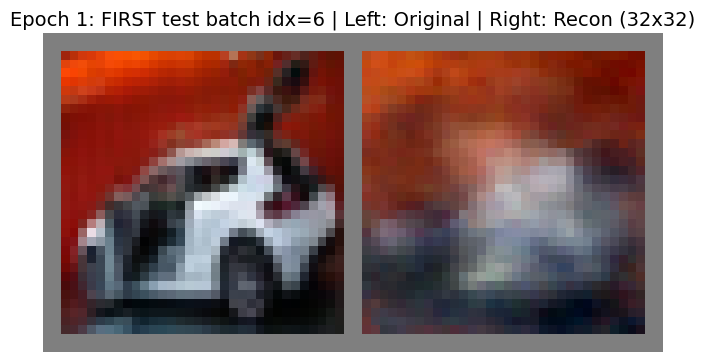

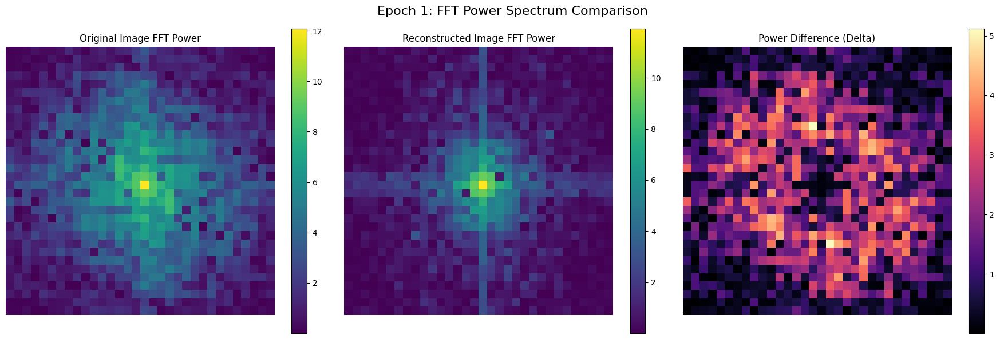

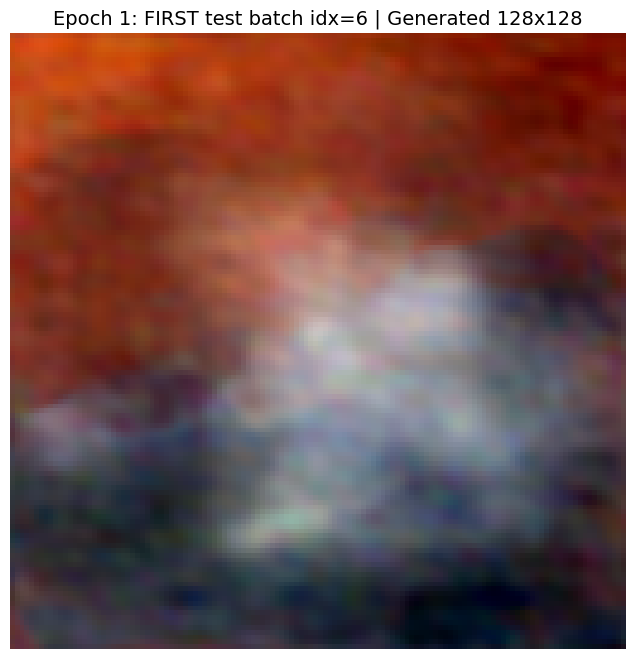

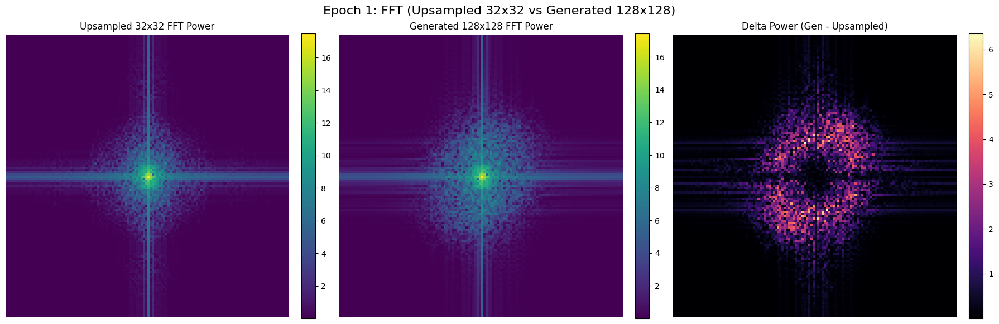

Epoch [2/50], Step [200/782], LR: 0.000200, Loss: 0.0481
Epoch [2/50], Step [400/782], LR: 0.000200, Loss: 0.0417
Epoch [2/50], Step [600/782], LR: 0.000199, Loss: 0.0375
--- Epoch [2/50] Summary ---
  Avg Training Loss (target 20%): 0.0446
  Val Loss (target 20%, FIRST test batch idx=6): 0.0750
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0589



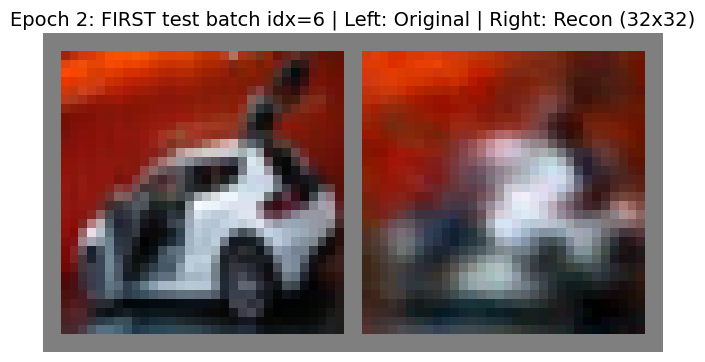

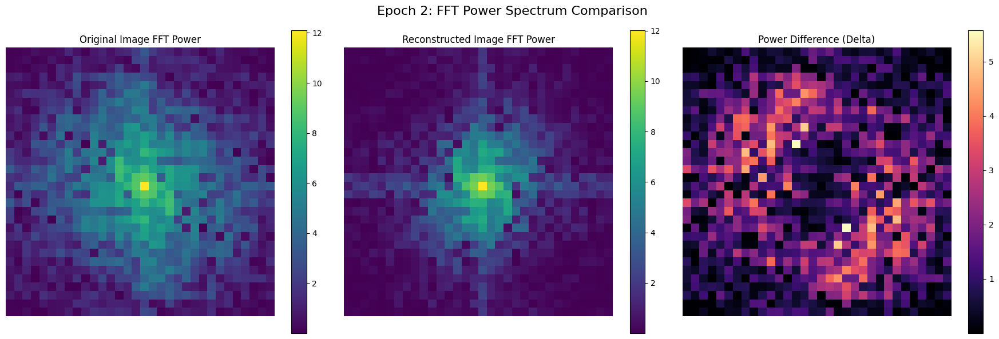

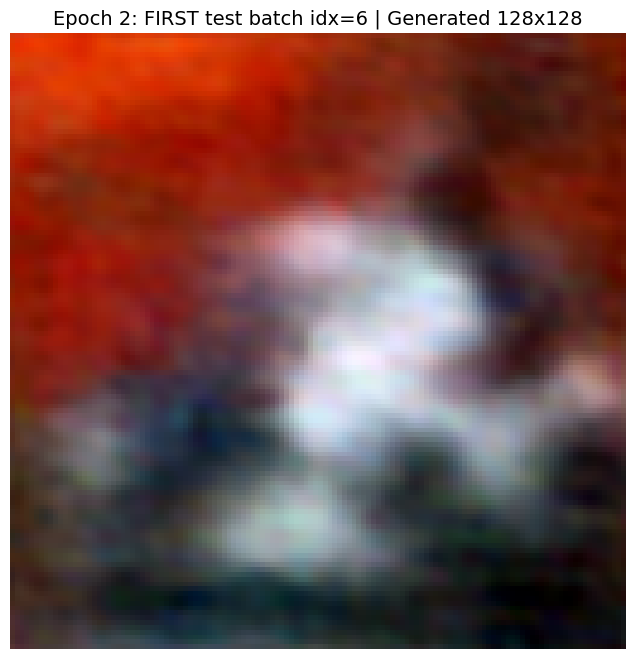

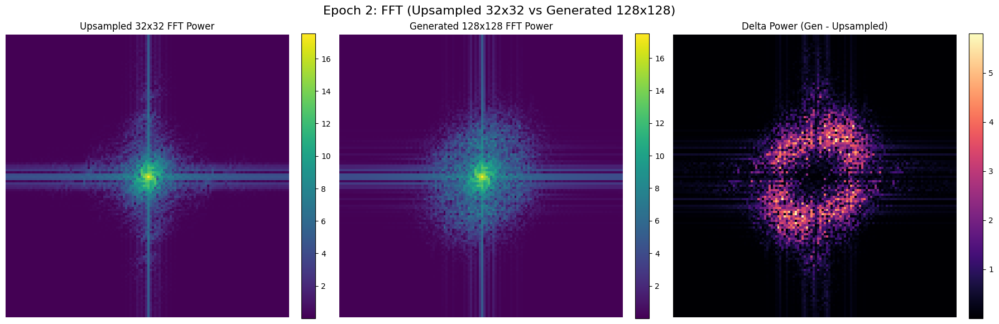

Epoch [3/50], Step [200/782], LR: 0.000199, Loss: 0.0414
Epoch [3/50], Step [400/782], LR: 0.000199, Loss: 0.0365
Epoch [3/50], Step [600/782], LR: 0.000198, Loss: 0.0357
--- Epoch [3/50] Summary ---
  Avg Training Loss (target 20%): 0.0367
  Val Loss (target 20%, FIRST test batch idx=6): 0.0730
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0543



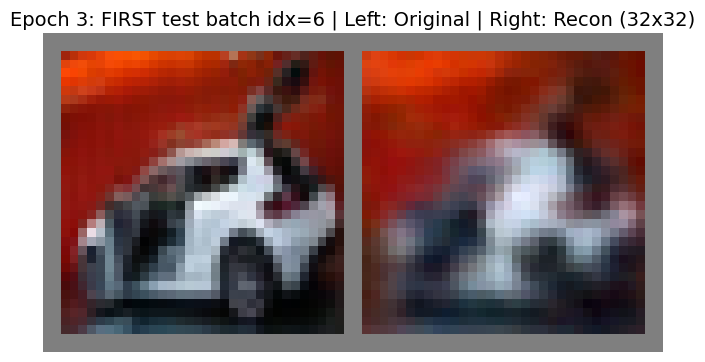

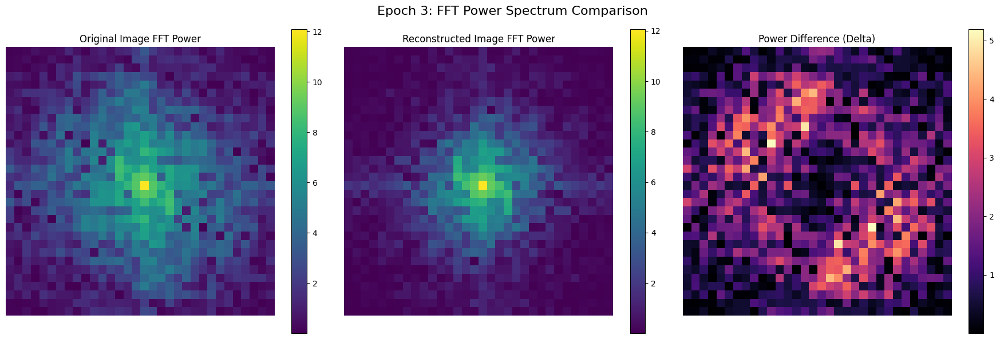

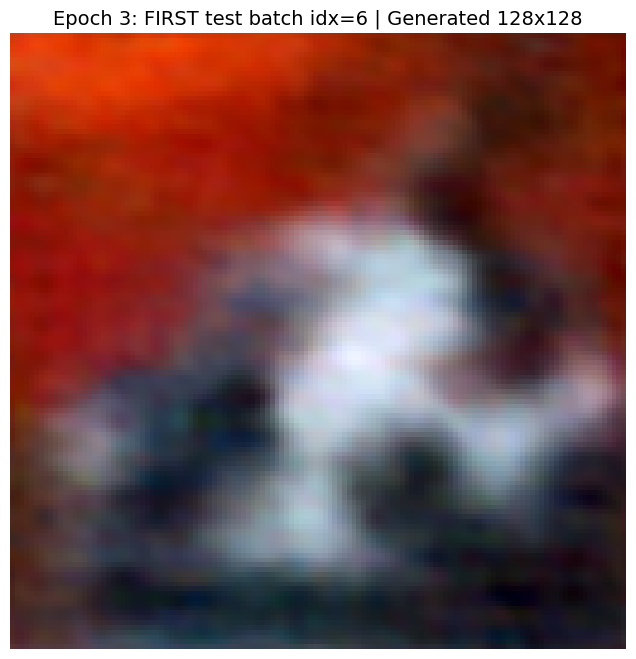

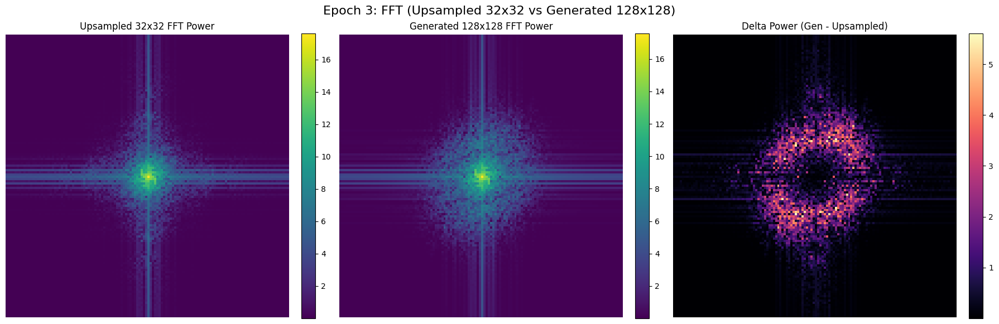

Epoch [4/50], Step [200/782], LR: 0.000198, Loss: 0.0314
Epoch [4/50], Step [400/782], LR: 0.000198, Loss: 0.0286
Epoch [4/50], Step [600/782], LR: 0.000197, Loss: 0.0272
--- Epoch [4/50] Summary ---
  Avg Training Loss (target 20%): 0.0346
  Val Loss (target 20%, FIRST test batch idx=6): 0.0806
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0589



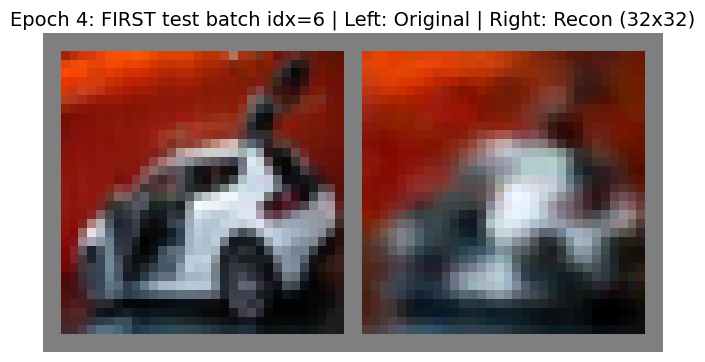

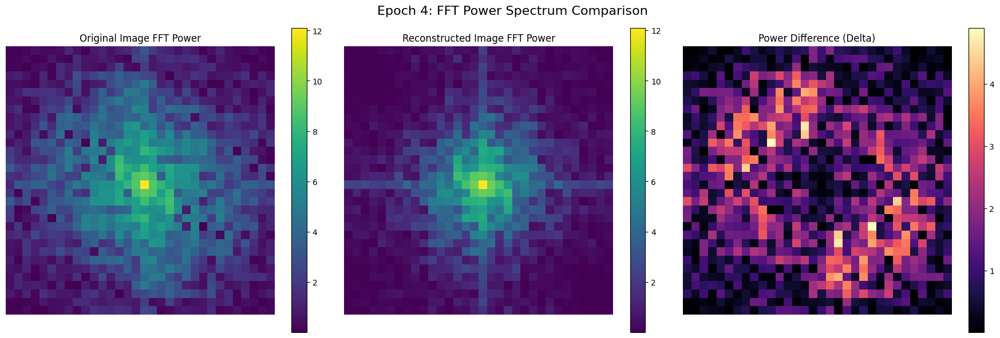

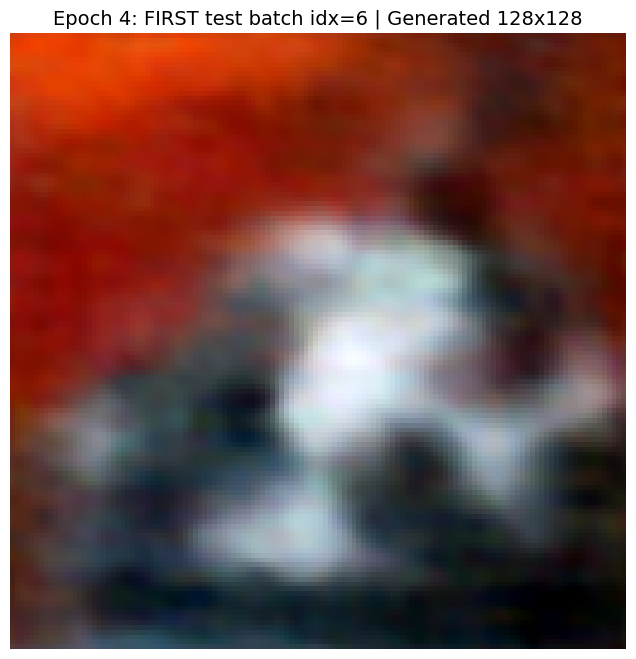

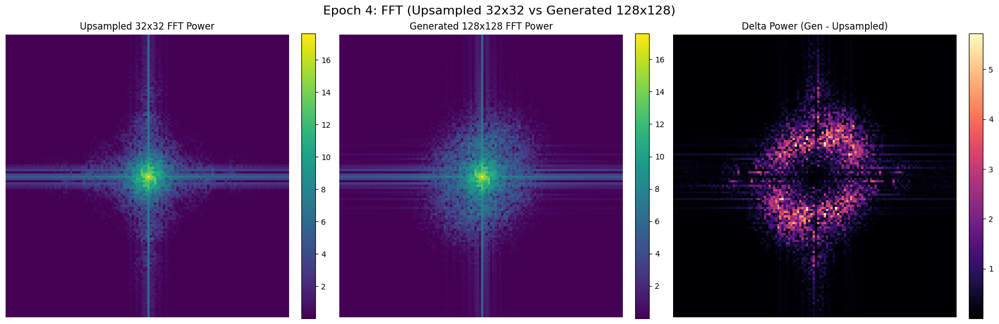

Epoch [5/50], Step [200/782], LR: 0.000196, Loss: 0.0353
Epoch [5/50], Step [400/782], LR: 0.000196, Loss: 0.0365
Epoch [5/50], Step [600/782], LR: 0.000196, Loss: 0.0356
--- Epoch [5/50] Summary ---
  Avg Training Loss (target 20%): 0.0333
  Val Loss (target 20%, FIRST test batch idx=6): 0.0719
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0537



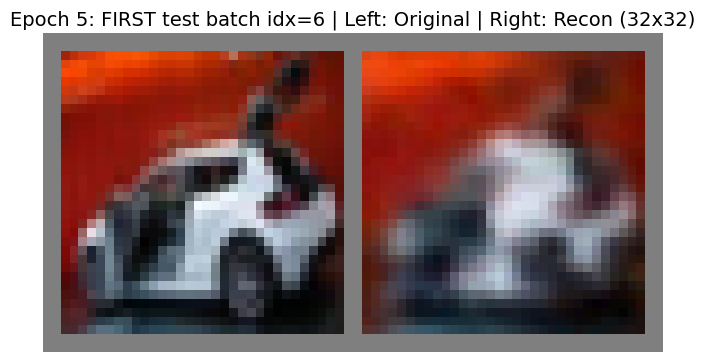

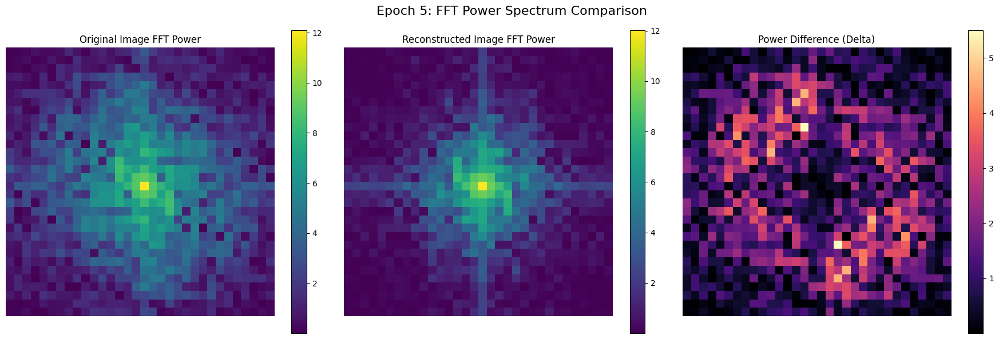

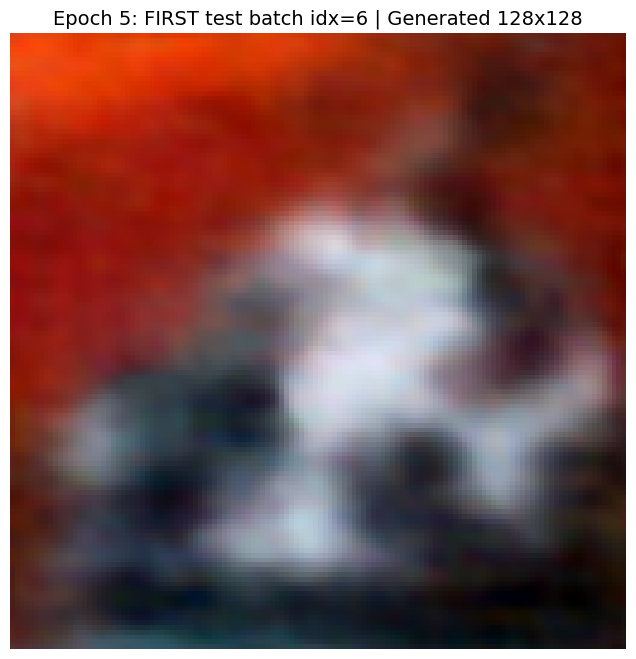

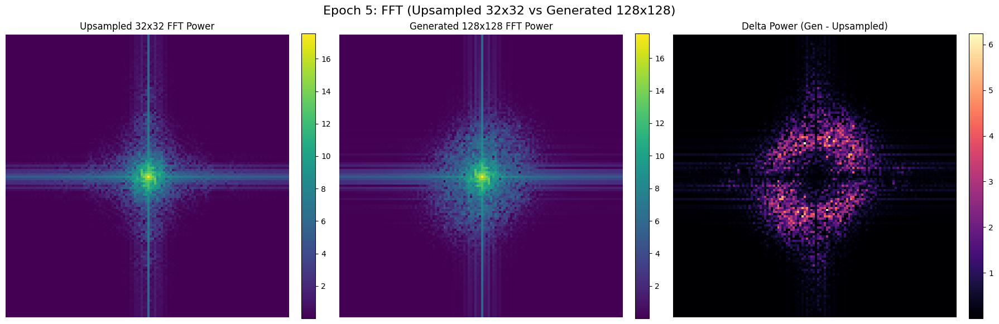

Epoch [6/50], Step [200/782], LR: 0.000195, Loss: 0.0329
Epoch [6/50], Step [400/782], LR: 0.000194, Loss: 0.0344
Epoch [6/50], Step [600/782], LR: 0.000194, Loss: 0.0311
--- Epoch [6/50] Summary ---
  Avg Training Loss (target 20%): 0.0321
  Val Loss (target 20%, FIRST test batch idx=6): 0.0655
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0503



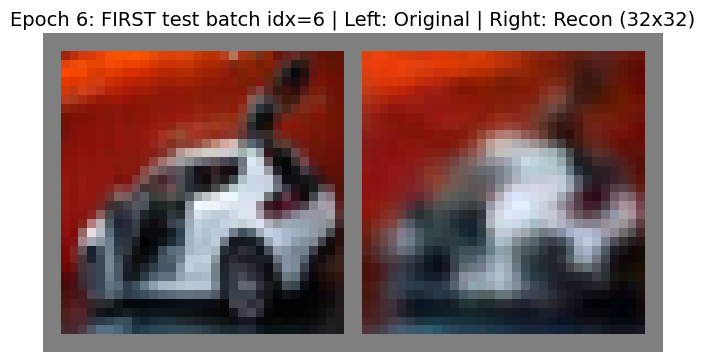

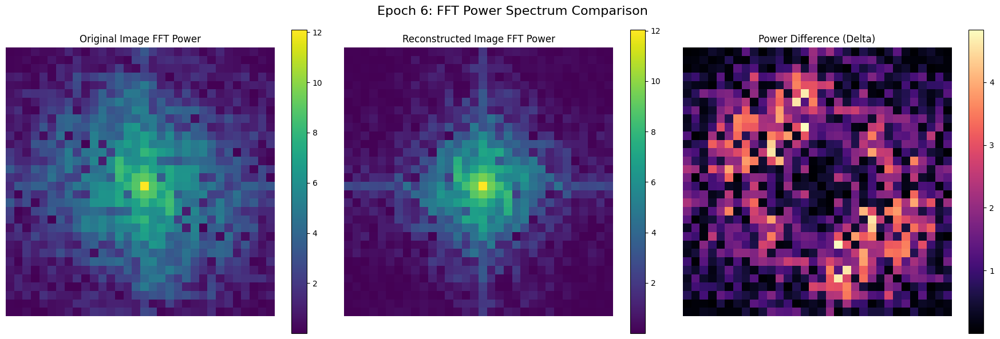

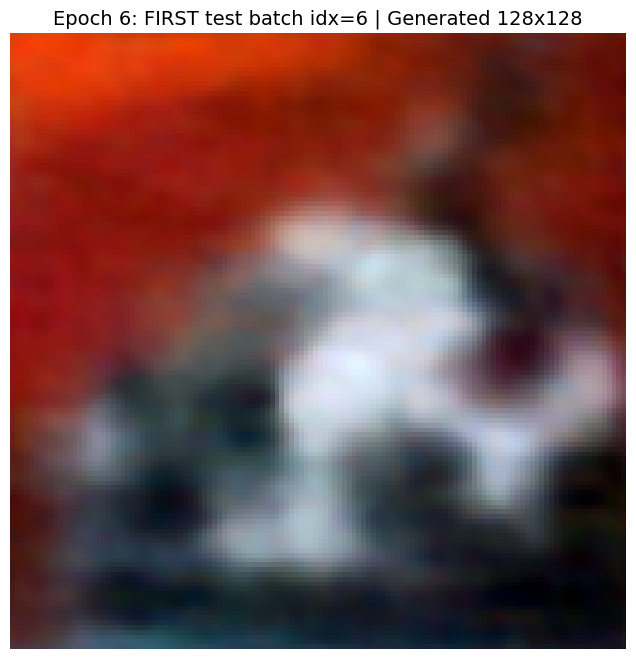

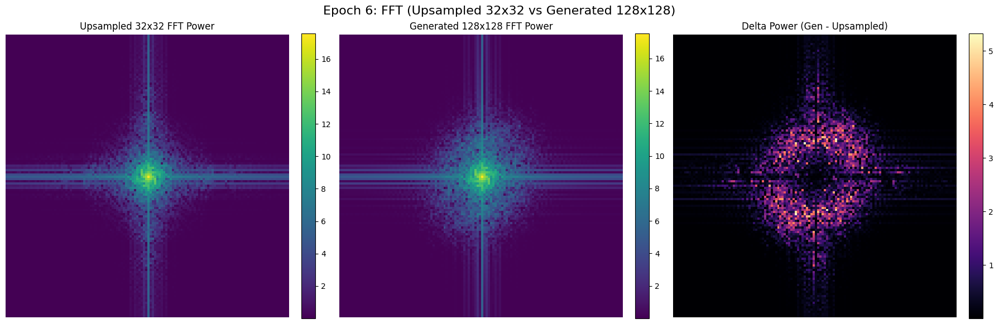

Epoch [7/50], Step [200/782], LR: 0.000192, Loss: 0.0283
Epoch [7/50], Step [400/782], LR: 0.000192, Loss: 0.0330
Epoch [7/50], Step [600/782], LR: 0.000191, Loss: 0.0316
--- Epoch [7/50] Summary ---
  Avg Training Loss (target 20%): 0.0310
  Val Loss (target 20%, FIRST test batch idx=6): 0.0761
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0540



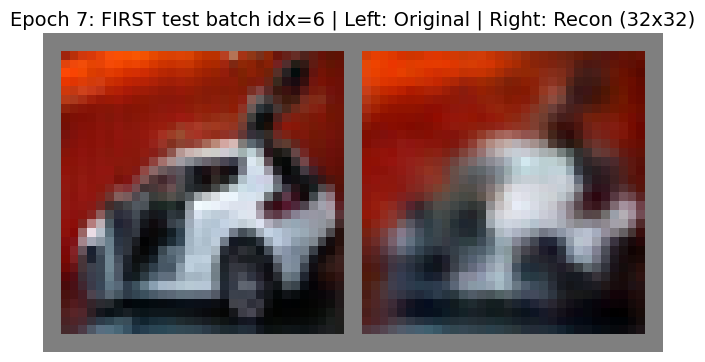

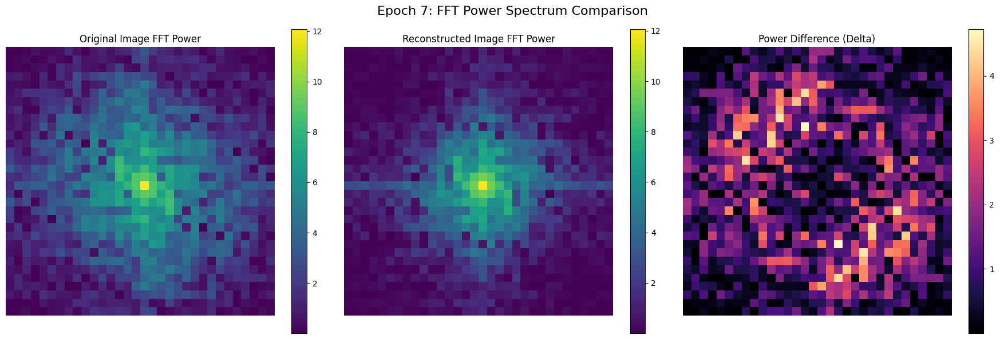

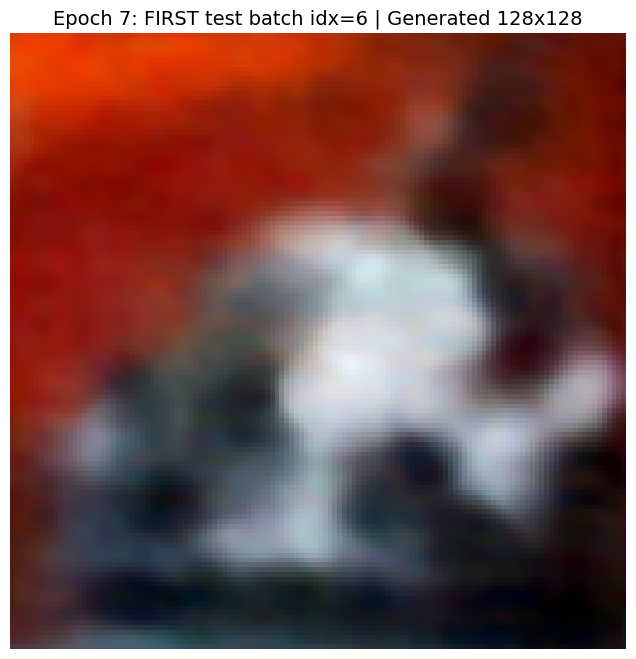

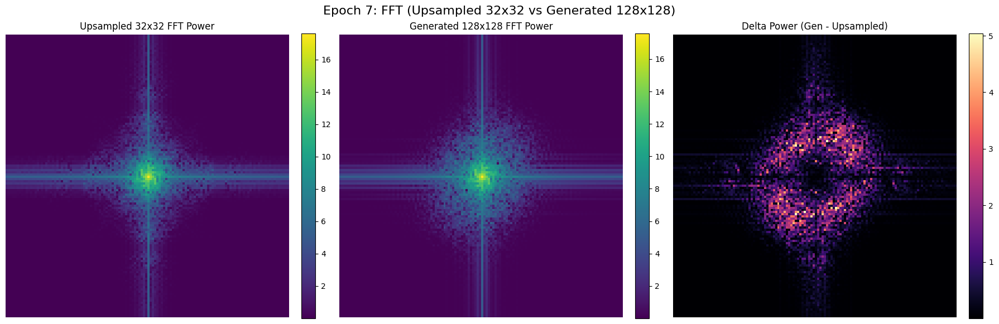

Epoch [8/50], Step [200/782], LR: 0.000190, Loss: 0.0339
Epoch [8/50], Step [400/782], LR: 0.000189, Loss: 0.0295
Epoch [8/50], Step [600/782], LR: 0.000188, Loss: 0.0324
--- Epoch [8/50] Summary ---
  Avg Training Loss (target 20%): 0.0298
  Val Loss (target 20%, FIRST test batch idx=6): 0.0711
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0523



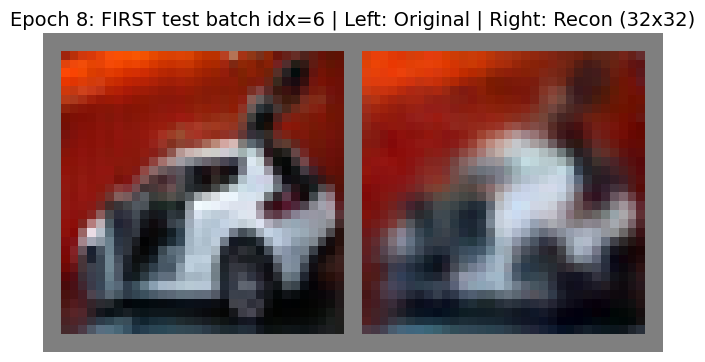

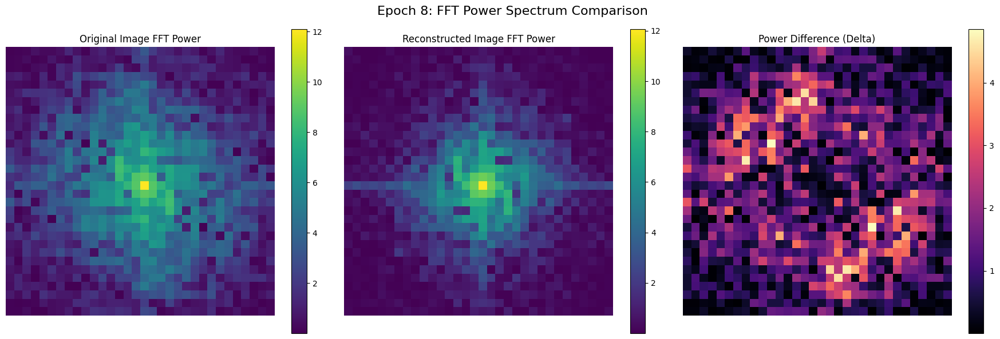

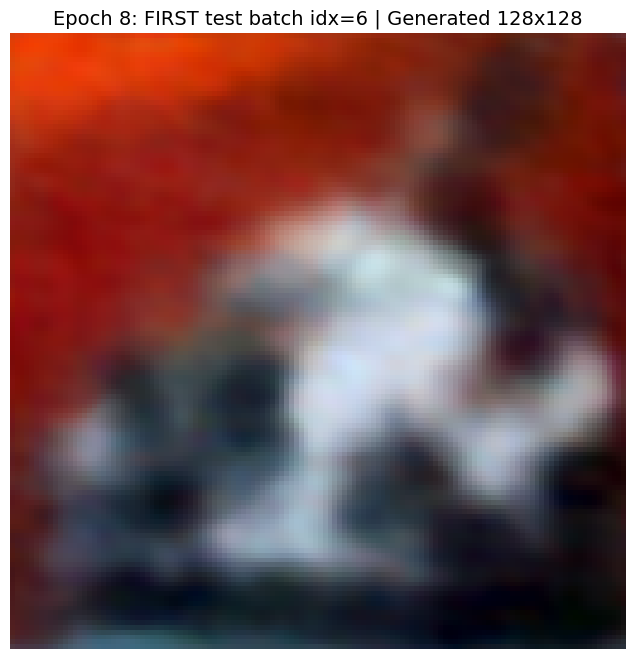

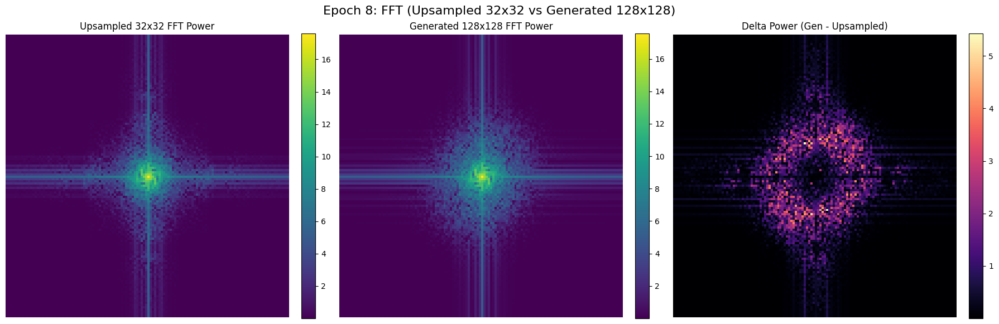

Epoch [9/50], Step [200/782], LR: 0.000187, Loss: 0.0286
Epoch [9/50], Step [400/782], LR: 0.000186, Loss: 0.0317
Epoch [9/50], Step [600/782], LR: 0.000185, Loss: 0.0303
--- Epoch [9/50] Summary ---
  Avg Training Loss (target 20%): 0.0284
  Val Loss (target 20%, FIRST test batch idx=6): 0.0565
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0456



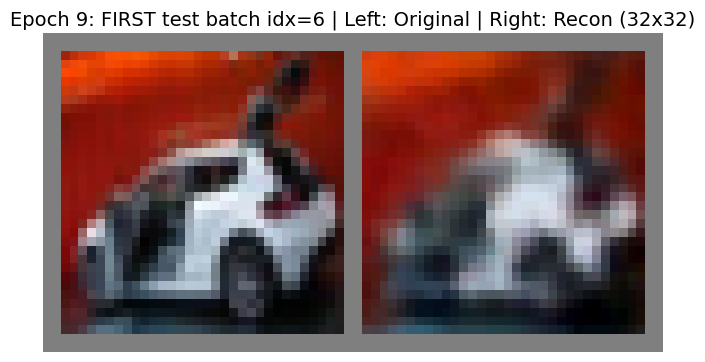

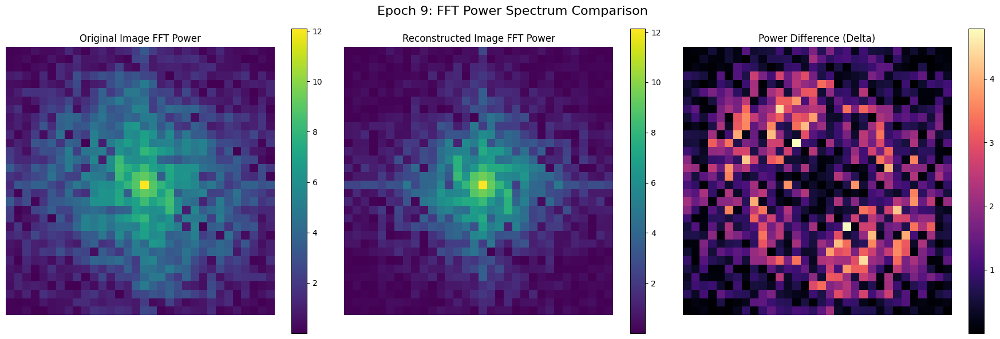

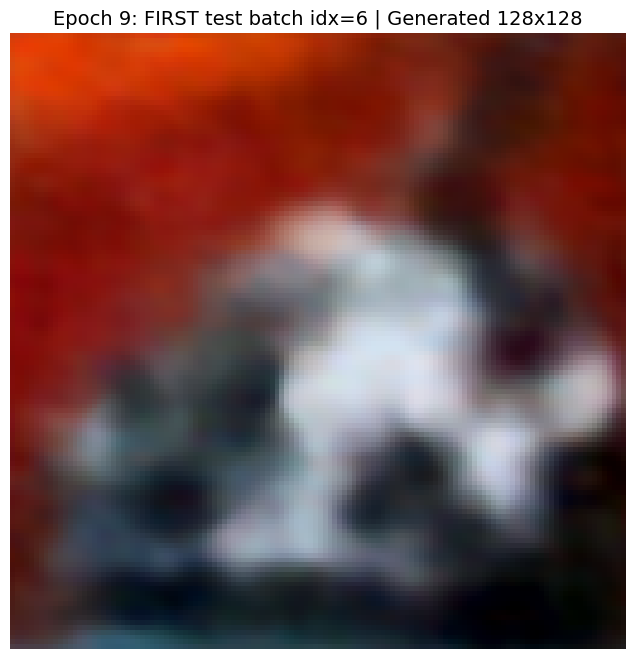

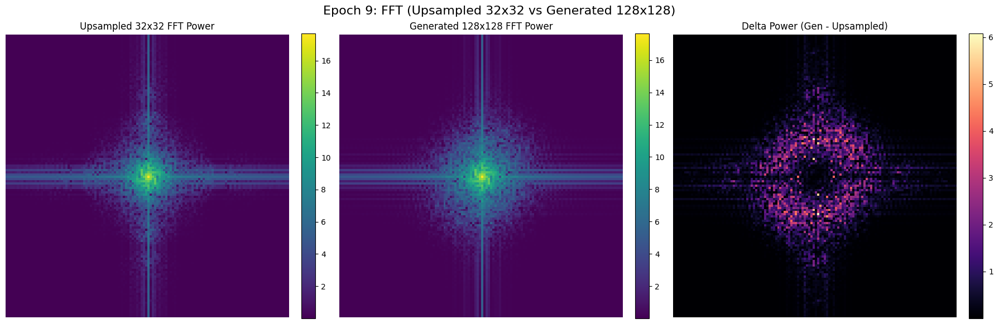

Epoch [10/50], Step [200/782], LR: 0.000184, Loss: 0.0278
Epoch [10/50], Step [400/782], LR: 0.000183, Loss: 0.0252
Epoch [10/50], Step [600/782], LR: 0.000182, Loss: 0.0266
--- Epoch [10/50] Summary ---
  Avg Training Loss (target 20%): 0.0266
  Val Loss (target 20%, FIRST test batch idx=6): 0.0728
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0536



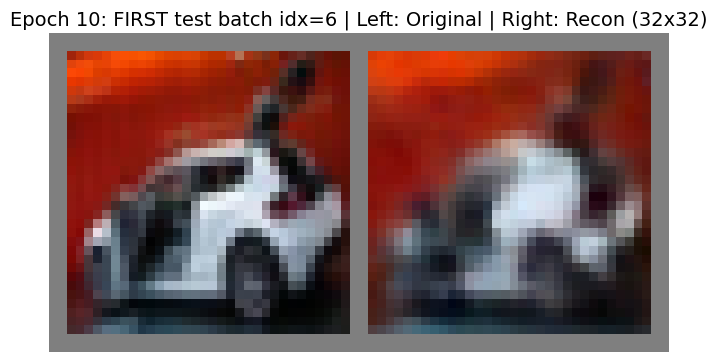

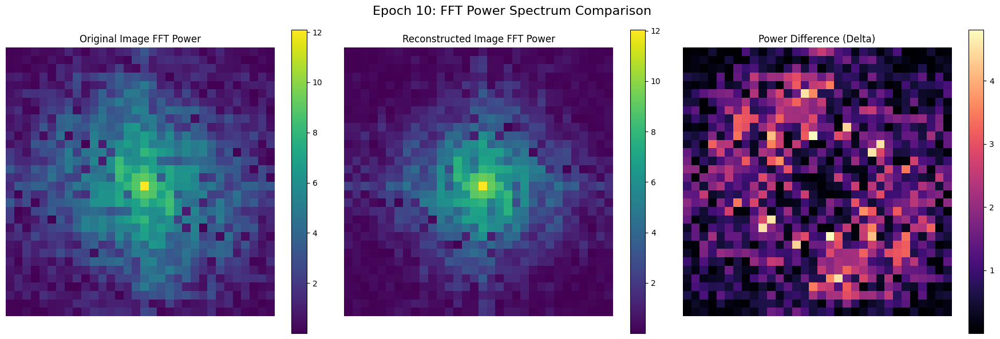

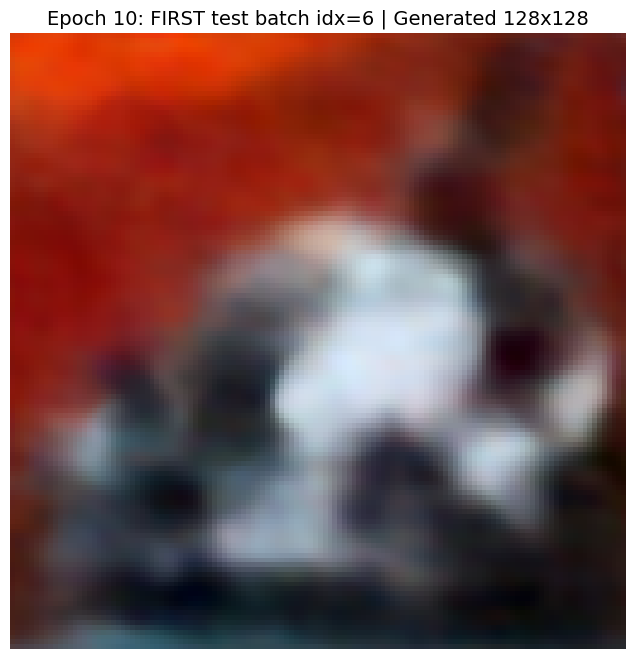

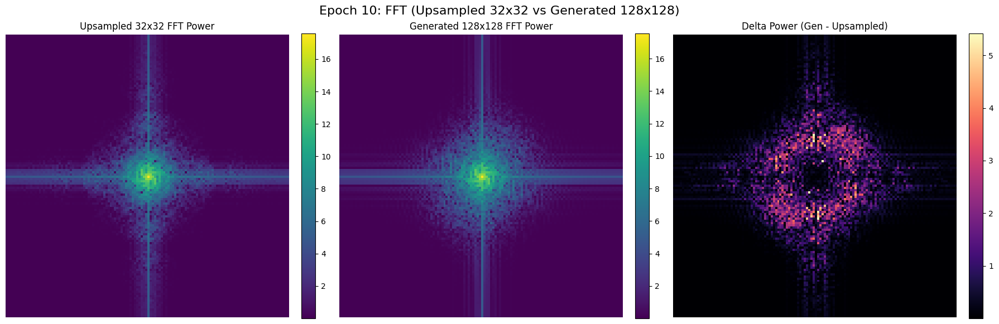

Epoch [11/50], Step [200/782], LR: 0.000180, Loss: 0.0229
Epoch [11/50], Step [400/782], LR: 0.000179, Loss: 0.0258
Epoch [11/50], Step [600/782], LR: 0.000178, Loss: 0.0215
--- Epoch [11/50] Summary ---
  Avg Training Loss (target 20%): 0.0245
  Val Loss (target 20%, FIRST test batch idx=6): 0.0790
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0549



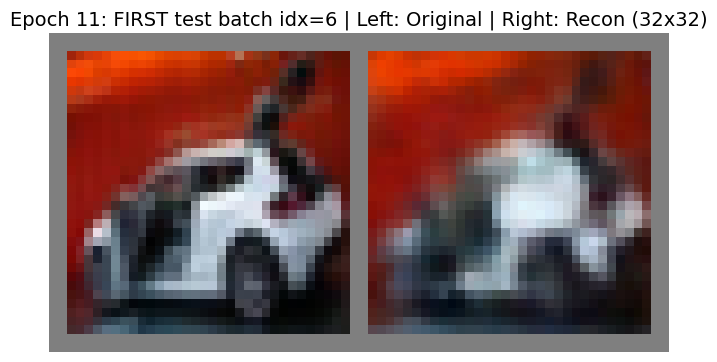

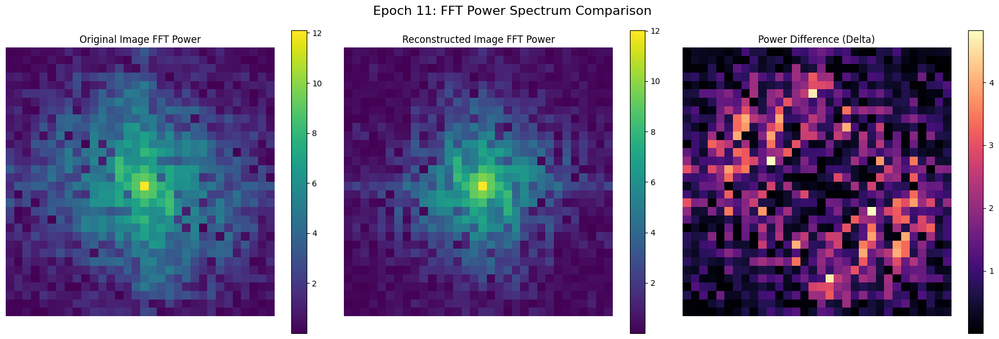

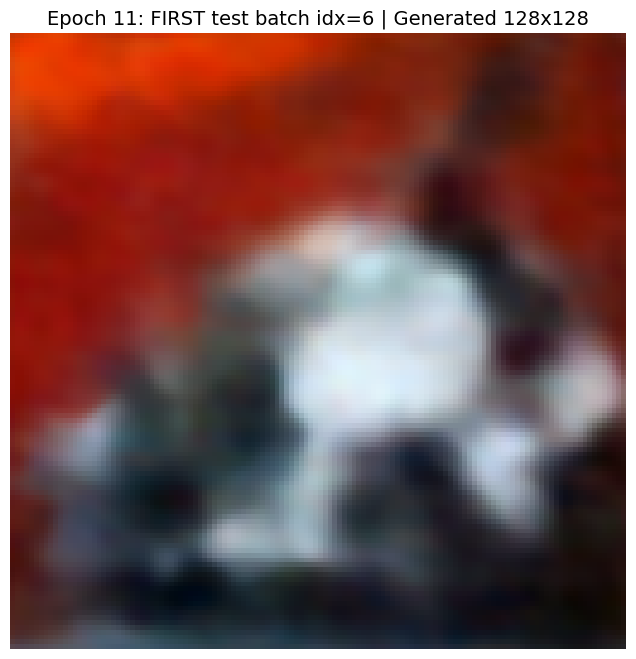

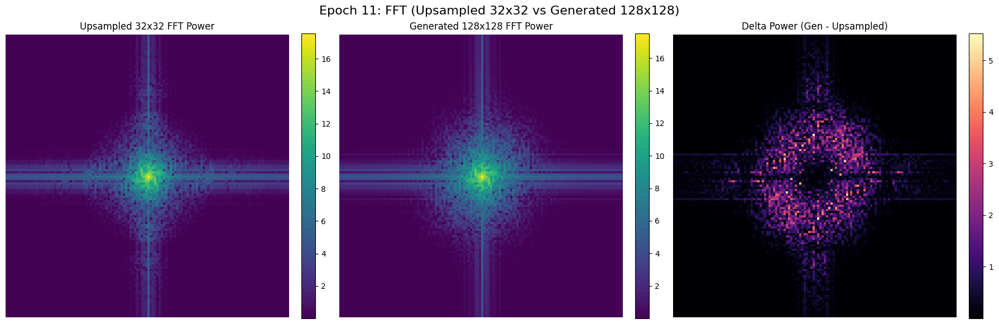

Epoch [12/50], Step [200/782], LR: 0.000176, Loss: 0.0232
Epoch [12/50], Step [400/782], LR: 0.000175, Loss: 0.0219
Epoch [12/50], Step [600/782], LR: 0.000174, Loss: 0.0240
--- Epoch [12/50] Summary ---
  Avg Training Loss (target 20%): 0.0222
  Val Loss (target 20%, FIRST test batch idx=6): 0.0609
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0495



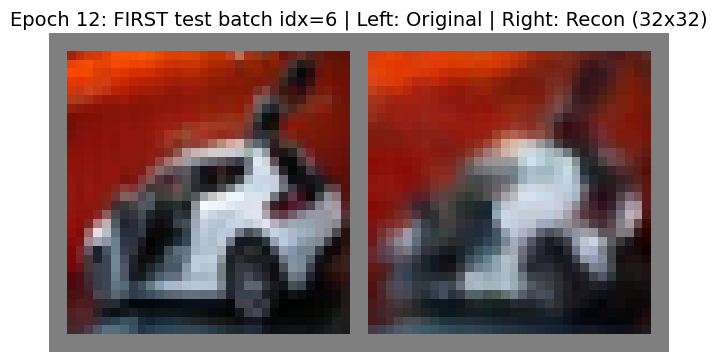

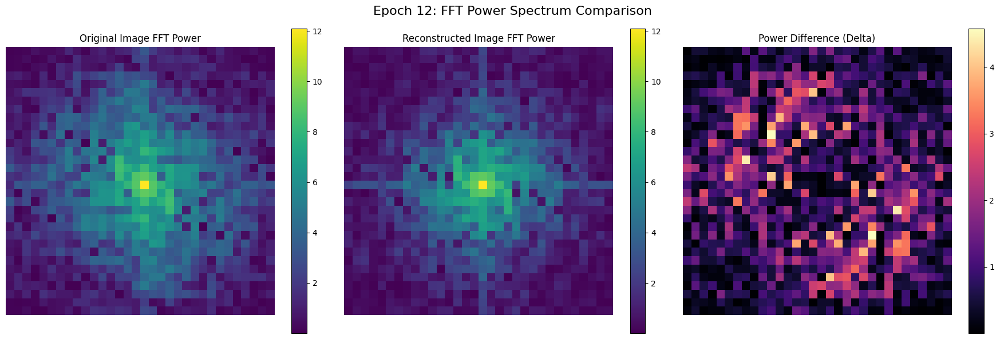

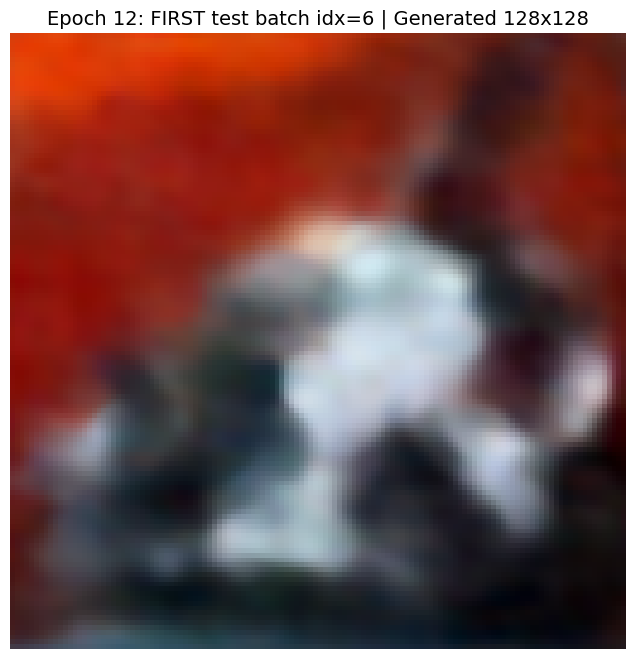

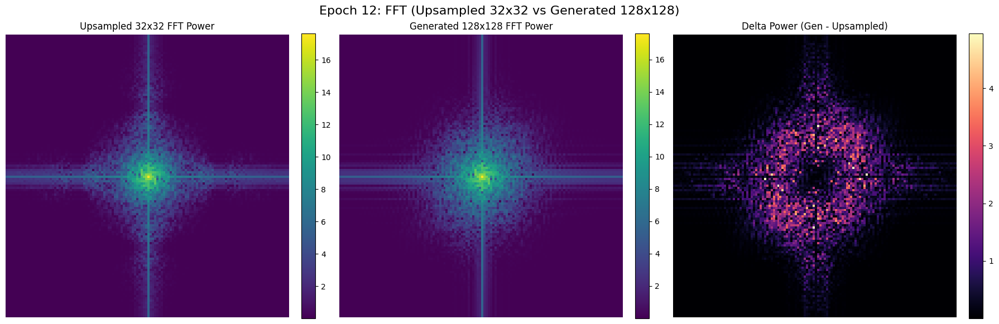

Epoch [13/50], Step [200/782], LR: 0.000172, Loss: 0.0185
Epoch [13/50], Step [400/782], LR: 0.000171, Loss: 0.0167
Epoch [13/50], Step [600/782], LR: 0.000170, Loss: 0.0201
--- Epoch [13/50] Summary ---
  Avg Training Loss (target 20%): 0.0200
  Val Loss (target 20%, FIRST test batch idx=6): 0.0700
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0529



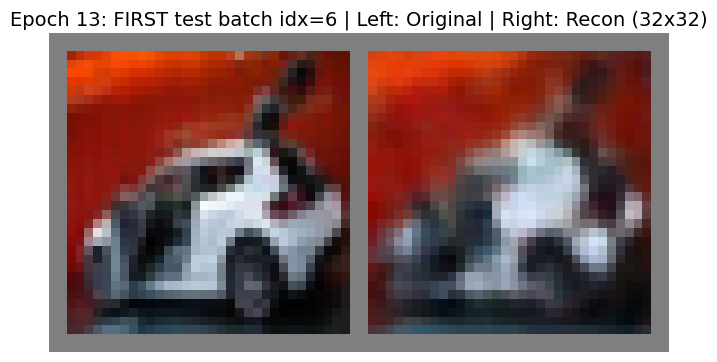

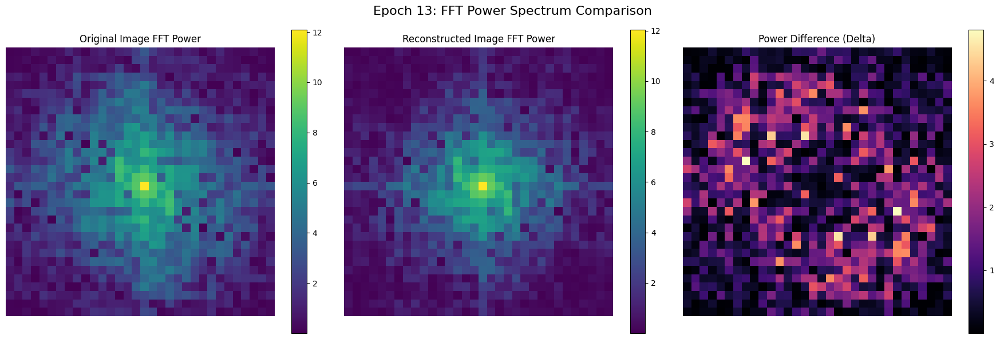

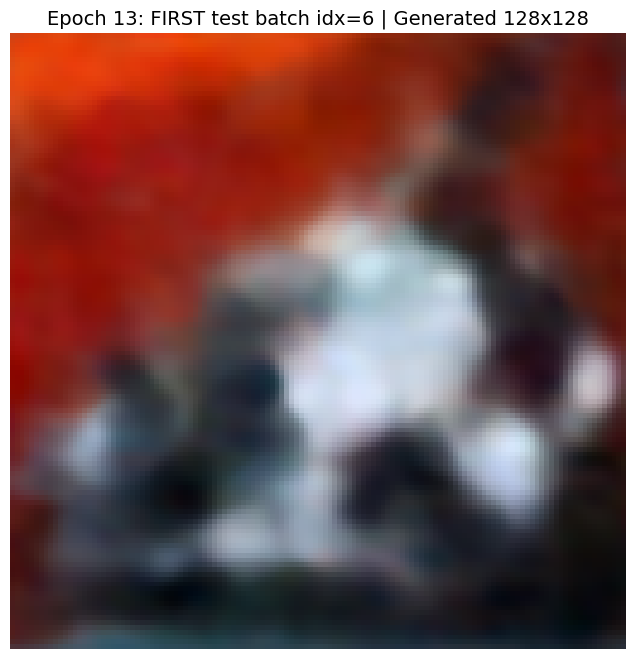

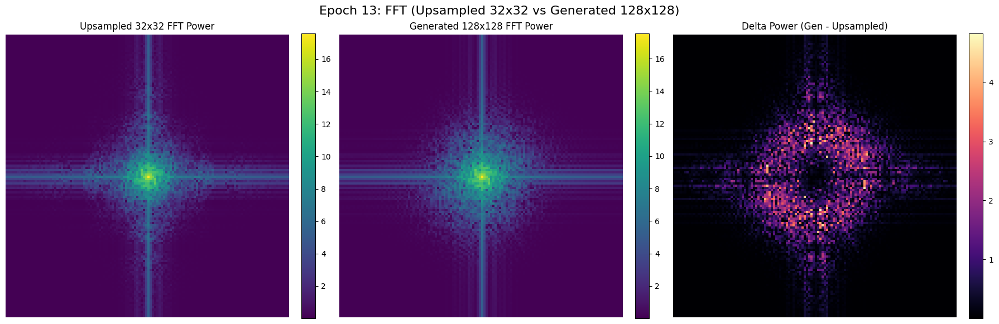

Epoch [14/50], Step [200/782], LR: 0.000167, Loss: 0.0196
Epoch [14/50], Step [400/782], LR: 0.000166, Loss: 0.0195
Epoch [14/50], Step [600/782], LR: 0.000165, Loss: 0.0189
--- Epoch [14/50] Summary ---
  Avg Training Loss (target 20%): 0.0180
  Val Loss (target 20%, FIRST test batch idx=6): 0.0761
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0549



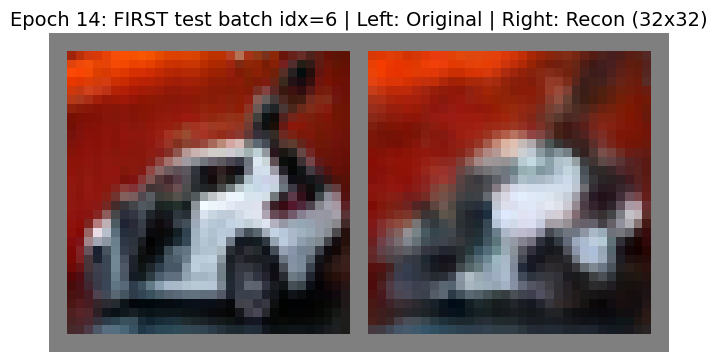

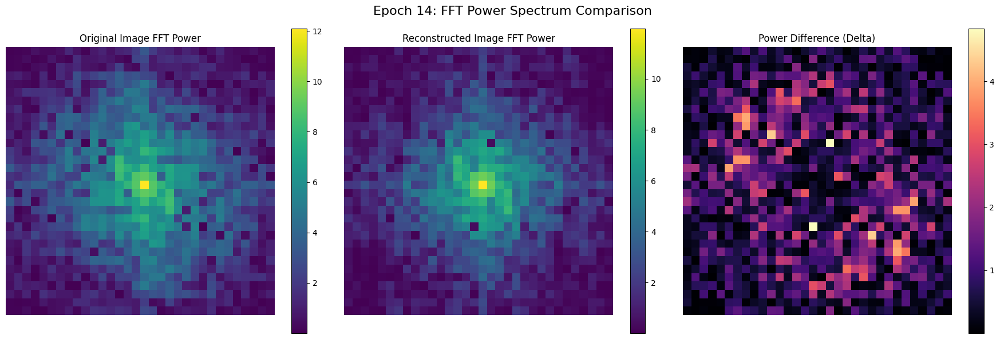

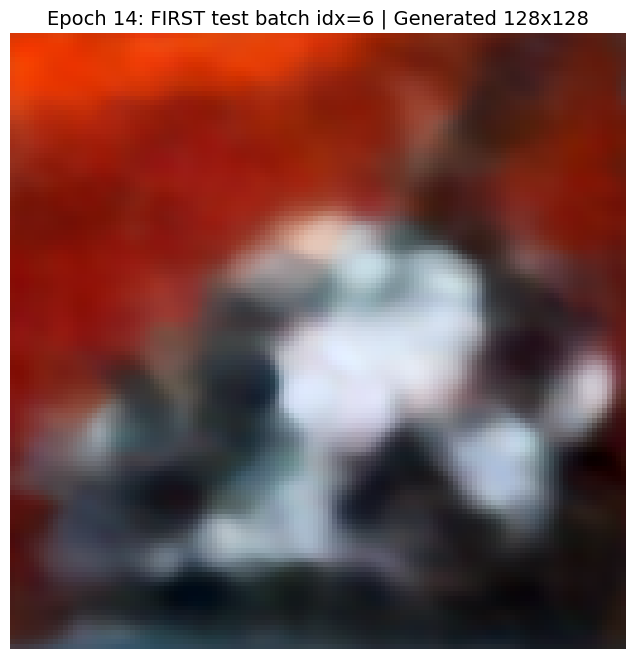

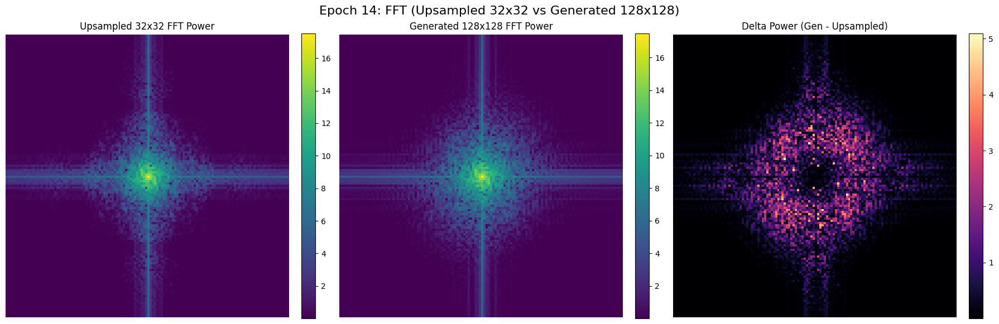

Epoch [15/50], Step [200/782], LR: 0.000162, Loss: 0.0158
Epoch [15/50], Step [400/782], LR: 0.000161, Loss: 0.0170
Epoch [15/50], Step [600/782], LR: 0.000160, Loss: 0.0159
--- Epoch [15/50] Summary ---
  Avg Training Loss (target 20%): 0.0162
  Val Loss (target 20%, FIRST test batch idx=6): 0.0674
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0536



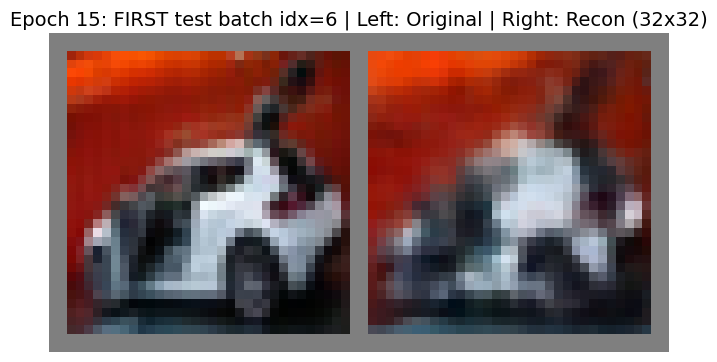

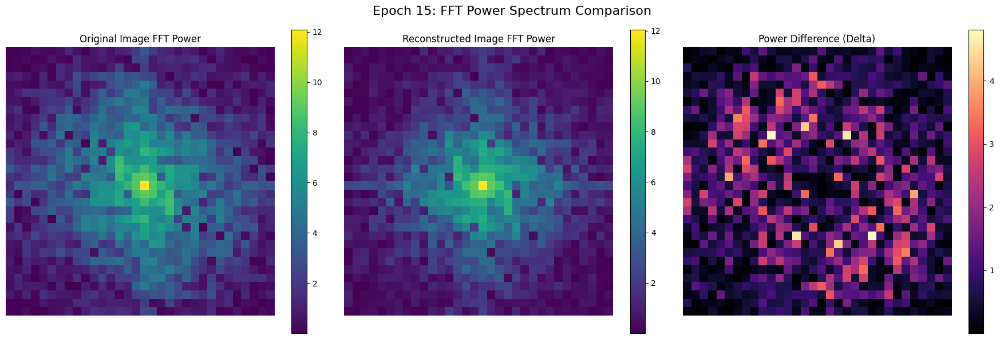

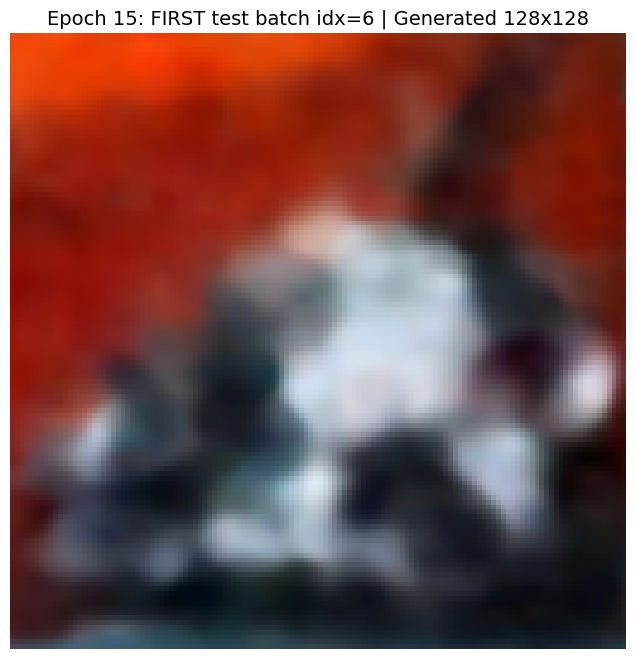

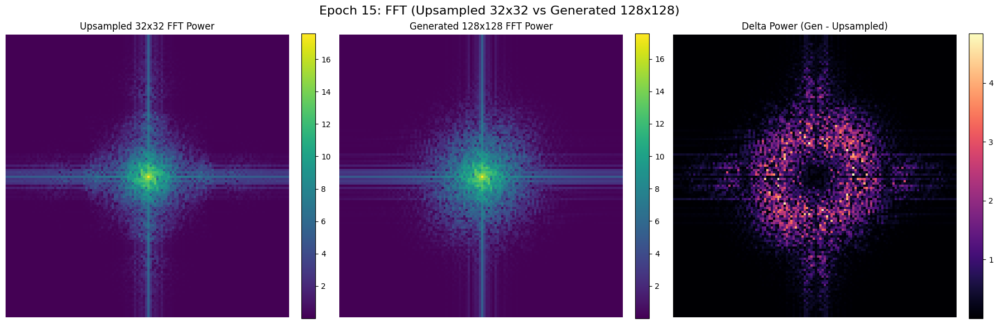

Epoch [16/50], Step [200/782], LR: 0.000157, Loss: 0.0146
Epoch [16/50], Step [400/782], LR: 0.000156, Loss: 0.0152
Epoch [16/50], Step [600/782], LR: 0.000155, Loss: 0.0152
--- Epoch [16/50] Summary ---
  Avg Training Loss (target 20%): 0.0145
  Val Loss (target 20%, FIRST test batch idx=6): 0.0667
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0495



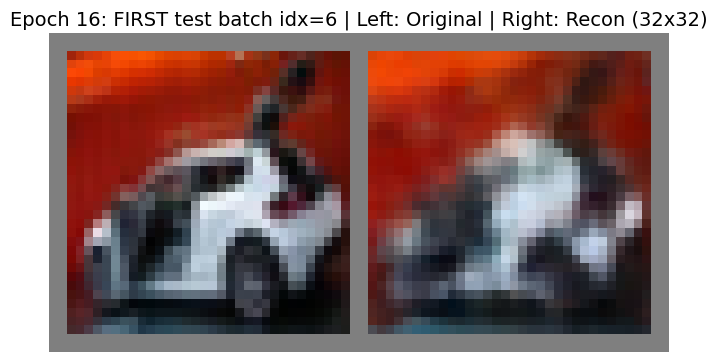

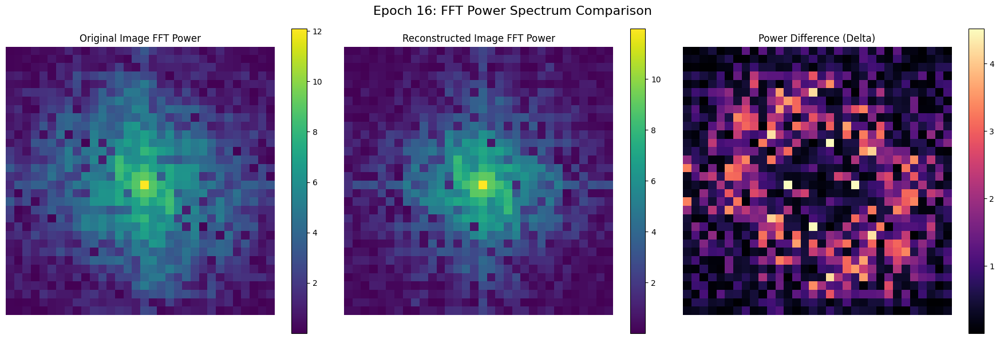

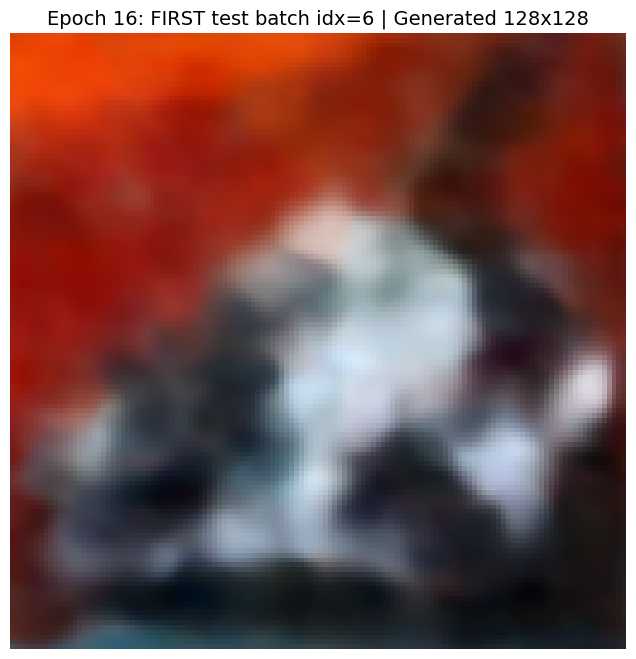

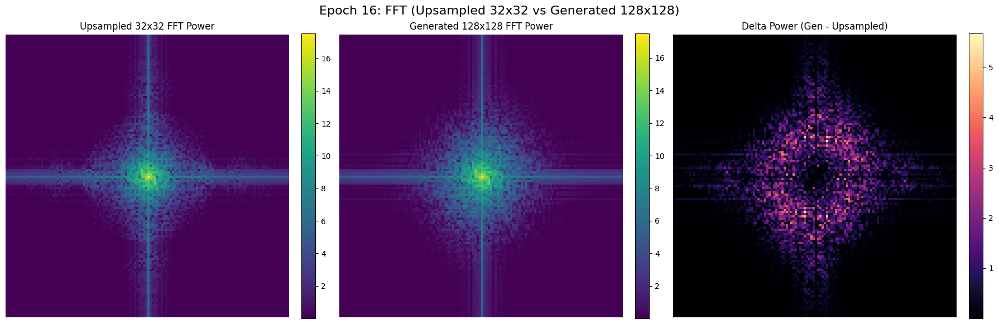

Epoch [17/50], Step [200/782], LR: 0.000152, Loss: 0.0139
Epoch [17/50], Step [400/782], LR: 0.000151, Loss: 0.0136
Epoch [17/50], Step [600/782], LR: 0.000149, Loss: 0.0128
--- Epoch [17/50] Summary ---
  Avg Training Loss (target 20%): 0.0132
  Val Loss (target 20%, FIRST test batch idx=6): 0.0670
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0504



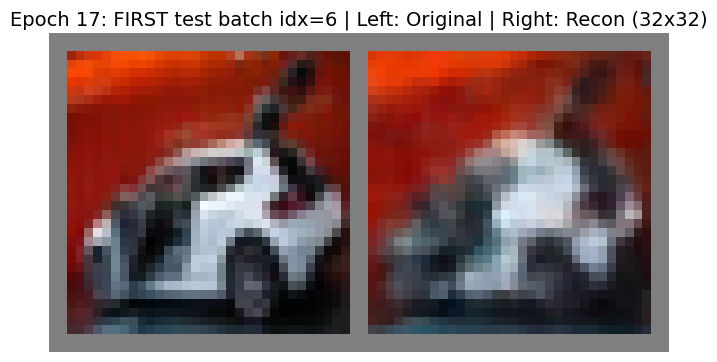

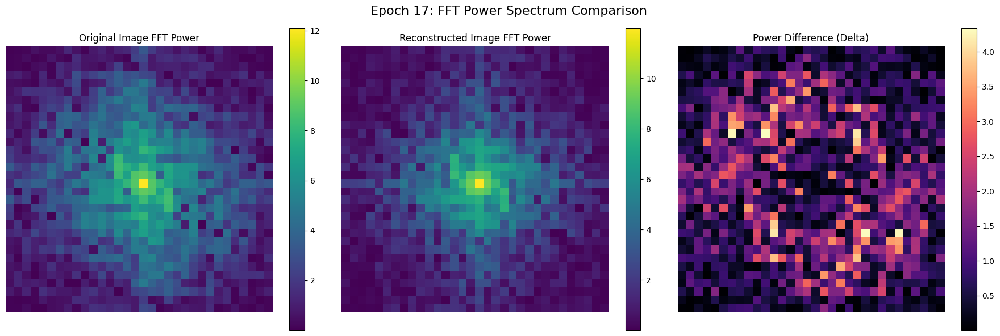

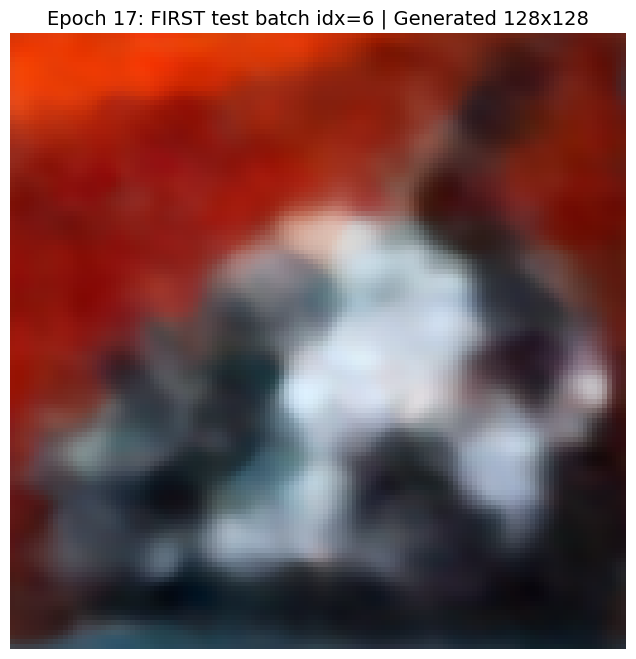

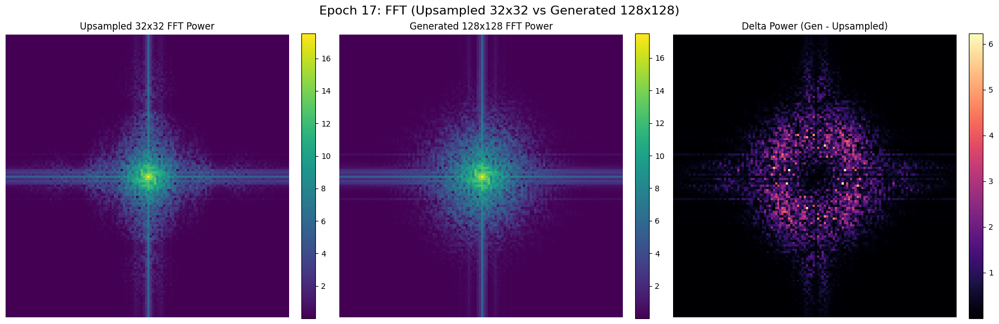

Epoch [18/50], Step [200/782], LR: 0.000147, Loss: 0.0121
Epoch [18/50], Step [400/782], LR: 0.000145, Loss: 0.0115
Epoch [18/50], Step [600/782], LR: 0.000144, Loss: 0.0122
--- Epoch [18/50] Summary ---
  Avg Training Loss (target 20%): 0.0119
  Val Loss (target 20%, FIRST test batch idx=6): 0.0678
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0518



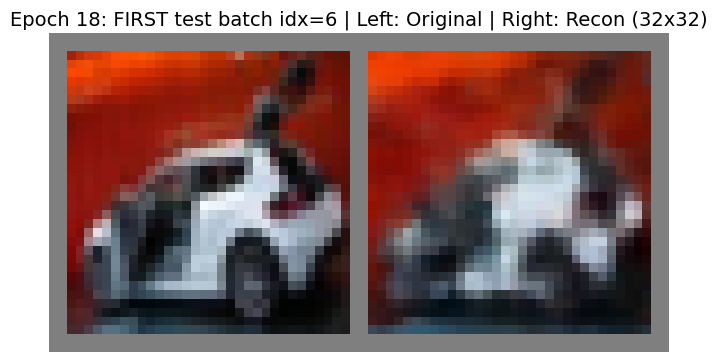

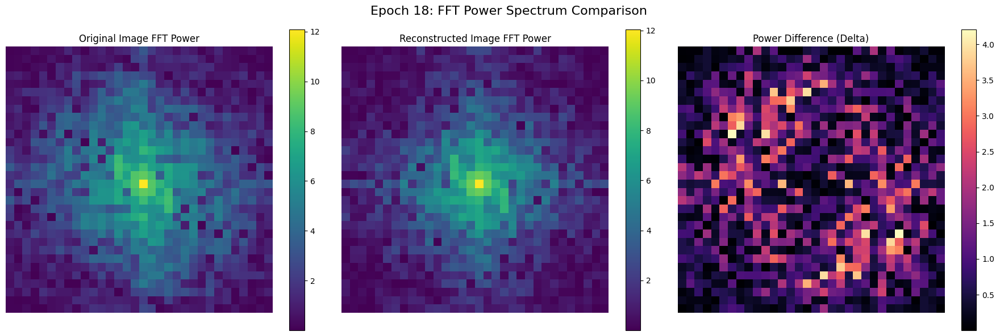

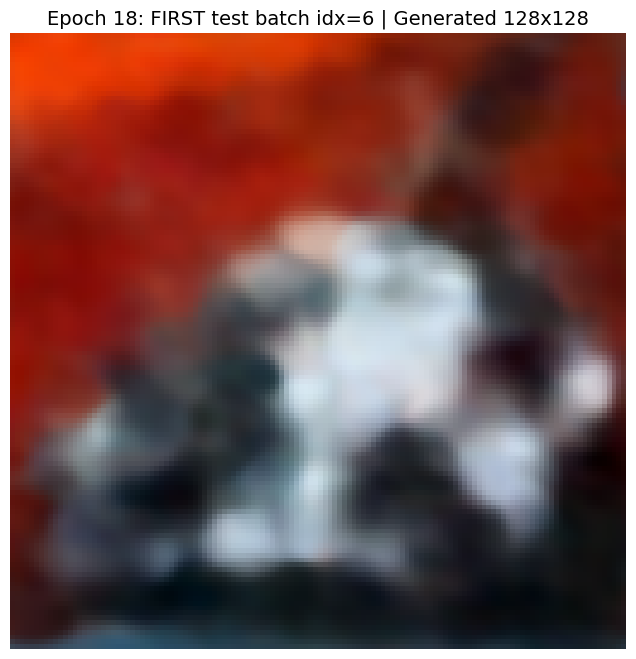

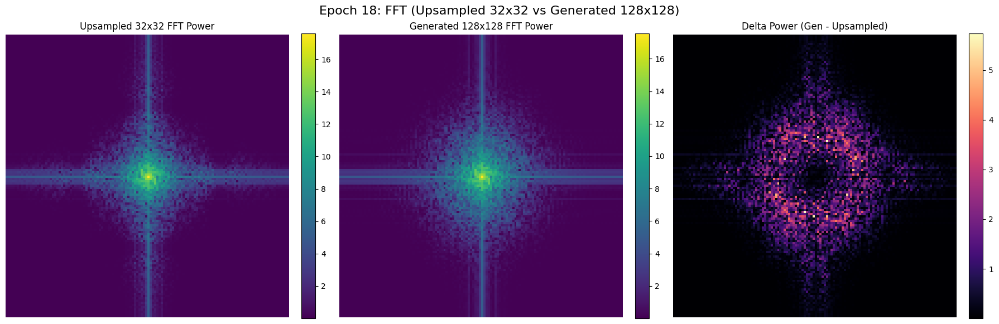

Epoch [19/50], Step [200/782], LR: 0.000141, Loss: 0.0108
Epoch [19/50], Step [400/782], LR: 0.000140, Loss: 0.0107
Epoch [19/50], Step [600/782], LR: 0.000138, Loss: 0.0106
--- Epoch [19/50] Summary ---
  Avg Training Loss (target 20%): 0.0109
  Val Loss (target 20%, FIRST test batch idx=6): 0.0622
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0506



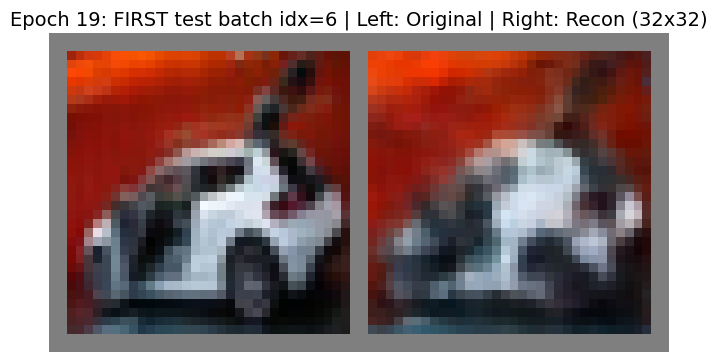

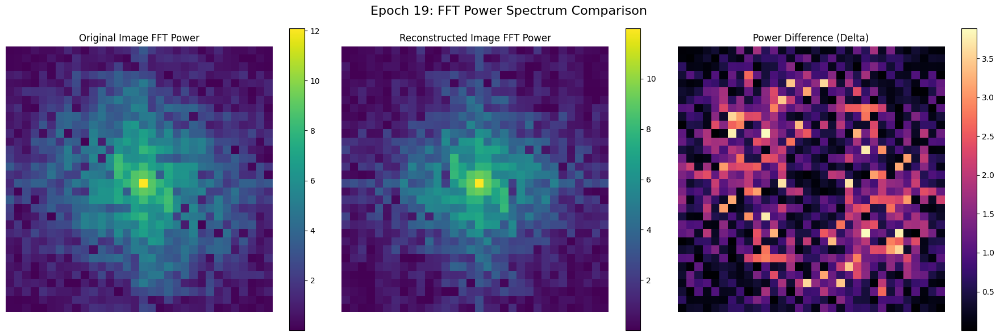

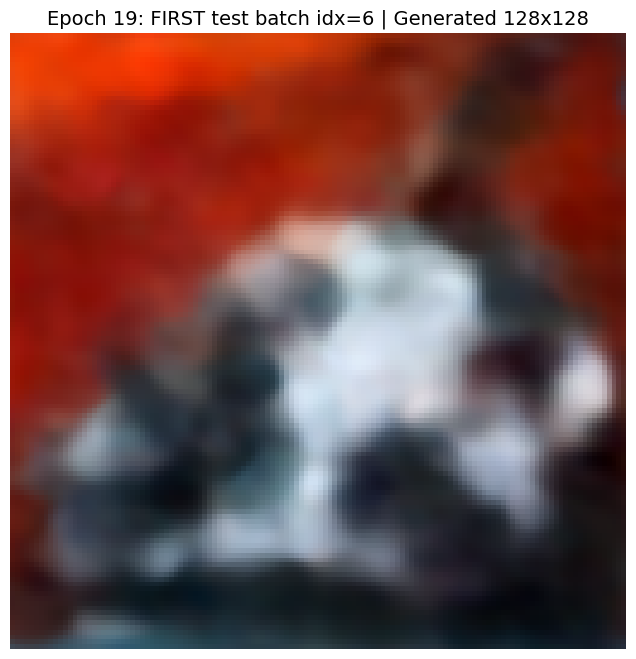

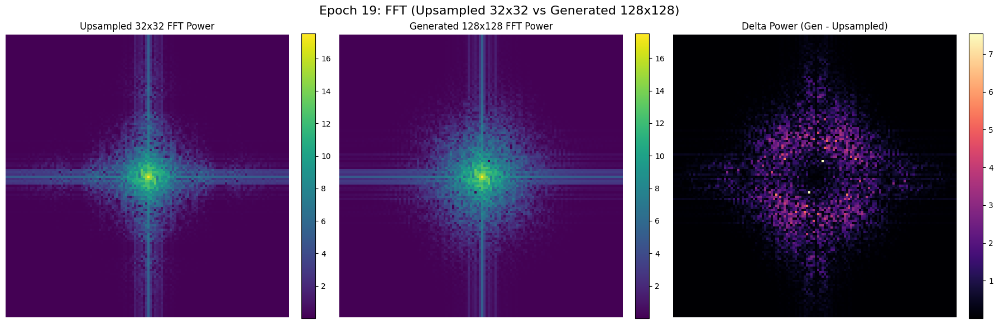

Epoch [20/50], Step [200/782], LR: 0.000135, Loss: 0.0098
Epoch [20/50], Step [400/782], LR: 0.000134, Loss: 0.0100
Epoch [20/50], Step [600/782], LR: 0.000132, Loss: 0.0107
--- Epoch [20/50] Summary ---
  Avg Training Loss (target 20%): 0.0099
  Val Loss (target 20%, FIRST test batch idx=6): 0.0656
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0548



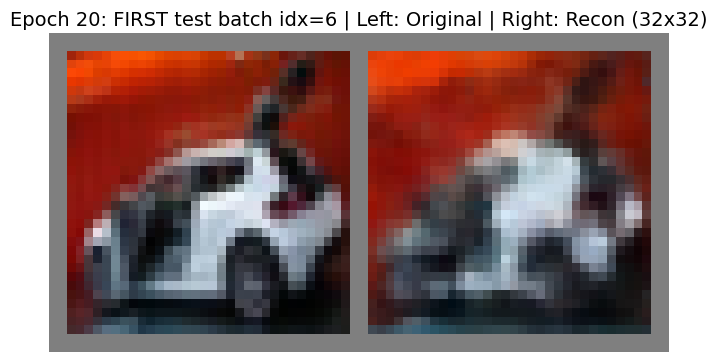

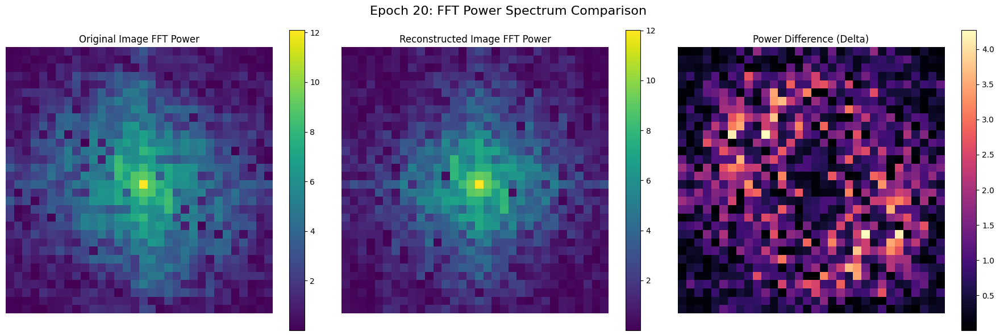

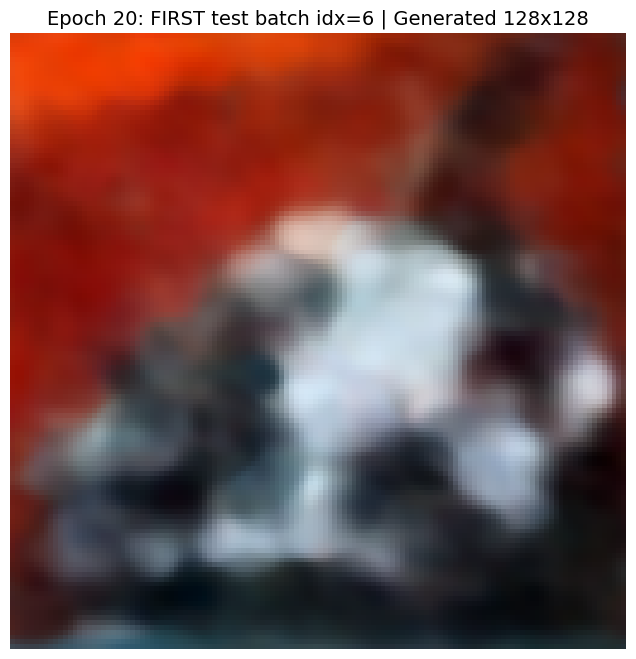

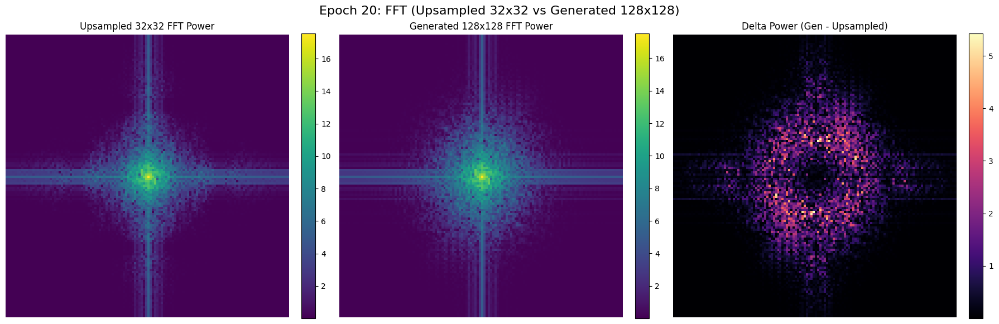

Epoch [21/50], Step [200/782], LR: 0.000129, Loss: 0.0082
Epoch [21/50], Step [400/782], LR: 0.000128, Loss: 0.0091
Epoch [21/50], Step [600/782], LR: 0.000126, Loss: 0.0088
--- Epoch [21/50] Summary ---
  Avg Training Loss (target 20%): 0.0091
  Val Loss (target 20%, FIRST test batch idx=6): 0.0616
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0491



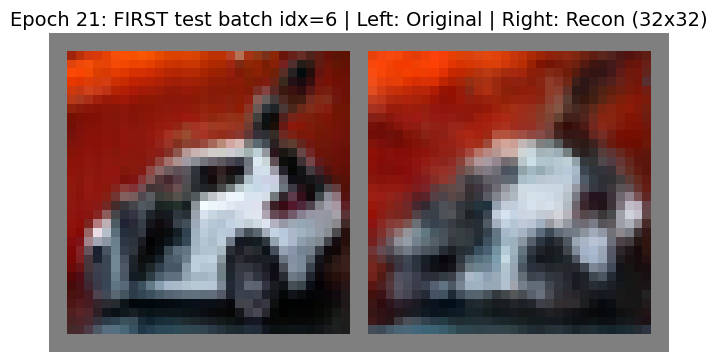

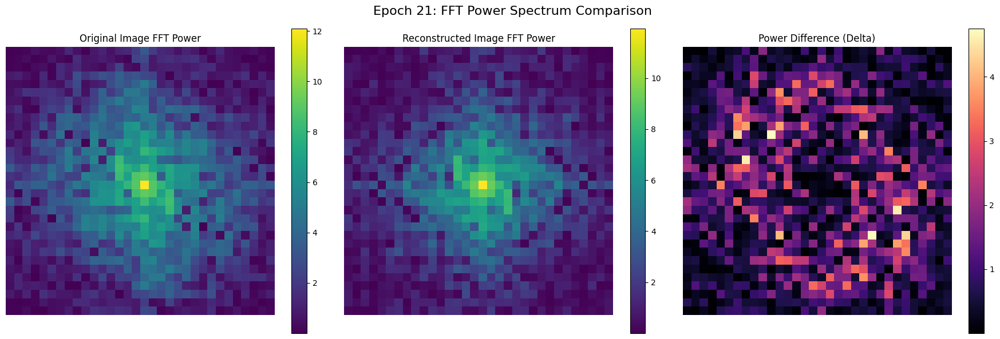

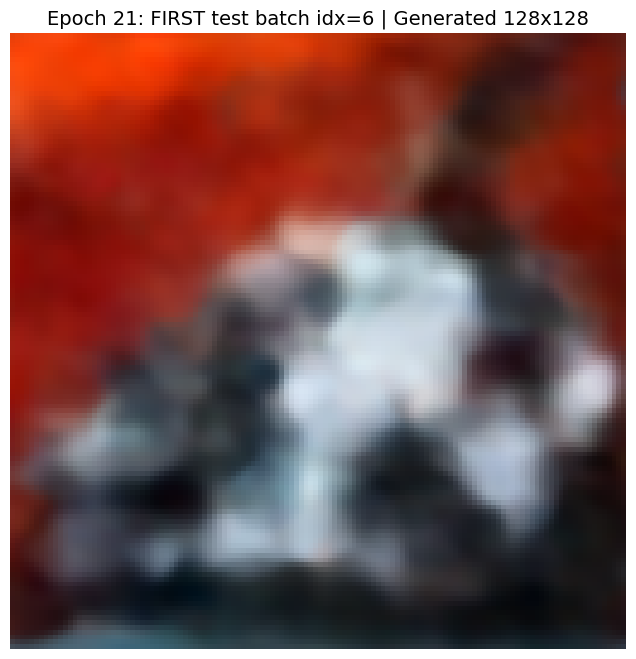

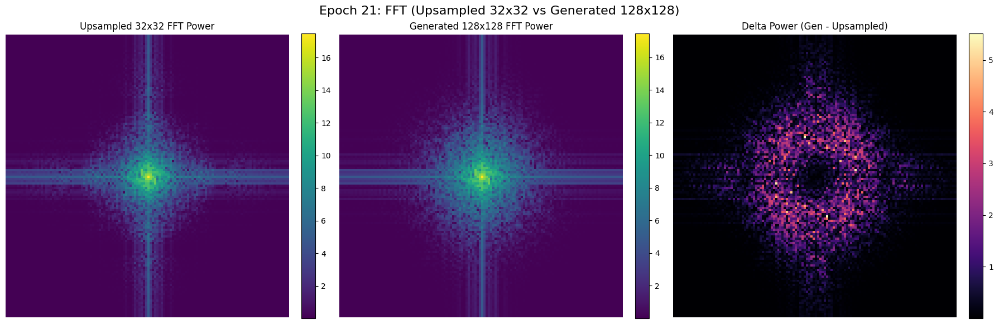

Epoch [22/50], Step [200/782], LR: 0.000123, Loss: 0.0083
Epoch [22/50], Step [400/782], LR: 0.000122, Loss: 0.0084
Epoch [22/50], Step [600/782], LR: 0.000120, Loss: 0.0081
--- Epoch [22/50] Summary ---
  Avg Training Loss (target 20%): 0.0083
  Val Loss (target 20%, FIRST test batch idx=6): 0.0738
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0571



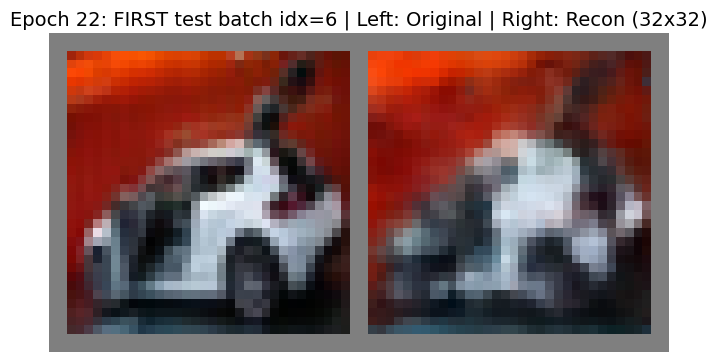

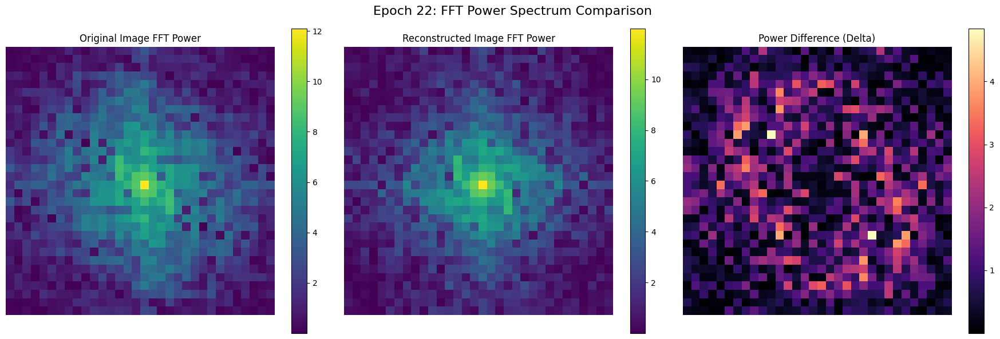

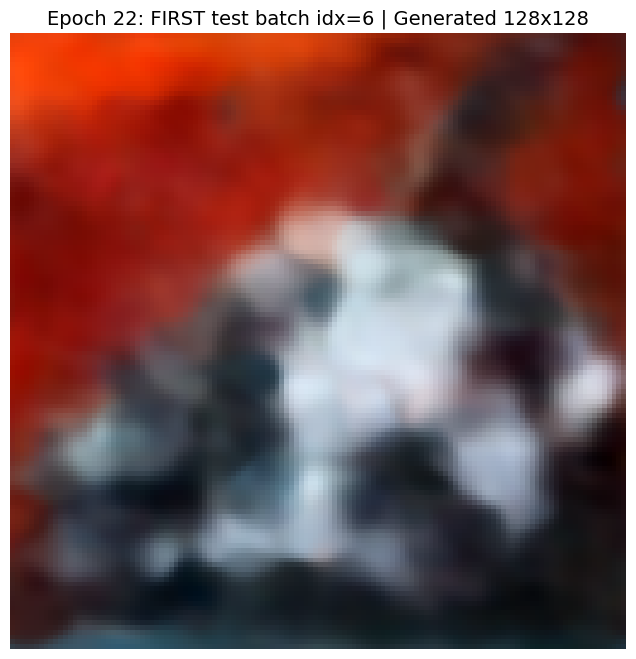

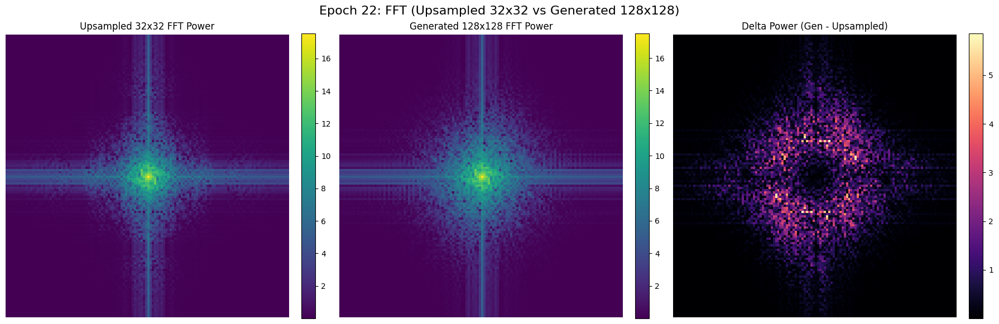

Epoch [23/50], Step [200/782], LR: 0.000117, Loss: 0.0075
Epoch [23/50], Step [400/782], LR: 0.000116, Loss: 0.0074
Epoch [23/50], Step [600/782], LR: 0.000114, Loss: 0.0076
--- Epoch [23/50] Summary ---
  Avg Training Loss (target 20%): 0.0076
  Val Loss (target 20%, FIRST test batch idx=6): 0.0697
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0539



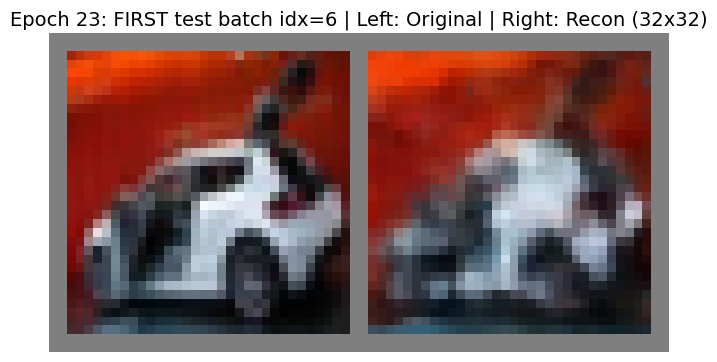

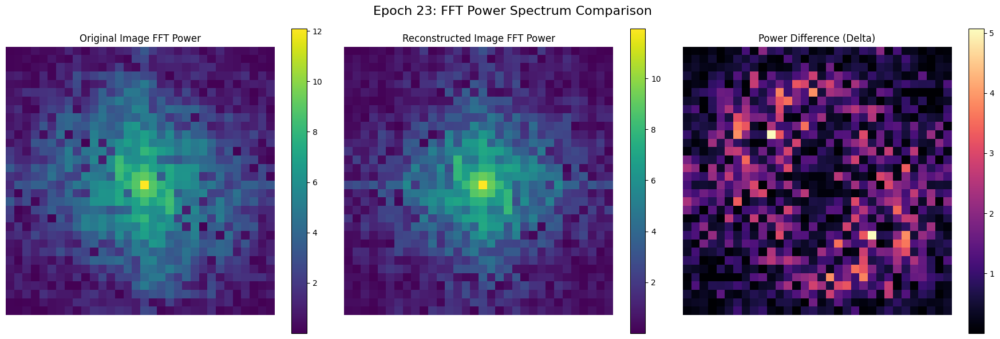

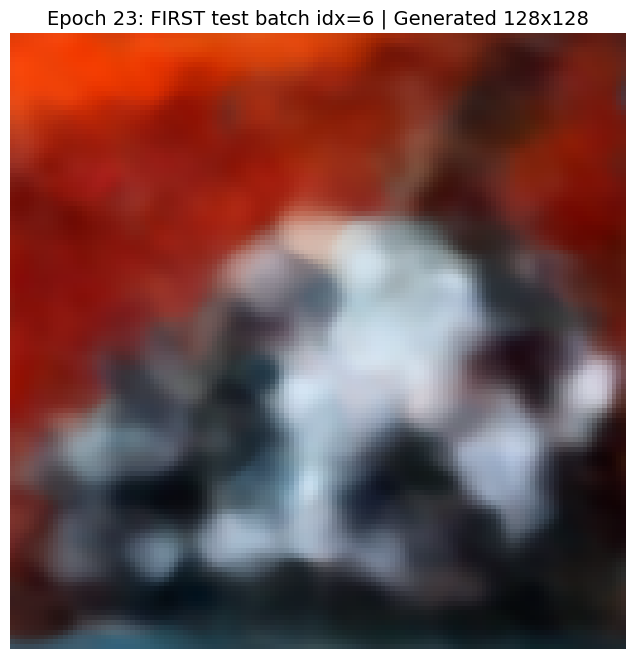

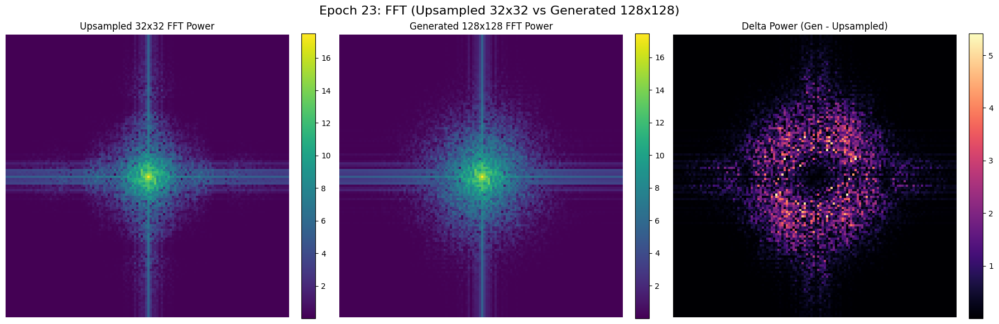

Epoch [24/50], Step [200/782], LR: 0.000111, Loss: 0.0069
Epoch [24/50], Step [400/782], LR: 0.000109, Loss: 0.0066
Epoch [24/50], Step [600/782], LR: 0.000108, Loss: 0.0071
--- Epoch [24/50] Summary ---
  Avg Training Loss (target 20%): 0.0070
  Val Loss (target 20%, FIRST test batch idx=6): 0.0702
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0557



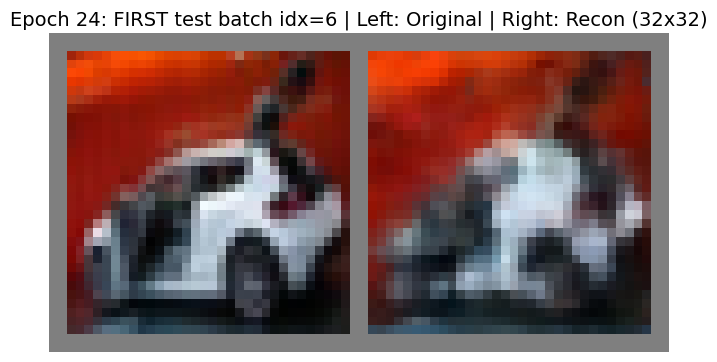

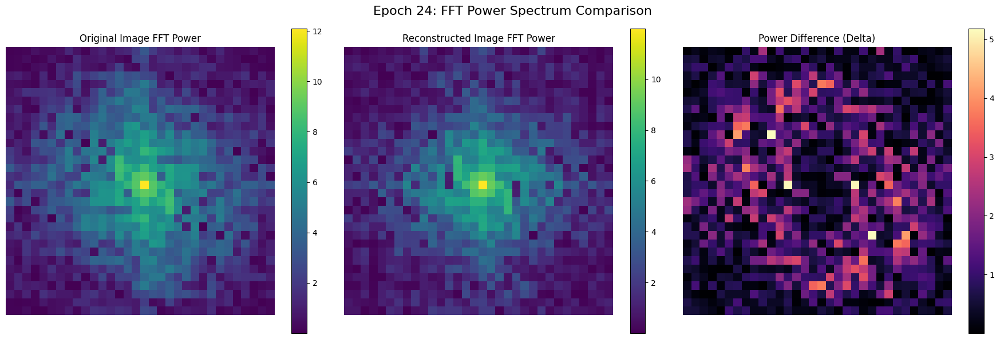

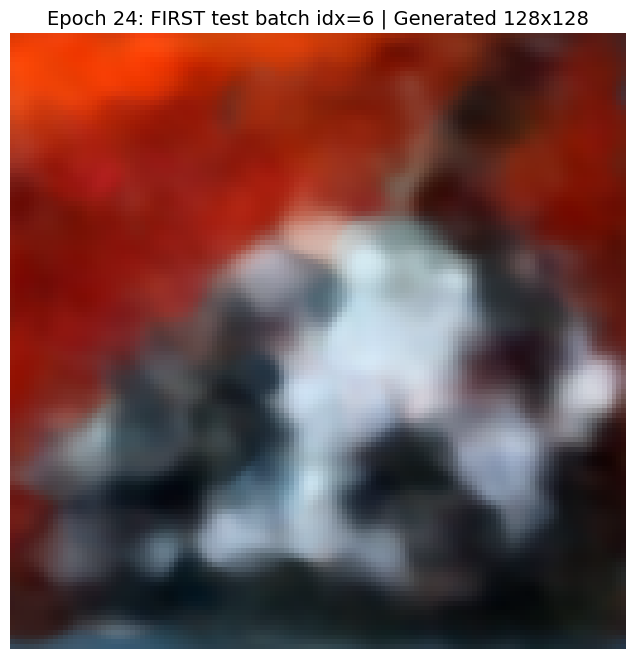

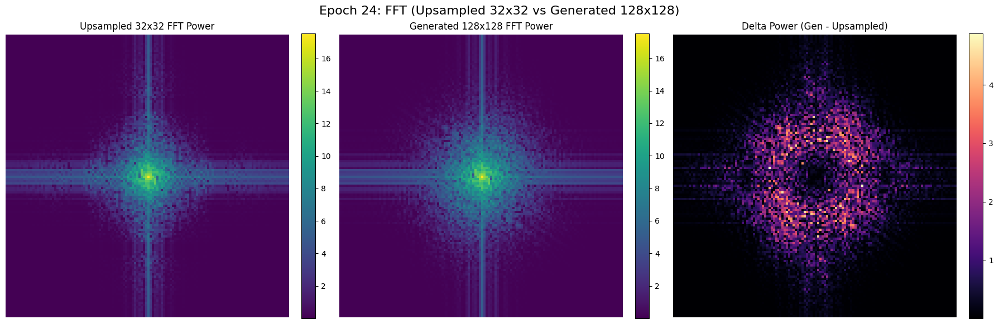

Epoch [25/50], Step [200/782], LR: 0.000105, Loss: 0.0063
Epoch [25/50], Step [400/782], LR: 0.000103, Loss: 0.0061
Epoch [25/50], Step [600/782], LR: 0.000101, Loss: 0.0060
--- Epoch [25/50] Summary ---
  Avg Training Loss (target 20%): 0.0064
  Val Loss (target 20%, FIRST test batch idx=6): 0.0716
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0560



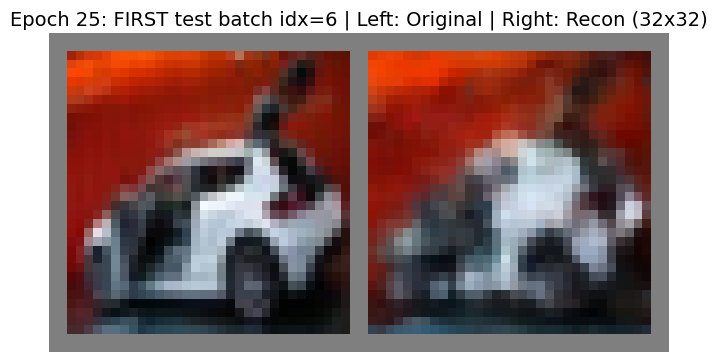

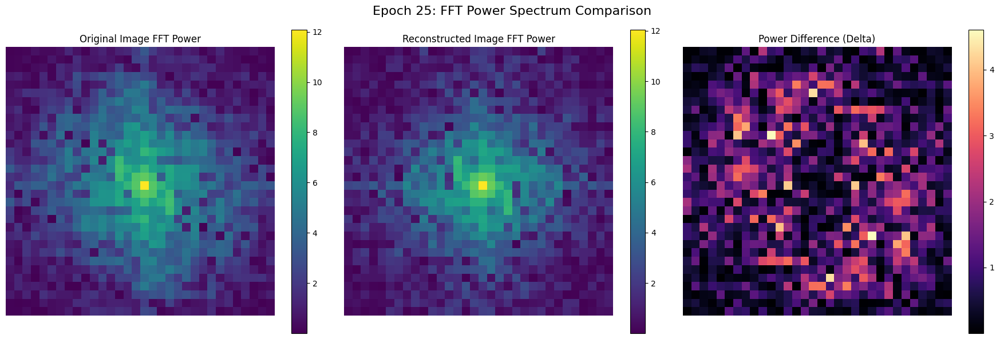

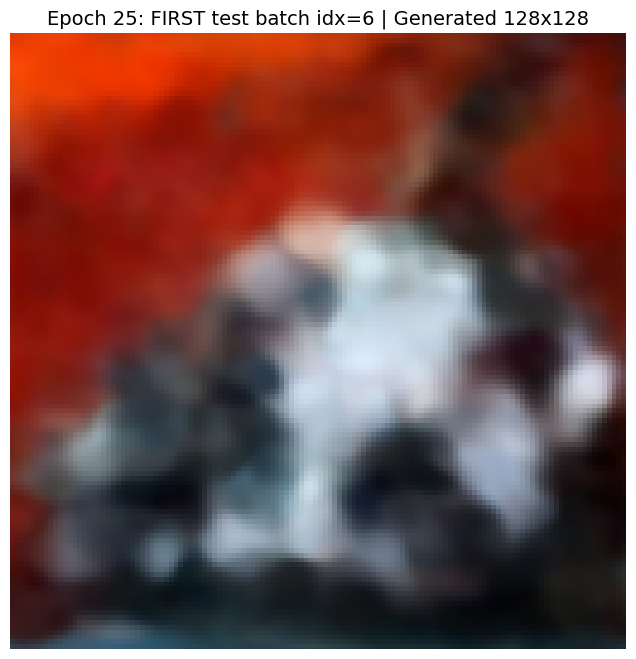

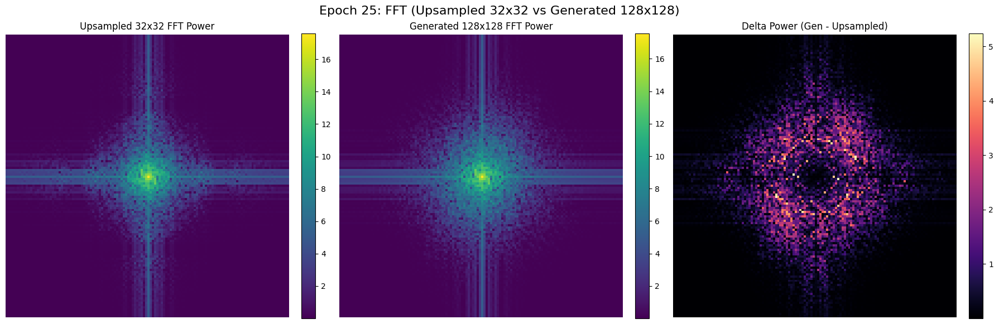

Epoch [26/50], Step [200/782], LR: 0.000098, Loss: 0.0056
Epoch [26/50], Step [400/782], LR: 0.000097, Loss: 0.0053
Epoch [26/50], Step [600/782], LR: 0.000095, Loss: 0.0059
--- Epoch [26/50] Summary ---
  Avg Training Loss (target 20%): 0.0059
  Val Loss (target 20%, FIRST test batch idx=6): 0.0709
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0578



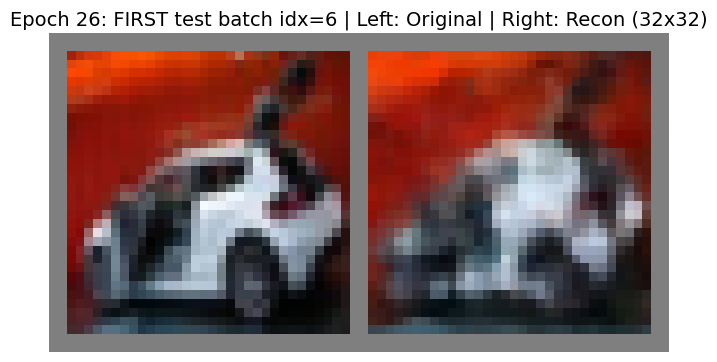

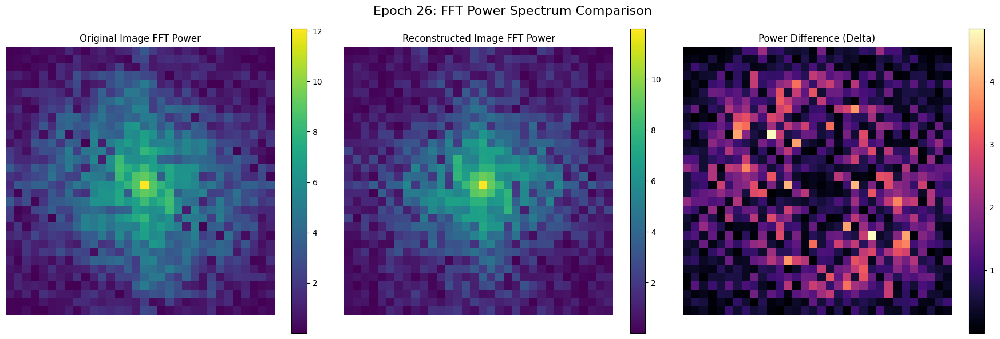

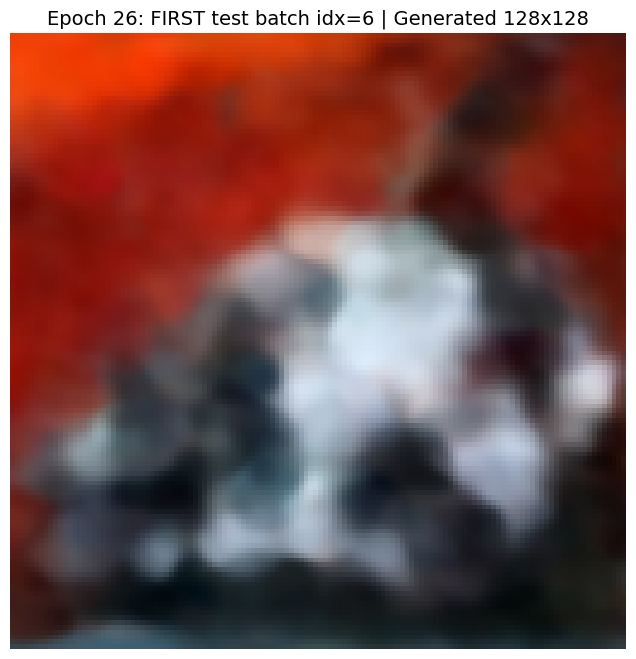

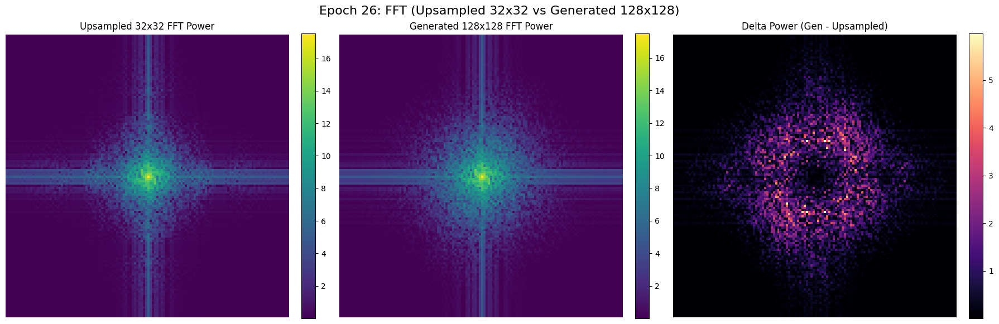

Epoch [27/50], Step [200/782], LR: 0.000092, Loss: 0.0053
Epoch [27/50], Step [400/782], LR: 0.000091, Loss: 0.0050
Epoch [27/50], Step [600/782], LR: 0.000089, Loss: 0.0057
--- Epoch [27/50] Summary ---
  Avg Training Loss (target 20%): 0.0054
  Val Loss (target 20%, FIRST test batch idx=6): 0.0678
  Val Loss (FULL 32x32, FIRST test batch idx=6): 0.0552



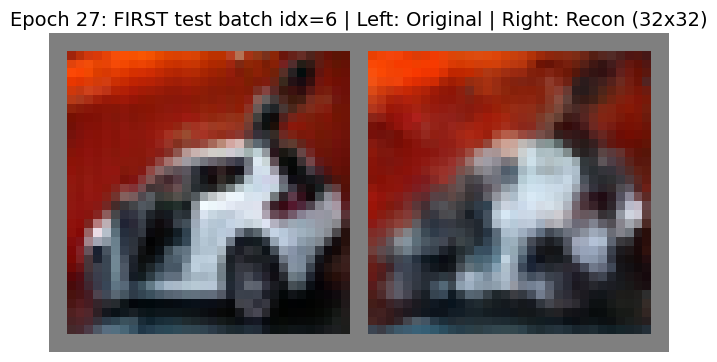

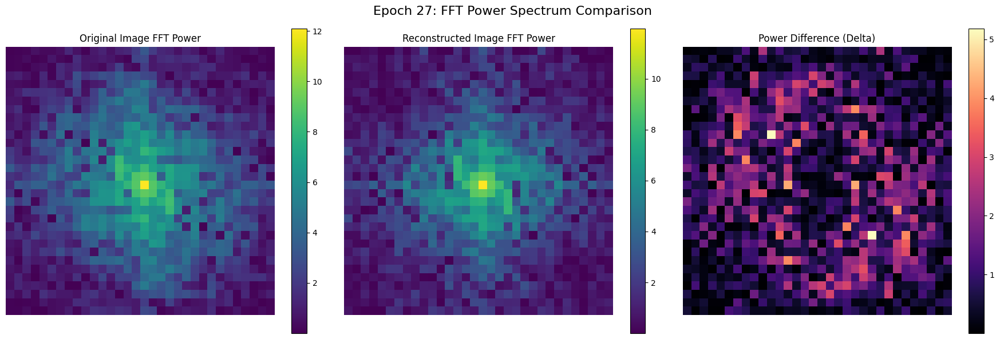

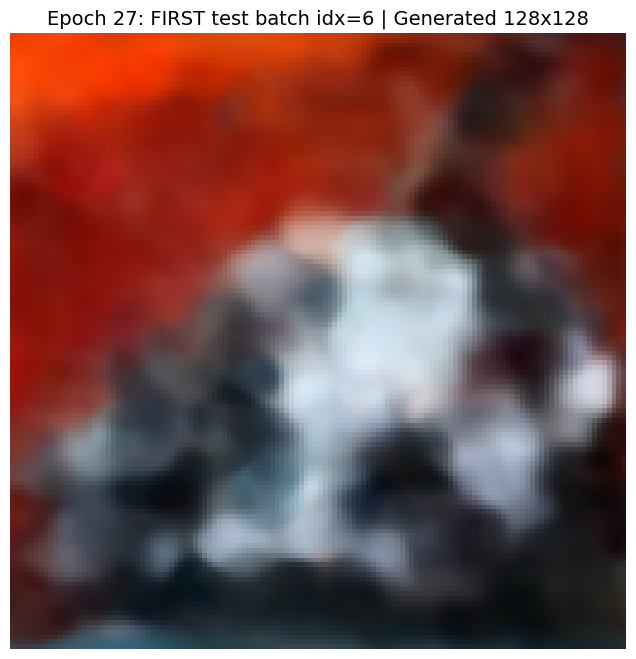

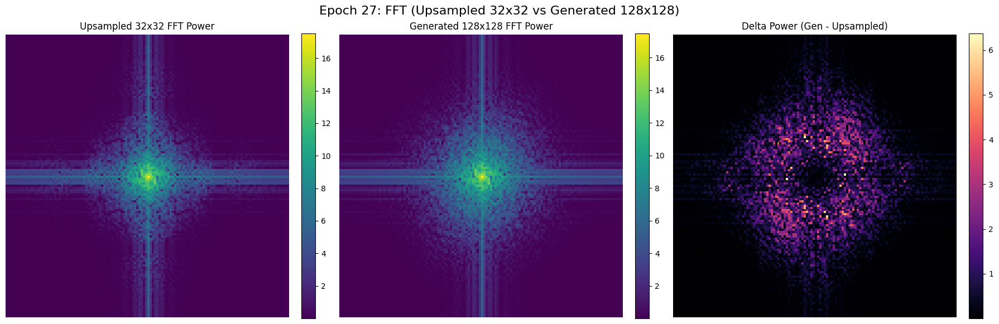

Epoch [28/50], Step [200/782], LR: 0.000086, Loss: 0.0048
Epoch [28/50], Step [400/782], LR: 0.000084, Loss: 0.0050


In [ ]:
# ===============================================================
# Sparse PerceiverIO CIFAR-10 (fixed per-instance masks)
# 40% observed = 20% conditioning + 20% target-loss (fixed per image)
# PLUS: always evaluate + visualize ONLY the 7th image of the FIRST test batch (idx=6)
# ===============================================================

from torch.optim import AdamW
import torch
from torch.optim.lr_scheduler import CosineAnnealingLR
from einops import rearrange, repeat
import ssl
import torchvision
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
from math import log
from functools import wraps
import torch.nn.functional as F
import torch.nn as nn
from torch.utils.data import DataLoader

# Fix for torchvision dataset download issue
ssl._create_default_https_context = ssl._create_unverified_context

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("DEVICE:", DEVICE)

# ===============================================================
# --- 1) Model Helpers ---
# ===============================================================

def exists(val):
    return val is not None

def default(val, d):
    return val if exists(val) else d

def cache_fn(f):
    cache = None
    @wraps(f)
    def cached_fn(*args, _cache=True, **kwargs):
        if not _cache:
            return f(*args, **kwargs)
        nonlocal cache
        if cache is not None:
            return cache
        cache = f(*args, **kwargs)
        return cache
    return cached_fn

class PreNorm(nn.Module):
    def __init__(self, dim, fn, context_dim=None):
        super().__init__()
        self.fn = fn
        self.norm = nn.LayerNorm(dim)
        self.norm_context = nn.LayerNorm(context_dim) if exists(context_dim) else None

    def forward(self, x, **kwargs):
        x = self.norm(x)
        if exists(self.norm_context):
            context = kwargs["context"]
            kwargs["context"] = self.norm_context(context)
        return self.fn(x, **kwargs)

class GEGLU(nn.Module):
    def forward(self, x):
        x, gates = x.chunk(2, dim=-1)
        return x * F.gelu(gates)

class FeedForward(nn.Module):
    def __init__(self, dim, mult=4):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(dim, dim * mult * 2),
            GEGLU(),
            nn.Linear(dim * mult, dim)
        )

    def forward(self, x):
        return self.net(x)

class Attention(nn.Module):
    def __init__(self, query_dim, context_dim=None, heads=8, dim_head=64):
        super().__init__()
        inner_dim = dim_head * heads
        context_dim = default(context_dim, query_dim)
        self.scale = dim_head ** -0.5
        self.heads = heads

        self.to_q  = nn.Linear(query_dim, inner_dim, bias=False)
        self.to_kv = nn.Linear(context_dim, inner_dim * 2, bias=False)
        self.to_out = nn.Linear(inner_dim, query_dim)

        self.latest_attn = None

    def forward(self, x, context=None, mask=None):
        h = self.heads
        q = self.to_q(x)
        context = default(context, x)
        k, v = self.to_kv(context).chunk(2, dim=-1)

        q, k, v = map(lambda t: rearrange(t, "b n (h d) -> (b h) n d", h=h), (q, k, v))
        sim = torch.einsum("b i d, b j d -> b i j", q, k) * self.scale

        if exists(mask):
            mask = rearrange(mask, "b ... -> b (...)")
            max_neg_value = -torch.finfo(sim.dtype).max
            mask = repeat(mask, "b j -> (b h) () j", h=h)
            sim.masked_fill_(~mask, max_neg_value)

        attn = sim.softmax(dim=-1)
        self.latest_attn = attn.detach()

        out = torch.einsum("b i j, b j d -> b i d", attn, v)
        out = rearrange(out, "(b h) n d -> b n (h d)", h=h)
        return self.to_out(out)

def get_sinusoidal_embeddings(n, d):
    assert d % 2 == 0, "latent_dim must be even"
    position = torch.arange(n, dtype=torch.float).unsqueeze(1)
    div_term = torch.exp(torch.arange(0, d, 2).float() * -(log(10000.0) / d))
    pe = torch.zeros(n, d)
    pe[:, 0::2] = torch.sin(position * div_term)
    pe[:, 1::2] = torch.cos(position * div_term)
    return pe

# ===============================================================
# --- 2) Cascaded PerceiverIO ---
# ===============================================================

class CascadedBlock(nn.Module):
    def __init__(self, dim, n_latents, input_dim, cross_heads, cross_dim_head, self_heads, self_dim_head, residual_dim=None):
        super().__init__()
        self.latents = nn.Parameter(get_sinusoidal_embeddings(n_latents, dim), requires_grad=False)

        self.cross_attn = PreNorm(
            dim,
            Attention(dim, input_dim, heads=cross_heads, dim_head=cross_dim_head),
            context_dim=input_dim
        )
        self.self_attn = PreNorm(dim, Attention(dim, heads=self_heads, dim_head=self_dim_head))
        self.residual_proj = nn.Linear(residual_dim, dim) if residual_dim and residual_dim != dim else None
        self.ff = PreNorm(dim, FeedForward(dim))

    def forward(self, x, context, mask=None, residual=None):
        b = context.size(0)
        latents = repeat(self.latents, "n d -> b n d", b=b)

        latents = self.cross_attn(latents, context=context, mask=mask) + latents

        if residual is not None:
            if self.residual_proj:
                residual = self.residual_proj(residual)
            latents = latents + residual

        latents = self.self_attn(latents) + latents
        latents = self.ff(latents) + latents
        return latents

class CascadedPerceiverIO(nn.Module):
    def __init__(
        self,
        *,
        input_dim,
        queries_dim,
        logits_dim=None,
        latent_dims=(256, 384, 512),
        num_latents=(256, 256, 256),
        cross_heads=4,
        cross_dim_head=128,
        self_heads=8,
        self_dim_head=128,
        decoder_ff=False,
    ):
        super().__init__()
        assert len(latent_dims) == len(num_latents), "latent_dims and num_latents must have same length"

        # (unused, left intact)
        self.input_proj = nn.Sequential(
            nn.Linear(4, 128),
            nn.GELU(),
            nn.Linear(128, 128)
        )
        self.projection_matrix = nn.Parameter(torch.randn(4, 128) / np.sqrt(4))

        self.encoder_blocks = nn.ModuleList()
        prev_dim = None
        for dim, n_latents in zip(latent_dims, num_latents):
            self.encoder_blocks.append(
                CascadedBlock(
                    dim=dim,
                    n_latents=n_latents,
                    input_dim=input_dim,
                    cross_heads=cross_heads,
                    cross_dim_head=cross_dim_head,
                    self_heads=self_heads,
                    self_dim_head=self_dim_head,
                    residual_dim=prev_dim
                )
            )
            prev_dim = dim

        final_latent_dim = latent_dims[-1]
        self.decoder_cross_attn = PreNorm(
            queries_dim,
            Attention(queries_dim, final_latent_dim, heads=cross_heads, dim_head=cross_dim_head),
            context_dim=final_latent_dim
        )

        self.decoder_ff = PreNorm(queries_dim, FeedForward(queries_dim)) if decoder_ff else None
        self.to_logits = nn.Linear(queries_dim, logits_dim) if exists(logits_dim) else nn.Identity()

        self.self_attn_blocks = nn.Sequential(*[
            nn.Sequential(
                PreNorm(final_latent_dim, Attention(final_latent_dim, heads=self_heads, dim_head=self_dim_head)),
                PreNorm(final_latent_dim, FeedForward(final_latent_dim))
            )
            for _ in range(4)
        ])

    def forward(self, data, mask=None, queries=None):
        b = data.size(0)
        residual = None

        for block in self.encoder_blocks:
            residual = block(x=residual, context=data, mask=mask, residual=residual)

        for sa_block in self.self_attn_blocks:
            residual = sa_block[0](residual) + residual
            residual = sa_block[1](residual) + residual

        if queries is None:
            return residual

        if queries.ndim == 2:
            queries = repeat(queries, "n d -> b n d", b=b)

        x = self.decoder_cross_attn(queries, context=residual)
        x = x + queries

        if self.decoder_ff:
            x = x + self.decoder_ff(x)

        return self.to_logits(x)

# ===============================================================
# --- 3) Fourier Features Encoder ---
# ===============================================================

class GaussianFourierFeatures(nn.Module):
    def __init__(self, in_features, mapping_size, scale=15.0):
        super().__init__()
        self.register_buffer("B", torch.randn((in_features, mapping_size)) * scale)

    def forward(self, coords):
        # coords: (B, N, in_features)
        projections = coords @ self.B
        return torch.cat([torch.sin(projections), torch.cos(projections)], dim=-1)

# ===============================================================
# --- 4) Config ---
# ===============================================================

BATCH_SIZE = 64
EPOCHS = 50
LEARNING_RATE = 2e-4

IMAGE_SIZE_TRAIN = 32
IMAGE_SIZE_HI_RES = 128
CHANNELS = 3

FOURIER_MAPPING_SIZE = 96
POS_EMBED_DIM = FOURIER_MAPPING_SIZE * 2
INPUT_DIM = CHANNELS + POS_EMBED_DIM
QUERIES_DIM = POS_EMBED_DIM
LOGITS_DIM = CHANNELS

COND_FRAC = 0.20
TGT_FRAC  = 0.20
MASK_SEED_TRAIN = 12345
MASK_SEED_TEST  = 54321

# ===============================================================
# --- 5) Fixed-per-instance sparse dataset + gather helper ---
# ===============================================================

class CIFAR10WithFixedSparseSplit(torchvision.datasets.CIFAR10):
    """
    Returns: (image, label, cond_idx, tgt_idx)
    cond_idx and tgt_idx are FIXED per dataset index.
    """
    def __init__(self, *args, cond_frac=0.2, tgt_frac=0.2, mask_seed=12345, **kwargs):
        super().__init__(*args, **kwargs)
        self.n_pixels = IMAGE_SIZE_TRAIN * IMAGE_SIZE_TRAIN
        self.n_cond = int(cond_frac * self.n_pixels)
        self.n_tgt  = int(tgt_frac  * self.n_pixels)
        assert self.n_cond + self.n_tgt <= self.n_pixels, "cond+tgt exceeds total pixels"

        self.cond_idx = torch.empty((len(self), self.n_cond), dtype=torch.int64)
        self.tgt_idx  = torch.empty((len(self), self.n_tgt),  dtype=torch.int64)

        g = torch.Generator()
        for i in range(len(self)):
            g.manual_seed(mask_seed + i)
            perm = torch.randperm(self.n_pixels, generator=g)
            self.cond_idx[i] = perm[:self.n_cond]
            self.tgt_idx[i]  = perm[self.n_cond:self.n_cond + self.n_tgt]

    def __getitem__(self, idx):
        img, y = super().__getitem__(idx)
        return img, y, self.cond_idx[idx], self.tgt_idx[idx]

def batched_gather(x, idx):
    """
    x:   (B, N, D)
    idx: (B, K) long
    out: (B, K, D)
    """
    B, N, D = x.shape
    idx = idx.unsqueeze(-1).expand(B, idx.shape[1], D)
    return x.gather(1, idx)

# ===============================================================
# --- 6) Data ---
# ===============================================================

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

train_dataset = CIFAR10WithFixedSparseSplit(
    root="./data", train=True, download=True, transform=transform,
    cond_frac=COND_FRAC, tgt_frac=TGT_FRAC, mask_seed=MASK_SEED_TRAIN
)
test_dataset = CIFAR10WithFixedSparseSplit(
    root="./data", train=False, download=True, transform=transform,
    cond_frac=COND_FRAC, tgt_frac=TGT_FRAC, mask_seed=MASK_SEED_TEST
)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,  num_workers=4, pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)

# ===============================================================
# --- 7) Model + Optim ---
# ===============================================================

fourier_encoder = GaussianFourierFeatures(in_features=2, mapping_size=FOURIER_MAPPING_SIZE, scale=15.0).to(DEVICE)

model = CascadedPerceiverIO(
    input_dim=INPUT_DIM,
    queries_dim=QUERIES_DIM,
    logits_dim=LOGITS_DIM,
    latent_dims=(256, 384, 512),
    num_latents=(256, 256, 256),
    decoder_ff=True
).to(DEVICE)

optimizer = AdamW(list(model.parameters()) + list(fourier_encoder.parameters()), lr=LEARNING_RATE)
loss_fn = nn.MSELoss()
scheduler = CosineAnnealingLR(optimizer, T_max=EPOCHS * len(train_loader))

total_params = sum(p.numel() for p in model.parameters()) + sum(p.numel() for p in fourier_encoder.parameters())
print(f"Total parameters: {total_params/1e6:.2f}M")

# ===============================================================
# --- 8) Grids + Input prep ---
# ===============================================================

def create_coordinate_grid(h, w, device):
    grid = torch.stack(torch.meshgrid(
        torch.linspace(-1.0, 1.0, h, device=device),
        torch.linspace(-1.0, 1.0, w, device=device),
        indexing="ij"
    ), dim=-1)
    return rearrange(grid, "h w c -> (h w) c")  # (N, 2)

coords_32x32   = create_coordinate_grid(IMAGE_SIZE_TRAIN,  IMAGE_SIZE_TRAIN,  DEVICE)
coords_128x128 = create_coordinate_grid(IMAGE_SIZE_HI_RES, IMAGE_SIZE_HI_RES, DEVICE)

def prepare_model_input(images, coords, fourier_encoder_fn):
    """
    images: (B, C, H, W)
    coords: (N, 2)
    Returns:
      full_input_with_pos: (B, N, C + pos_dim)
      full_pixels:         (B, N, C)
      full_coords:         (B, N, 2)
    """
    b, c, h, w = images.shape
    pixels = rearrange(images, "b c h w -> b (h w) c")           # (B, N, C)
    full_coords = repeat(coords, "n d -> b n d", b=b)            # (B, N, 2)
    pos_embeddings = fourier_encoder_fn(full_coords)             # (B, N, pos)
    full_input_with_pos = torch.cat((pixels, pos_embeddings), dim=-1)
    return full_input_with_pos, pixels, full_coords

def imshow(img, title):
    img = img.detach().cpu() / 2 + 0.5
    img = img.clamp(0, 1)  # avoids matplotlib clipping warning
    npimg = img.numpy()
    plt.figure(figsize=(8, 8))
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.title(title, fontsize=14)
    plt.axis("off")
    plt.show()

# ===============================================================
# --- 9) FFT validation helpers (unchanged) ---
# ===============================================================

def calculate_and_visualize_fft_power_delta(original_imgs, recon_imgs, epoch_num):
    original_img = original_imgs[0]
    recon_img = recon_imgs[0]

    original_gray = transforms.functional.rgb_to_grayscale(original_img)
    recon_gray    = transforms.functional.rgb_to_grayscale(recon_img)

    def get_log_power_spectrum(img_tensor):
        img_tensor = img_tensor.squeeze(0)
        fft = torch.fft.fft2(img_tensor)
        fft_shifted = torch.fft.fftshift(fft)
        power_spectrum = torch.abs(fft_shifted) ** 2
        log_power_spectrum = torch.log1p(power_spectrum)
        return log_power_spectrum.detach().cpu().numpy()

    original_fft_power = get_log_power_spectrum(original_gray)
    recon_fft_power    = get_log_power_spectrum(recon_gray)
    delta_power        = np.abs(original_fft_power - recon_fft_power)

    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle(f"Epoch {epoch_num}: FFT Power Spectrum Comparison", fontsize=16)

    im1 = axs[0].imshow(original_fft_power, cmap="viridis")
    axs[0].set_title("Original Image FFT Power")
    axs[0].axis("off")
    fig.colorbar(im1, ax=axs[0])

    im2 = axs[1].imshow(recon_fft_power, cmap="viridis")
    axs[1].set_title("Reconstructed Image FFT Power")
    axs[1].axis("off")
    fig.colorbar(im2, ax=axs[1])

    im3 = axs[2].imshow(delta_power, cmap="magma")
    axs[2].set_title("Power Difference (Delta)")
    axs[2].axis("off")
    fig.colorbar(im3, ax=axs[2])

    plt.tight_layout()
    plt.show()

def compare_fft_upsampled_vs_generated(recon_32_imgs, gen_128_imgs, epoch_num):
    recon_32 = recon_32_imgs[0]
    gen_128  = gen_128_imgs[0]

    recon_32_gray = transforms.functional.rgb_to_grayscale(recon_32)
    gen_128_gray  = transforms.functional.rgb_to_grayscale(gen_128)

    upsampled_recon_gray = F.interpolate(
        recon_32_gray.unsqueeze(0), size=(128, 128), mode="bilinear", align_corners=False
    ).squeeze(0)

    def get_log_power_spectrum(img_tensor):
        img_tensor = img_tensor.squeeze(0)
        fft = torch.fft.fft2(img_tensor)
        fft_shifted = torch.fft.fftshift(fft)
        power = torch.abs(fft_shifted) ** 2
        log_power = torch.log1p(power)
        return log_power.detach().cpu().numpy()

    upsampled_fft = get_log_power_spectrum(upsampled_recon_gray)
    generated_fft = get_log_power_spectrum(gen_128_gray)
    delta_power   = np.abs(generated_fft - upsampled_fft)

    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle(f"Epoch {epoch_num}: FFT (Upsampled 32x32 vs Generated 128x128)", fontsize=16)

    im0 = axs[0].imshow(upsampled_fft, cmap="viridis")
    axs[0].set_title("Upsampled 32x32 FFT Power")
    axs[0].axis("off")
    fig.colorbar(im0, ax=axs[0], fraction=0.046, pad=0.04)

    im1 = axs[1].imshow(generated_fft, cmap="viridis")
    axs[1].set_title("Generated 128x128 FFT Power")
    axs[1].axis("off")
    fig.colorbar(im1, ax=axs[1], fraction=0.046, pad=0.04)

    im2 = axs[2].imshow(delta_power, cmap="magma")
    axs[2].set_title("Delta Power (Gen - Upsampled)")
    axs[2].axis("off")
    fig.colorbar(im2, ax=axs[2], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

# ===============================================================
# --- 9.5) FIXED TRACKED EXAMPLE: FIRST test batch, idx=6 (your red car)
# ===============================================================

fixed_images_cpu, fixed_labels_cpu, fixed_cond_idx_cpu, fixed_tgt_idx_cpu = next(iter(test_loader))
FIXED_J = 6 if fixed_images_cpu.size(0) > 6 else 0
FIXED_DATASET_INDEX = FIXED_J  # first batch corresponds to dataset indices [0..BATCH_SIZE-1] when shuffle=False

print(f"[Tracking] FIRST test batch idx={FIXED_J} (dataset idx ~ {FIXED_DATASET_INDEX}), label={int(fixed_labels_cpu[FIXED_J])}")

# ===============================================================
# --- 10) Train (sparse conditioning + sparse loss) ---
# ===============================================================

print("--- Training starts ---")
for epoch in range(EPOCHS):
    model.train()
    fourier_encoder.train()
    total_train_loss = 0.0

    for i, (images, _, cond_idx, tgt_idx) in enumerate(train_loader):
        images   = images.to(DEVICE, non_blocking=True)
        cond_idx = cond_idx.to(DEVICE, non_blocking=True)
        tgt_idx  = tgt_idx.to(DEVICE, non_blocking=True)

        full_input, full_pixels, full_coords = prepare_model_input(images, coords_32x32, fourier_encoder)

        # 20% conditioning tokens
        cond_context = batched_gather(full_input, cond_idx)      # (B, N_COND, C+pos)

        # 20% target tokens (loss)
        tgt_pixels = batched_gather(full_pixels, tgt_idx)        # (B, N_TGT, C)
        tgt_coords = batched_gather(full_coords, tgt_idx)        # (B, N_TGT, 2)
        queries    = fourier_encoder(tgt_coords)                 # (B, N_TGT, pos)

        optimizer.zero_grad(set_to_none=True)
        pred_tgt = model(cond_context, queries=queries)          # (B, N_TGT, C)
        loss = loss_fn(pred_tgt, tgt_pixels)

        loss.backward()
        optimizer.step()
        scheduler.step()

        total_train_loss += loss.item()

        if (i + 1) % 200 == 0:
            print(f"Epoch [{epoch+1}/{EPOCHS}], Step [{i+1}/{len(train_loader)}], "
                  f"LR: {scheduler.get_last_lr()[0]:.6f}, Loss: {loss.item():.4f}")

    avg_train_loss = total_train_loss / len(train_loader)

    # ===============================================================
    # Validation + Visualization: ONLY the FIXED tracked example
    # ===============================================================
    model.eval()
    fourier_encoder.eval()

    with torch.no_grad():
        # grab the fixed example (CPU -> GPU)
        img   = fixed_images_cpu[FIXED_J:FIXED_J+1].to(DEVICE, non_blocking=True)       # (1,C,32,32)
        cidx  = fixed_cond_idx_cpu[FIXED_J:FIXED_J+1].to(DEVICE, non_blocking=True)    # (1,N_COND)
        tidx  = fixed_tgt_idx_cpu[FIXED_J:FIXED_J+1].to(DEVICE, non_blocking=True)     # (1,N_TGT)

        full_input, full_pixels, full_coords = prepare_model_input(img, coords_32x32, fourier_encoder)
        cond_context = batched_gather(full_input, cidx)

        # --- target-only loss (20% supervised target points) ---
        tgt_pixels  = batched_gather(full_pixels, tidx)
        tgt_coords  = batched_gather(full_coords, tidx)
        queries_tgt = fourier_encoder(tgt_coords)
        pred_tgt    = model(cond_context, queries=queries_tgt)
        val_loss_tgt = loss_fn(pred_tgt, tgt_pixels).item()

        # --- full-grid loss (32x32) ---
        all_coords  = repeat(coords_32x32, "n d -> b n d", b=1)
        all_queries = fourier_encoder(all_coords)
        pred_full   = model(cond_context, queries=all_queries)
        val_loss_full = loss_fn(pred_full, full_pixels).item()

    print(f"--- Epoch [{epoch+1}/{EPOCHS}] Summary ---")
    print(f"  Avg Training Loss (target 20%): {avg_train_loss:.4f}")
    print(f"  Val Loss (target 20%, FIRST test batch idx={FIXED_J}): {val_loss_tgt:.4f}")
    print(f"  Val Loss (FULL 32x32, FIRST test batch idx={FIXED_J}): {val_loss_full:.4f}\n")

    # --------------------
    # Visualization for the SAME fixed example
    # --------------------
    with torch.no_grad():
        b, c, h, w = img.shape

        # 32x32 reconstruction (reshape pred_full)
        recon_images = rearrange(pred_full, "b (h w) c -> b c h w", h=h, w=w)

        # show original vs recon (single pair)
        comparison = torch.cat((img, recon_images), dim=0)  # (2,C,H,W)
        grid = torchvision.utils.make_grid(comparison, nrow=2, padding=2)
        imshow(grid, f"Epoch {epoch+1}: FIRST test batch idx={FIXED_J} | Left: Original | Right: Recon (32x32)")

        calculate_and_visualize_fft_power_delta(img, recon_images, epoch + 1)

        # 128x128 generation
        hi_coords  = repeat(coords_128x128, "n d -> b n d", b=1)
        hi_queries = fourier_encoder(hi_coords)
        gen_pixels = model(cond_context, queries=hi_queries)
        gen_images = rearrange(gen_pixels, "b (h w) c -> b c h w", h=IMAGE_SIZE_HI_RES, w=IMAGE_SIZE_HI_RES)

        gen_grid = torchvision.utils.make_grid(gen_images, nrow=1, padding=2)
        imshow(gen_grid, f"Epoch {epoch+1}: FIRST test batch idx={FIXED_J} | Generated 128x128")

        compare_fft_upsampled_vs_generated(recon_images, gen_images, epoch + 1)

print("--- Training finished. ---")
